In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
import mat73
parent_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
sys.path.append(parent_dir)
from GLM_regression import *
plt.rcParams.update({'font.size': 12,
                     'axes.spines.right': False,
                     'axes.spines.top':   False,
                     'legend.frameon':    False,})

In [5]:
def split_into_quintiles(array):
    if array.ndim != 2:
        raise ValueError("Input array must be 2-dimensional")
    
    total_columns = array.shape[1]
    quintile_size = total_columns // 5  

    usable_columns = quintile_size * 5
    truncated_array = array[:, :usable_columns]

    split_array = np.split(truncated_array, 5, axis=1)
    
    return split_array

def compute_residual_activity(GLM_params, reorganized_data, quintile=None):
    residual_activity = {}
    avg_residuals = []
    for animal in GLM_params:
        residual_activity[animal] = {}
        for neuron in GLM_params[animal]:
            # Pre-process the data
            neuron_data = reorganized_data[animal][neuron]
            if quintile is not None:
                num_trials = neuron_data.shape[2]
                start_idx,end_idx = get_quintile_indices(num_trials, quintile)
                neuron_data = neuron_data[:, :, start_idx:end_idx]

            flattened_data = flatten_data(neuron_data)
            neuron_activity = neuron_data[:,0,:]

            # Predict activity and compute residuals
            glm_model = GLM_params[animal][neuron]['model']
            flattened_input_variables = flattened_data[:,1:]
            predicted_activity = glm_model.predict(flattened_input_variables)
            predicted_activity = predicted_activity.reshape(neuron_activity.shape)
            
            residual_activity[animal][neuron] = neuron_activity - predicted_activity

            avg_residuals.append(np.mean(residual_activity[animal][neuron], axis=1))
            
   
    avg_residuals = np.array(avg_residuals)
    
    return residual_activity, avg_residuals

residual_activity, avg_residuals = compute_residual_activity(GLM_params, reorganized_data, quintile=None)



NameError: name 'GLM_params' is not defined

In [7]:
def compute_residual_activity(GLM_params, reorganized_data, quintile=None):
    residual_activity = {}
    avg_residuals = []
    for animal in GLM_params:
        residual_activity[animal] = {}
        for neuron in GLM_params[animal]:
            # Pre-process the data
            neuron_data = reorganized_data[animal][neuron]
            if quintile is not None:
                num_trials = neuron_data.shape[2]
                start_idx,end_idx = get_quintile_indices(num_trials, quintile)
                neuron_data = neuron_data[:, :, start_idx:end_idx]

            flattened_data = flatten_data(neuron_data)
            neuron_activity = neuron_data[:,0,:]

            # Predict activity and compute residuals
            glm_model = GLM_params[animal][neuron]['model']
            flattened_input_variables = flattened_data[:,1:]
            predicted_activity = glm_model.predict(flattened_input_variables)
            predicted_activity = predicted_activity.reshape(neuron_activity.shape)
            
            residual_activity[animal][neuron] = neuron_activity - predicted_activity

            avg_residuals.append(np.mean(residual_activity[animal][neuron], axis=1))
            
   
    avg_residuals = np.array(avg_residuals)
    
    return residual_activity, avg_residuals


def compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile):
    GLM_params = fit_GLM(reorganized_data, quintile=quintile, regression='ridge', renormalize=False)
    vars_to_remove = variable_list.copy()[1:] + ['intercept']  
    removing_list = []
   
    for variable in variables_to_remove:
        if variable in variable_list:
            index = variable_list.index(variable)
            removing_list.append(index)
    
    for index in removing_list:
        vars_to_remove.remove(variable_list[index])
    
    filtered_GLM_params = remove_variables_from_glm(GLM_params, vars_to_remove, variable_list)
    residual_activity, avg_residuals = compute_residual_activity(filtered_GLM_params, reorganized_data, quintile=quintile)
    return avg_residuals, GLM_params, residual_activity

def normalize(x, norm):
    if norm == 'min_max':
        return (x - np.min(x)) / (np.max(x) - np.min(x))
    elif norm == 'Z_score':
        return (x - np.mean(x)) / np.std(x)
    else:  
        return x

def Vinje2000(tuning_curve, norm='None'):
    if norm == 'min_max':
        tuning_curve = (tuning_curve - np.min(tuning_curve)) / (np.max(tuning_curve) - np.min(tuning_curve))
    elif norm == 'z_score':
        tuning_curve = (tuning_curve - np.mean(tuning_curve)) / np.std(tuning_curve)
    
    A = np.mean(tuning_curve)**2 / np.mean(tuning_curve**2)
    return (1 - A) / (1 - 1 / len(tuning_curve))


def get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals):
    argmax_list = []
    argmin_list = []
    selectivity = []
    
    normalized_average_residuals = []
    for cell in avg_residuals: 
        cell_selectivity = Vinje2000(cell, norm='min_max')
        selectivity.append(cell_selectivity)
        norm_bin = (cell - np.min(cell)) / (np.max(cell) - np.min(cell))
        normalized_average_residuals.append(norm_bin)
        argmax_list.append(np.argmax(norm_bin))
        argmin_list.append(np.argmin(norm_bin))

    avg_residuals_min_max = np.vstack(normalized_average_residuals)
    
    return avg_residuals_min_max, argmax_list, argmin_list, selectivity


def split_into_quintiles(array):
    if array.ndim != 2:
        raise ValueError("Input array must be 2-dimensional")
    
    total_columns = array.shape[1]
    quintile_size = total_columns // 5  

    usable_columns = quintile_size * 5
    truncated_array = array[:, :usable_columns]

    split_array = np.split(truncated_array, 5, axis=1)
    
    return split_array



datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename = "SSTindivsomata_GLM"
filepath = os.path.join(datasets_dir, filename+".mat")
reorganized_data, variable_list = preprocess_data(filepath, normalize=True)

#variable_list ['Activity'=0, 'Licks'=1, 'Reward_loc'=2, 'Velocity'=3, '#1', '#2', '#3', '#4', '#5', '#6', '#7', '#8', '#9', '#10']

variables_to_remove = ["Velocity", "Licks"]

avg_residuals_SST, GLM_params, residual_activity = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
print(f"avg_residuals_SST.shape {avg_residuals_SST.shape}")

normalized_SST_residuals = normalize(avg_residuals_SST, 'min_max')                                                        

avg_residuals_SST.shape (75, 50)


In [150]:
def Vinje2000(tuning_curve, norm='None'):
    if norm == 'min_max':
        tuning_curve = (tuning_curve - np.min(tuning_curve)) / (np.max(tuning_curve) - np.min(tuning_curve))
    elif norm == 'z_score':
        tuning_curve = (tuning_curve - np.mean(tuning_curve)) / np.std(tuning_curve)
    
    A = np.mean(tuning_curve)**2 / np.mean(tuning_curve**2)
    return (1 - A) / (1 - 1 / len(tuning_curve))


def get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals):
    argmax_list = []
    argmin_list = []
    selectivity = []
    
    normalized_average_residuals = []
    for cell in avg_residuals: 
        cell_selectivity = Vinje2000(cell, norm='min_max')
        selectivity.append(cell_selectivity)
        norm_bin = (cell - np.min(cell)) / (np.max(cell) - np.min(cell))
        normalized_average_residuals.append(norm_bin)
        argmax_list.append(np.argmax(norm_bin))
        argmin_list.append(np.argmin(norm_bin))

    avg_residuals_min_max = np.vstack(normalized_average_residuals)
    
    return avg_residuals_min_max, argmax_list, argmin_list, selectivity

avg_residuals_min_max, argmax_list, argmin_list, selectivity = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)

# Outputs
print(f"avg_residuals_min_max shape: {avg_residuals_min_max.shape}")
print(f"Length of argmax_list: {len(argmax_list)}")
print(f"Length of argmin_list: {len(argmin_list)}")
print(f"Length of selectivity list: {len(selectivity)}")


avg_residuals_min_max shape: (75, 50)
Length of argmax_list: 75
Length of argmin_list: 75
Length of selectivity list: 75


In [ ]:
v

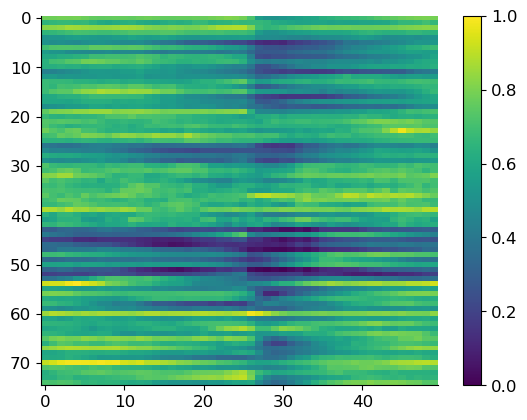

In [134]:
plt.imshow(normalized_SST_residuals, aspect='auto')
plt.colorbar()

C:\Users\Msfin\AppData\Local\Temp\ipykernel_21116\3281768782.py:150: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


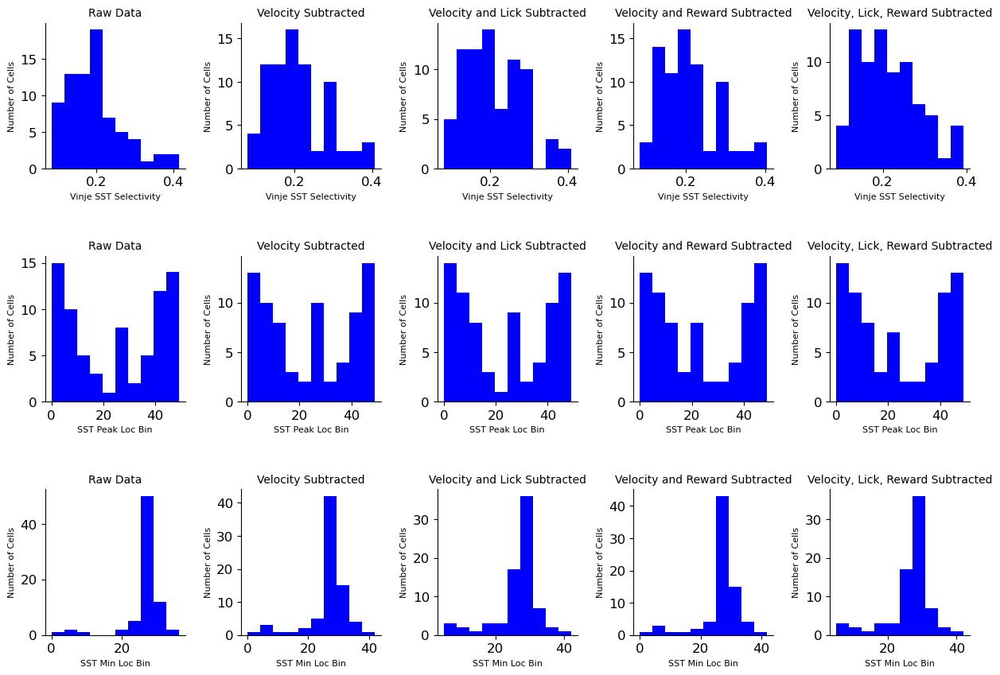

In [43]:


datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename = "SSTindivsomata_GLM"
filepath = os.path.join(datasets_dir, filename+".mat")
reorganized_data, variable_list = preprocess_data(filepath, normalize=True)

#variable_list ['Activity'=0, 'Licks'=1, 'Reward_loc'=2, 'Velocity'=3, '#1', '#2', '#3', '#4', '#5', '#6', '#7', '#8', '#9', '#10']

variables_to_remove = ["Velocity"]

avg_residuals, GLM_params, residual_activity_velocity_SST = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_SST_velocity, argmin_list_SST_velocity, selectivity_SST_velocity = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
                                                       
    
variables_to_remove = ["Velocity", "Licks"]


avg_residuals, GLM_params, residual_activity_vl_SST = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_SST_vl, argmin_list_SST_vl, selectivity_SST_vl = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
           
    
variables_to_remove = ["Velocity", "Reward_loc"]

avg_residuals, GLM_params, residual_activity_vr_SST = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_SST_vr, argmin_list_SST_vr, selectivity_SST_vr = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
  
    
    
variables_to_remove = ["Velocity", "Reward_loc", "Licks"]

avg_residuals, GLM_params, residual_activity_vrl_SST = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_SST_vrl, argmin_list_SST_vrl, selectivity_SST_vrl = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
  
    
    
    
Argmax_list_raw_SST = []
Argmin_list_raw_SST = []
selectivity_list_SST_raw = []

for animal, subdict in reorganized_data.items():
    for cell, value in subdict.items():
        neuron_data = reorganized_data[animal][cell]
        neuron_activity = neuron_data[:, 0, :]
        neuron_activity_trial_averaged = np.mean(neuron_activity, axis=1)
        selectivity_list_SST_raw.append(neuron_activity_trial_averaged)

        
        
SST_raw_selectivity = []

selectivity_matrix_SST_raw = np.vstack(selectivity_list_SST_raw)

for cell in selectivity_matrix_SST_raw:
    SST_raw_selectivity.append(Vinje2000(cell, norm='min_max'))
    Argmax_list_raw_SST.append(np.argmax(cell))
    Argmin_list_raw_SST.append(np.argmin(cell))

    
    
   
fig, axs = plt.subplots(3,5, figsize=(15, 10))

fig.subplots_adjust(wspace=0.4, hspace=0.6)

axs[0, 0].hist(SST_raw_selectivity, bins=10, color='blue')
axs[0, 0].set_title("Raw Data", fontsize=10)
axs[0, 0].set_ylabel("Number of Cells", fontsize=8)
axs[0, 0].set_xlabel("Vinje SST Selectivity", fontsize=8)

axs[0, 1].hist(selectivity_SST_velocity, bins=10, color='blue')
axs[0, 1].set_title("Velocity Subtracted", fontsize=10)
axs[0, 1].set_ylabel("Number of Cells", fontsize=8)
axs[0, 1].set_xlabel("Vinje SST Selectivity", fontsize=8)

axs[0, 2].hist(selectivity_SST_vl, bins=10, color='blue')
axs[0, 2].set_title("Velocity and Lick Subtracted", fontsize=10)
axs[0, 2].set_ylabel("Number of Cells", fontsize=8)
axs[0, 2].set_xlabel("Vinje SST Selectivity", fontsize=8)

axs[0, 3].hist(selectivity_SST_vr, bins=10, color='blue')
axs[0, 3].set_title("Velocity and Reward Subtracted", fontsize=10)
axs[0, 3].set_ylabel("Number of Cells", fontsize=8)
axs[0, 3].set_xlabel("Vinje SST Selectivity", fontsize=8)

axs[0, 4].hist(selectivity_SST_vrl, bins=10, color='blue')
axs[0, 4].set_title("Velocity, Lick, Reward Subtracted", fontsize=10)
axs[0, 4].set_ylabel("Number of Cells", fontsize=8)
axs[0, 4].set_xlabel("Vinje SST Selectivity", fontsize=8)

axs[1, 0].hist(Argmax_list_raw_SST, bins=10, color='blue')
axs[1, 0].set_title("Raw Data", fontsize=10)
axs[1, 0].set_ylabel("Number of Cells", fontsize=8)
axs[1, 0].set_xlabel("SST Peak Loc Bin", fontsize=8)

axs[1, 1].hist(argmax_list_SST_velocity, bins=10, color='blue')
axs[1, 1].set_title("Velocity Subtracted", fontsize=10)
axs[1, 1].set_ylabel("Number of Cells", fontsize=8)
axs[1, 1].set_xlabel("SST Peak Loc Bin", fontsize=8)

axs[1, 2].hist(argmax_list_SST_vl, bins=10, color='blue')
axs[1, 2].set_title("Velocity and Lick Subtracted", fontsize=10)
axs[1, 2].set_ylabel("Number of Cells", fontsize=8)
axs[1, 2].set_xlabel("SST Peak Loc Bin", fontsize=8)

axs[1, 3].hist(argmax_list_SST_vr, bins=10, color='blue')
axs[1, 3].set_title("Velocity and Reward Subtracted", fontsize=10)
axs[1, 3].set_ylabel("Number of Cells", fontsize=8)
axs[1, 3].set_xlabel("SST Peak Loc Bin", fontsize=8)


axs[1, 4].hist(argmax_list_SST_vrl, bins=10, color='blue')
axs[1, 4].set_title("Velocity, Lick, Reward Subtracted", fontsize=10)
axs[1, 4].set_ylabel("Number of Cells", fontsize=8)
axs[1, 4].set_xlabel("SST Peak Loc Bin", fontsize=8)


axs[2, 0].hist(Argmin_list_raw_SST, bins=10, color='blue')
axs[2, 0].set_title("Raw Data", fontsize=10)
axs[2, 0].set_ylabel("Number of Cells", fontsize=8)
axs[2, 0].set_xlabel("SST Min Loc Bin", fontsize=8)

axs[2, 1].hist(argmin_list_SST_velocity, bins=10, color='blue')
axs[2, 1].set_title("Velocity Subtracted", fontsize=10)
axs[2, 1].set_ylabel("Number of Cells", fontsize=8)
axs[2, 1].set_xlabel("SST Min Loc Bin", fontsize=8)

axs[2, 2].hist(argmin_list_SST_vl, bins=10, color='blue')
axs[2, 2].set_title("Velocity and Lick Subtracted", fontsize=10)
axs[2, 2].set_ylabel("Number of Cells", fontsize=8)
axs[2, 2].set_xlabel("SST Min Loc Bin", fontsize=8)

axs[2, 3].hist(argmin_list_SST_vr, bins=10, color='blue')
axs[2, 3].set_title("Velocity and Reward Subtracted", fontsize=10)
axs[2, 3].set_ylabel("Number of Cells", fontsize=8)
axs[2, 3].set_xlabel("SST Min Loc Bin", fontsize=8)

axs[2, 4].hist(argmin_list_SST_vrl, bins=10, color='blue')
axs[2, 4].set_title("Velocity, Lick, Reward Subtracted", fontsize=10)
axs[2, 4].set_ylabel("Number of Cells", fontsize=8)
axs[2, 4].set_xlabel("SST Min Loc Bin", fontsize=8)









fig.show()
    

C:\Users\Msfin\AppData\Local\Temp\ipykernel_21116\1712312412.py:195: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


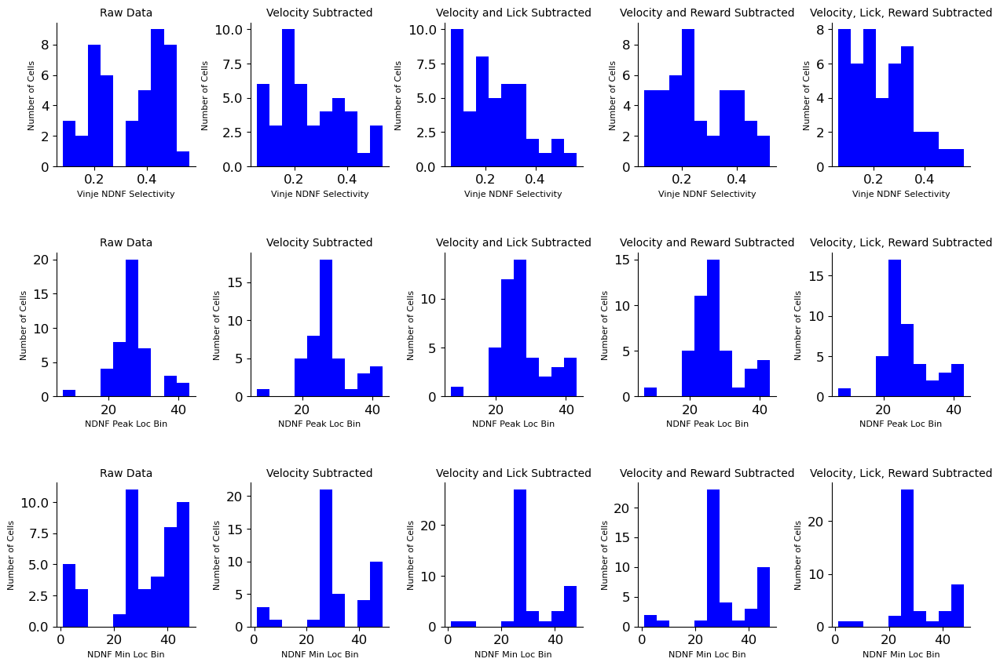

In [44]:


datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename = "NDNFindivsomata_GLM"
filepath = os.path.join(datasets_dir, filename+".mat")
reorganized_data, variable_list = preprocess_data(filepath, normalize=True)

#variable_list ['Activity'=0, 'Licks'=1, 'Reward_loc'=2, 'Velocity'=3, '#1', '#2', '#3', '#4', '#5', '#6', '#7', '#8', '#9', '#10']

variables_to_remove = ["Velocity"]

avg_residuals, GLM_params, residual_activity_velocity_NDNF = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_NDNF_velocity, argmin_list_NDNF_velocity, selectivity_NDNF_velocity = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
                                                       

# selectivity_list_NDNF_velocity = []

# for cell in avg_residuals_NDNF_velocity:
#     selectivity_list_NDNF_velocity.append(Vinje2000(cell, norm='min_max'))

    
    
    
variables_to_remove = ["Velocity", "Licks"]


avg_residuals, GLM_params, residual_activity_vl_NDNF = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_NDNF_vl, argmin_list_NDNF_vl, selectivity_NDNF_vl = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
          



# avg_residuals_NDNF_vl, GLM_params = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
# #normalized_NDNF_residuals_vl = normalize(avg_residuals_NDNF_vl, 'min_max')                                                        


# selectivity_list_NDNF_vl = []

# for cell in avg_residuals_NDNF_vl:
#     selectivity_list_NDNF_vl.append(Vinje2000(cell, norm='min_max'))
    
    

    
variables_to_remove = ["Velocity", "Reward_loc"]

# avg_residuals_NDNF_vr, GLM_params = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
# # normalized_NDNF_residuals_vr = normalize(avg_residuals_NDNF, 'min_max')                                                        


# selectivity_list_NDNF_vr = []

# for cell in avg_residuals_NDNF_vr:
#     selectivity_list_NDNF_vr.append(Vinje2000(cell, norm='min_max'))



avg_residuals, GLM_params, residual_activity_vr_NDNF = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_NDNF_vr, argmin_list_NDNF_vr, selectivity_NDNF_vr = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
  
    
    
variables_to_remove = ["Velocity", "Reward_loc", "Licks"]

# avg_residuals_NDNF_vr, GLM_params = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
# # normalized_NDNF_residuals_vr = normalize(avg_residuals_NDNF, 'min_max')                                                        


# selectivity_list_NDNF_vr = []

# for cell in avg_residuals_NDNF_vr:
#     selectivity_list_NDNF_vr.append(Vinje2000(cell, norm='min_max'))



avg_residuals, GLM_params, residual_activity_vrl_NDNF = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_NDNF_vrl, argmin_list_NDNF_vrl, selectivity_NDNF_vrl = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
  
    
    
    
Argmax_list_raw_NDNF = []
Argmin_list_raw_NDNF = []
selectivity_list_NDNF_raw = []

for animal, subdict in reorganized_data.items():
    for cell, value in subdict.items():
        neuron_data = reorganized_data[animal][cell]
#         print(f"neuron_data.shape {neuron_data.shape}")
        neuron_activity = neuron_data[:, 0, :]
        neuron_activity_trial_averaged = np.mean(neuron_activity, axis=1)
        selectivity_list_NDNF_raw.append(neuron_activity_trial_averaged)

        
        
NDNF_raw_selectivity = []

selectivity_matrix_NDNF_raw = np.vstack(selectivity_list_NDNF_raw)

for cell in selectivity_matrix_NDNF_raw:
    NDNF_raw_selectivity.append(Vinje2000(cell, norm='min_max'))
    Argmax_list_raw_NDNF.append(np.argmax(cell))
    Argmin_list_raw_NDNF.append(np.argmin(cell))

    
    
   
fig, axs = plt.subplots(3,5, figsize=(15, 10))

fig.subplots_adjust(wspace=0.4, hspace=0.6)

axs[0, 0].hist(NDNF_raw_selectivity, bins=10, color='blue')
axs[0, 0].set_title("Raw Data", fontsize=10)
axs[0, 0].set_ylabel("Number of Cells", fontsize=8)
axs[0, 0].set_xlabel("Vinje NDNF Selectivity", fontsize=8)

axs[0, 1].hist(selectivity_NDNF_velocity, bins=10, color='blue')
axs[0, 1].set_title("Velocity Subtracted", fontsize=10)
axs[0, 1].set_ylabel("Number of Cells", fontsize=8)
axs[0, 1].set_xlabel("Vinje NDNF Selectivity", fontsize=8)

axs[0, 2].hist(selectivity_NDNF_vl, bins=10, color='blue')
axs[0, 2].set_title("Velocity and Lick Subtracted", fontsize=10)
axs[0, 2].set_ylabel("Number of Cells", fontsize=8)
axs[0, 2].set_xlabel("Vinje NDNF Selectivity", fontsize=8)

axs[0, 3].hist(selectivity_NDNF_vr, bins=10, color='blue')
axs[0, 3].set_title("Velocity and Reward Subtracted", fontsize=10)
axs[0, 3].set_ylabel("Number of Cells", fontsize=8)
axs[0, 3].set_xlabel("Vinje NDNF Selectivity", fontsize=8)

axs[0, 4].hist(selectivity_NDNF_vrl, bins=10, color='blue')
axs[0, 4].set_title("Velocity, Lick, Reward Subtracted", fontsize=10)
axs[0, 4].set_ylabel("Number of Cells", fontsize=8)
axs[0, 4].set_xlabel("Vinje NDNF Selectivity", fontsize=8)

axs[1, 0].hist(Argmax_list_raw_NDNF, bins=10, color='blue')
axs[1, 0].set_title("Raw Data", fontsize=10)
axs[1, 0].set_ylabel("Number of Cells", fontsize=8)
axs[1, 0].set_xlabel("NDNF Peak Loc Bin", fontsize=8)

axs[1, 1].hist(argmax_list_NDNF_velocity, bins=10, color='blue')
axs[1, 1].set_title("Velocity Subtracted", fontsize=10)
axs[1, 1].set_ylabel("Number of Cells", fontsize=8)
axs[1, 1].set_xlabel("NDNF Peak Loc Bin", fontsize=8)

axs[1, 2].hist(argmax_list_NDNF_vl, bins=10, color='blue')
axs[1, 2].set_title("Velocity and Lick Subtracted", fontsize=10)
axs[1, 2].set_ylabel("Number of Cells", fontsize=8)
axs[1, 2].set_xlabel("NDNF Peak Loc Bin", fontsize=8)

axs[1, 3].hist(argmax_list_NDNF_vr, bins=10, color='blue')
axs[1, 3].set_title("Velocity and Reward Subtracted", fontsize=10)
axs[1, 3].set_ylabel("Number of Cells", fontsize=8)
axs[1, 3].set_xlabel("NDNF Peak Loc Bin", fontsize=8)


axs[1, 4].hist(argmax_list_NDNF_vrl, bins=10, color='blue')
axs[1, 4].set_title("Velocity, Lick, Reward Subtracted", fontsize=10)
axs[1, 4].set_ylabel("Number of Cells", fontsize=8)
axs[1, 4].set_xlabel("NDNF Peak Loc Bin", fontsize=8)


axs[2, 0].hist(Argmin_list_raw_NDNF, bins=10, color='blue')
axs[2, 0].set_title("Raw Data", fontsize=10)
axs[2, 0].set_ylabel("Number of Cells", fontsize=8)
axs[2, 0].set_xlabel("NDNF Min Loc Bin", fontsize=8)

axs[2, 1].hist(argmin_list_NDNF_velocity, bins=10, color='blue')
axs[2, 1].set_title("Velocity Subtracted", fontsize=10)
axs[2, 1].set_ylabel("Number of Cells", fontsize=8)
axs[2, 1].set_xlabel("NDNF Min Loc Bin", fontsize=8)

axs[2, 2].hist(argmin_list_NDNF_vl, bins=10, color='blue')
axs[2, 2].set_title("Velocity and Lick Subtracted", fontsize=10)
axs[2, 2].set_ylabel("Number of Cells", fontsize=8)
axs[2, 2].set_xlabel("NDNF Min Loc Bin", fontsize=8)

axs[2, 3].hist(argmin_list_NDNF_vr, bins=10, color='blue')
axs[2, 3].set_title("Velocity and Reward Subtracted", fontsize=10)
axs[2, 3].set_ylabel("Number of Cells", fontsize=8)
axs[2, 3].set_xlabel("NDNF Min Loc Bin", fontsize=8)

axs[2, 4].hist(argmin_list_NDNF_vrl, bins=10, color='blue')
axs[2, 4].set_title("Velocity, Lick, Reward Subtracted", fontsize=10)
axs[2, 4].set_ylabel("Number of Cells", fontsize=8)
axs[2, 4].set_xlabel("NDNF Min Loc Bin", fontsize=8)









fig.show()
    

C:\Users\Msfin\AppData\Local\Temp\ipykernel_21116\2410885692.py:195: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


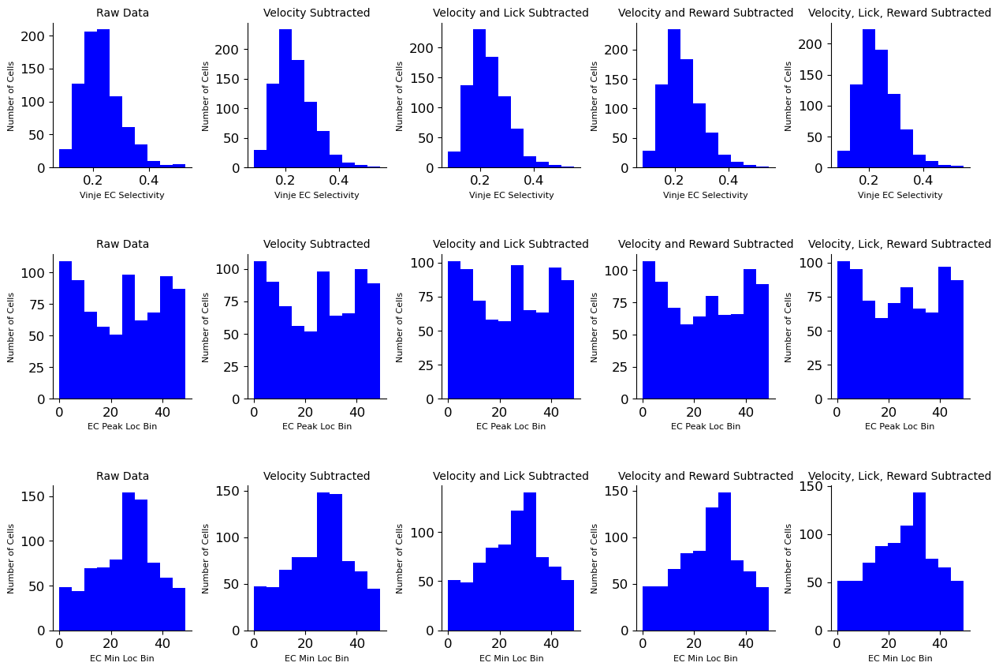

In [45]:


datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename = "EC_GLM"
filepath = os.path.join(datasets_dir, filename+".mat")
reorganized_data, variable_list = preprocess_data(filepath, normalize=True)

#variable_list ['Activity'=0, 'Licks'=1, 'Reward_loc'=2, 'Velocity'=3, '#1', '#2', '#3', '#4', '#5', '#6', '#7', '#8', '#9', '#10']

variables_to_remove = ["Velocity"]

avg_residuals, GLM_params, residual_activity_velocity_EC = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_EC_velocity, argmin_list_EC_velocity, selectivity_EC_velocity = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
                                                       

# selectivity_list_EC_velocity = []

# for cell in avg_residuals_EC_velocity:
#     selectivity_list_EC_velocity.append(Vinje2000(cell, norm='min_max'))

    
    
    
variables_to_remove = ["Velocity", "Licks"]


avg_residuals, GLM_params, residual_activity_vl_EC = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_EC_vl, argmin_list_EC_vl, selectivity_EC_vl = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
          



# avg_residuals_EC_vl, GLM_params = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
# #normalized_EC_residuals_vl = normalize(avg_residuals_EC_vl, 'min_max')                                                        


# selectivity_list_EC_vl = []

# for cell in avg_residuals_EC_vl:
#     selectivity_list_EC_vl.append(Vinje2000(cell, norm='min_max'))
    
    

    
variables_to_remove = ["Velocity", "Reward_loc"]

# avg_residuals_EC_vr, GLM_params = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
# # normalized_EC_residuals_vr = normalize(avg_residuals_EC, 'min_max')                                                        


# selectivity_list_EC_vr = []

# for cell in avg_residuals_EC_vr:
#     selectivity_list_EC_vr.append(Vinje2000(cell, norm='min_max'))



avg_residuals, GLM_params, residual_activity_vr_EC = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_EC_vr, argmin_list_EC_vr, selectivity_EC_vr = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
  
    
    
variables_to_remove = ["Velocity", "Reward_loc", "Licks"]

# avg_residuals_EC_vr, GLM_params = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
# # normalized_EC_residuals_vr = normalize(avg_residuals_EC, 'min_max')                                                        


# selectivity_list_EC_vr = []

# for cell in avg_residuals_EC_vr:
#     selectivity_list_EC_vr.append(Vinje2000(cell, norm='min_max'))



avg_residuals, GLM_params, residual_activity_vrl_EC = compute_variable_subtracted_residuals(reorganized_data, variable_list, variables_to_remove, quintile=None)
avg_residuals_min_max, argmax_list_EC_vrl, argmin_list_EC_vrl, selectivity_EC_vrl = get_min_maxed_residuals_argmin_argmax_selectivity(avg_residuals)
  
    
    
    
Argmax_list_raw_EC = []
Argmin_list_raw_EC = []
selectivity_list_EC_raw = []

for animal, subdict in reorganized_data.items():
    for cell, value in subdict.items():
        neuron_data = reorganized_data[animal][cell]
#         print(f"neuron_data.shape {neuron_data.shape}")
        neuron_activity = neuron_data[:, 0, :]
        neuron_activity_trial_averaged = np.mean(neuron_activity, axis=1)
        selectivity_list_EC_raw.append(neuron_activity_trial_averaged)

        
        
EC_raw_selectivity = []

selectivity_matrix_EC_raw = np.vstack(selectivity_list_EC_raw)

for cell in selectivity_matrix_EC_raw:
    EC_raw_selectivity.append(Vinje2000(cell, norm='min_max'))
    Argmax_list_raw_EC.append(np.argmax(cell))
    Argmin_list_raw_EC.append(np.argmin(cell))

    
    
   
fig, axs = plt.subplots(3,5, figsize=(15, 10))

fig.subplots_adjust(wspace=0.4, hspace=0.6)

axs[0, 0].hist(EC_raw_selectivity, bins=10, color='blue')
axs[0, 0].set_title("Raw Data", fontsize=10)
axs[0, 0].set_ylabel("Number of Cells", fontsize=8)
axs[0, 0].set_xlabel("Vinje EC Selectivity", fontsize=8)

axs[0, 1].hist(selectivity_EC_velocity, bins=10, color='blue')
axs[0, 1].set_title("Velocity Subtracted", fontsize=10)
axs[0, 1].set_ylabel("Number of Cells", fontsize=8)
axs[0, 1].set_xlabel("Vinje EC Selectivity", fontsize=8)

axs[0, 2].hist(selectivity_EC_vl, bins=10, color='blue')
axs[0, 2].set_title("Velocity and Lick Subtracted", fontsize=10)
axs[0, 2].set_ylabel("Number of Cells", fontsize=8)
axs[0, 2].set_xlabel("Vinje EC Selectivity", fontsize=8)

axs[0, 3].hist(selectivity_EC_vr, bins=10, color='blue')
axs[0, 3].set_title("Velocity and Reward Subtracted", fontsize=10)
axs[0, 3].set_ylabel("Number of Cells", fontsize=8)
axs[0, 3].set_xlabel("Vinje EC Selectivity", fontsize=8)

axs[0, 4].hist(selectivity_EC_vrl, bins=10, color='blue')
axs[0, 4].set_title("Velocity, Lick, Reward Subtracted", fontsize=10)
axs[0, 4].set_ylabel("Number of Cells", fontsize=8)
axs[0, 4].set_xlabel("Vinje EC Selectivity", fontsize=8)

axs[1, 0].hist(Argmax_list_raw_EC, bins=10, color='blue')
axs[1, 0].set_title("Raw Data", fontsize=10)
axs[1, 0].set_ylabel("Number of Cells", fontsize=8)
axs[1, 0].set_xlabel("EC Peak Loc Bin", fontsize=8)

axs[1, 1].hist(argmax_list_EC_velocity, bins=10, color='blue')
axs[1, 1].set_title("Velocity Subtracted", fontsize=10)
axs[1, 1].set_ylabel("Number of Cells", fontsize=8)
axs[1, 1].set_xlabel("EC Peak Loc Bin", fontsize=8)

axs[1, 2].hist(argmax_list_EC_vl, bins=10, color='blue')
axs[1, 2].set_title("Velocity and Lick Subtracted", fontsize=10)
axs[1, 2].set_ylabel("Number of Cells", fontsize=8)
axs[1, 2].set_xlabel("EC Peak Loc Bin", fontsize=8)

axs[1, 3].hist(argmax_list_EC_vr, bins=10, color='blue')
axs[1, 3].set_title("Velocity and Reward Subtracted", fontsize=10)
axs[1, 3].set_ylabel("Number of Cells", fontsize=8)
axs[1, 3].set_xlabel("EC Peak Loc Bin", fontsize=8)


axs[1, 4].hist(argmax_list_EC_vrl, bins=10, color='blue')
axs[1, 4].set_title("Velocity, Lick, Reward Subtracted", fontsize=10)
axs[1, 4].set_ylabel("Number of Cells", fontsize=8)
axs[1, 4].set_xlabel("EC Peak Loc Bin", fontsize=8)


axs[2, 0].hist(Argmin_list_raw_EC, bins=10, color='blue')
axs[2, 0].set_title("Raw Data", fontsize=10)
axs[2, 0].set_ylabel("Number of Cells", fontsize=8)
axs[2, 0].set_xlabel("EC Min Loc Bin", fontsize=8)

axs[2, 1].hist(argmin_list_EC_velocity, bins=10, color='blue')
axs[2, 1].set_title("Velocity Subtracted", fontsize=10)
axs[2, 1].set_ylabel("Number of Cells", fontsize=8)
axs[2, 1].set_xlabel("EC Min Loc Bin", fontsize=8)

axs[2, 2].hist(argmin_list_EC_vl, bins=10, color='blue')
axs[2, 2].set_title("Velocity and Lick Subtracted", fontsize=10)
axs[2, 2].set_ylabel("Number of Cells", fontsize=8)
axs[2, 2].set_xlabel("EC Min Loc Bin", fontsize=8)

axs[2, 3].hist(argmin_list_EC_vr, bins=10, color='blue')
axs[2, 3].set_title("Velocity and Reward Subtracted", fontsize=10)
axs[2, 3].set_ylabel("Number of Cells", fontsize=8)
axs[2, 3].set_xlabel("EC Min Loc Bin", fontsize=8)

axs[2, 4].hist(argmin_list_EC_vrl, bins=10, color='blue')
axs[2, 4].set_title("Velocity, Lick, Reward Subtracted", fontsize=10)
axs[2, 4].set_ylabel("Number of Cells", fontsize=8)
axs[2, 4].set_xlabel("EC Min Loc Bin", fontsize=8)









fig.show()
    

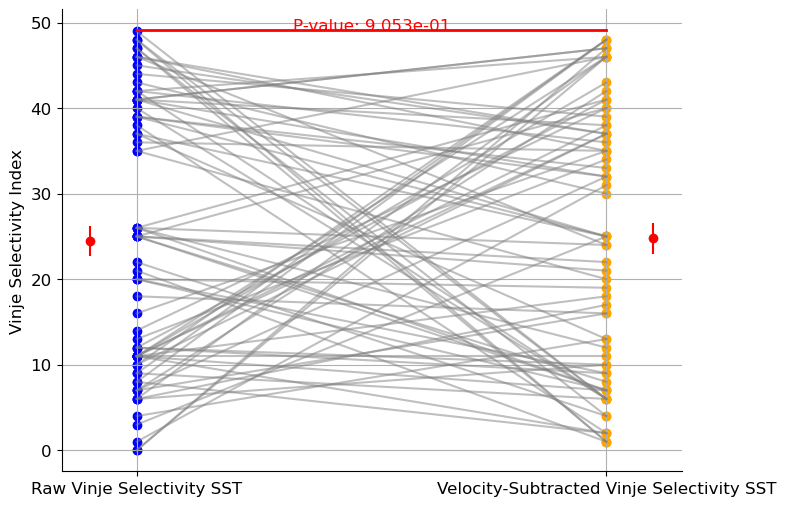

In [225]:
trial_argmax_list_SST_first_quintile_velocity = []
trial_argmax_list_SST_last_quintile_velocity = []

for animal, subdict in residual_activity_velocity_SST.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity[animal][cell]
        sst_quintiles = split_into_quintiles(residual_data)
        first_quintile = sst_quintiles[0]
        last_quintile = sst_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_first_quintile_velocity.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_last_quintile_velocity.append(argmax_loc)
        


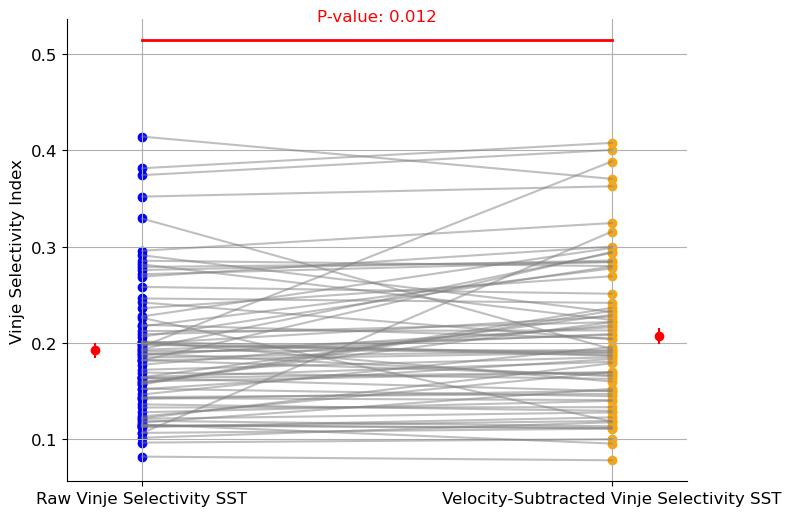

In [51]:
from scipy.stats import ttest_rel


t_stat, p_value_raw_velocity = ttest_rel(selectivity_SST_velocity, SST_raw_selectivity)
        
mean_raw = np.mean(SST_raw_selectivity)
mean_velocity = np.mean(selectivity_SST_velocity)

sem_raw = np.std(SST_raw_selectivity) / np.sqrt(len(SST_raw_selectivity))
sem_velocity = np.std(selectivity_SST_velocity) / np.sqrt(len(selectivity_SST_velocity))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["Raw Vinje Selectivity SST", "Velocity-Subtracted Vinje Selectivity SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red'
)


for i in range(len(SST_raw_selectivity)):
    plt.plot(x_positions, [SST_raw_selectivity[i], selectivity_SST_velocity[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(SST_raw_selectivity), SST_raw_selectivity, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(selectivity_SST_velocity), selectivity_SST_velocity, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Vinje Selectivity Index')

# Display p-value with a red line
y_min = max(max(SST_raw_selectivity), max(selectivity_SST_velocity))
plt.plot([x_positions[0], x_positions[1]], [y_min + 0.1, y_min + 0.1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 0.12, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')





plt.show()

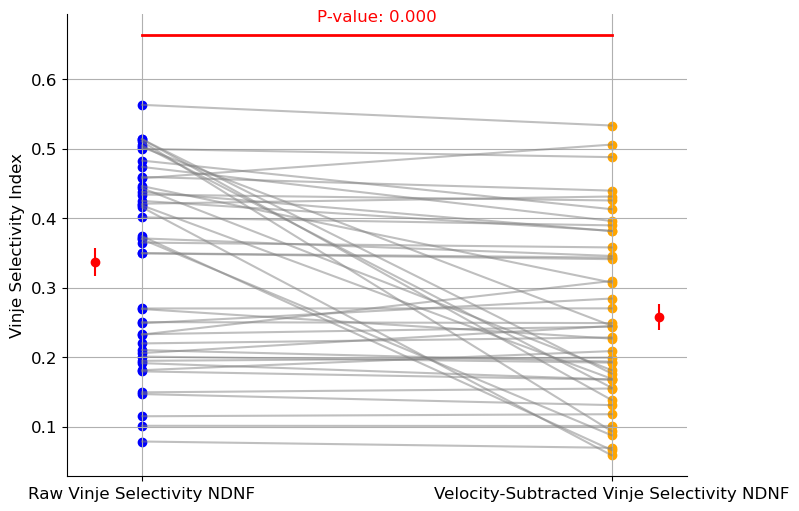

In [52]:
from scipy.stats import ttest_rel


t_stat, p_value_raw_velocity = ttest_rel(selectivity_NDNF_velocity, NDNF_raw_selectivity)
        
mean_raw = np.mean(NDNF_raw_selectivity)
mean_velocity = np.mean(selectivity_NDNF_velocity)

sem_raw = np.std(NDNF_raw_selectivity) / np.sqrt(len(NDNF_raw_selectivity))
sem_velocity = np.std(selectivity_NDNF_velocity) / np.sqrt(len(selectivity_NDNF_velocity))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["Raw Vinje Selectivity NDNF", "Velocity-Subtracted Vinje Selectivity NDNF"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red'
)


for i in range(len(NDNF_raw_selectivity)):
    plt.plot(x_positions, [NDNF_raw_selectivity[i], selectivity_NDNF_velocity[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(NDNF_raw_selectivity), NDNF_raw_selectivity, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(selectivity_NDNF_velocity), selectivity_NDNF_velocity, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Vinje Selectivity Index')

# Display p-value with a red line
y_min = max(max(NDNF_raw_selectivity), max(selectivity_NDNF_velocity))
plt.plot([x_positions[0], x_positions[1]], [y_min + 0.1, y_min + 0.1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 0.12, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')





plt.show()

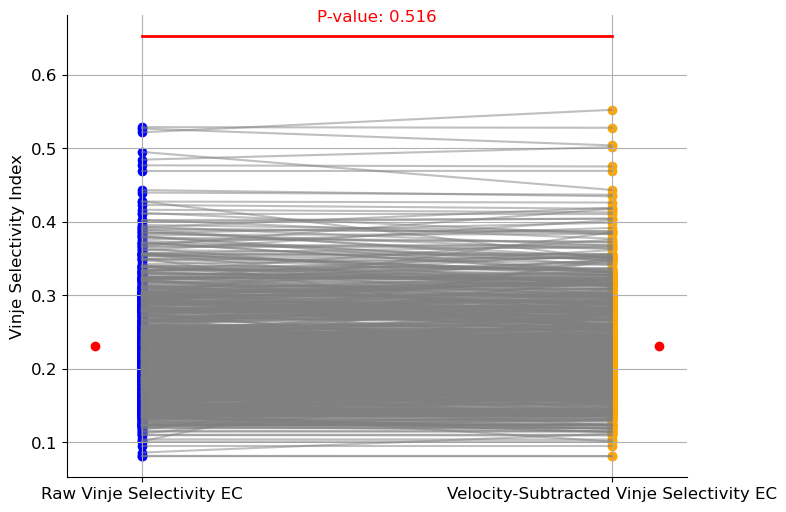

In [53]:
from scipy.stats import ttest_rel


t_stat, p_value_raw_velocity = ttest_rel(selectivity_EC_velocity, EC_raw_selectivity)
        
mean_raw = np.mean(EC_raw_selectivity)
mean_velocity = np.mean(selectivity_EC_velocity)

sem_raw = np.std(EC_raw_selectivity) / np.sqrt(len(EC_raw_selectivity))
sem_velocity = np.std(selectivity_EC_velocity) / np.sqrt(len(selectivity_EC_velocity))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["Raw Vinje Selectivity EC", "Velocity-Subtracted Vinje Selectivity EC"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red'
)


for i in range(len(EC_raw_selectivity)):
    plt.plot(x_positions, [EC_raw_selectivity[i], selectivity_EC_velocity[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(EC_raw_selectivity), EC_raw_selectivity, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(selectivity_EC_velocity), selectivity_EC_velocity, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Vinje Selectivity Index')

# Display p-value with a red line
y_min = max(max(EC_raw_selectivity), max(selectivity_EC_velocity))
plt.plot([x_positions[0], x_positions[1]], [y_min + 0.1, y_min + 0.1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 0.12, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')





plt.show()

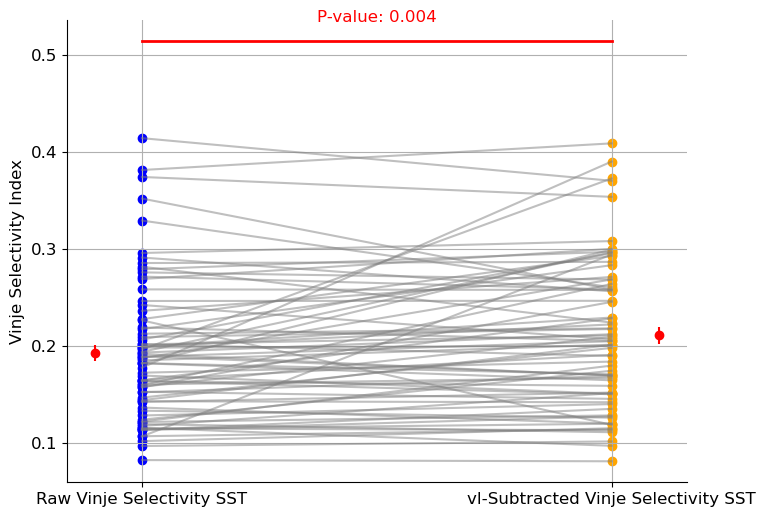

In [50]:
from scipy.stats import ttest_rel


t_stat, p_value_raw_velocity = ttest_rel(selectivity_SST_velocity, SST_raw_selectivity)
        
mean_raw = np.mean(SST_raw_selectivity)
mean_velocity = np.mean(selectivity_SST_velocity)

sem_raw = np.std(SST_raw_selectivity) / np.sqrt(len(SST_raw_selectivity))
sem_velocity = np.std(selectivity_SST_velocity) / np.sqrt(len(selectivity_SST_velocity))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["Raw Vinje Selectivity SST", "velocity-Subtracted Vinje Selectivity SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red'
)


for i in range(len(SST_raw_selectivity)):
    plt.plot(x_positions, [SST_raw_selectivity[i], selectivity_SST_velocity[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(SST_raw_selectivity), SST_raw_selectivity, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(selectivity_SST_velocity), selectivity_SST_velocity, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Vinje Selectivity Index')

# Display p-value with a red line
y_min = max(max(SST_raw_selectivity), max(selectivity_SST_velocity))
plt.plot([x_positions[0], x_positions[1]], [y_min + 0.1, y_min + 0.1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 0.12, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')





plt.show()

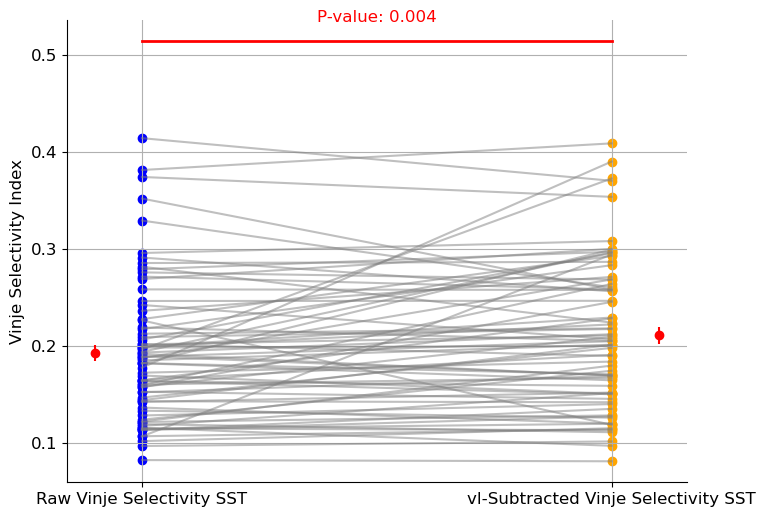

In [50]:
from scipy.stats import ttest_rel


t_stat, p_value_raw_vr = ttest_rel(selectivity_SST_vr, SST_raw_selectivity)
        
mean_raw = np.mean(SST_raw_selectivity)
mean_vr = np.mean(selectivity_SST_vr)

sem_raw = np.std(SST_raw_selectivity) / np.sqrt(len(SST_raw_selectivity))
sem_vr = np.std(selectivity_SST_vr) / np.sqrt(len(selectivity_SST_vr))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["Raw Vinje Selectivity SST", "vr-Subtracted Vinje Selectivity SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vr, yerr=sem_vr, fmt='o', color='red'
)


for i in range(len(SST_raw_selectivity)):
    plt.plot(x_positions, [SST_raw_selectivity[i], selectivity_SST_vr[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(SST_raw_selectivity), SST_raw_selectivity, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(selectivity_SST_vr), selectivity_SST_vr, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Vinje Selectivity Index')

# Display p-value with a red line
y_min = max(max(SST_raw_selectivity), max(selectivity_SST_vr))
plt.plot([x_positions[0], x_positions[1]], [y_min + 0.1, y_min + 0.1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 0.12, f"P-value: {p_value_raw_vr:.3f}", ha='center', color='red')





plt.show()

In [ ]:
bin_size = 180/50
reward_loc = bin_size * 25

# trial_argmax_list_SST_first_quintile_cm = trial_argmax_list_SST_first_quintile.astype(float) * bin_size.astype

raw_argmax_list_SST_distance = []
for i in Argmax_list_raw_SST:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmax_list_SST_distance.append(diff)
    

    
velocity_argmax_list_SST_distance = []
for i in argmax_list_SST_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmax_list_SST_distance.append(diff)
    
    
    
raw_argmin_list_SST_distance = []
for i in Argmin_list_raw_SST:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmin_list_SST_distance.append(diff)
    

    
velocity_argmin_list_SST_distance = []
for i in argmin_list_SST_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmin_list_SST_distance.append(diff)
    
    
    

raw_argmax_list_NDNF_distance = []
for i in Argmax_list_raw_NDNF:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmax_list_NDNF_distance.append(diff)
    

    
velocity_argmax_list_NDNF_distance = []
for i in argmax_list_NDNF_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmax_list_NDNF_distance.append(diff)
    
    
print(f"raw_argmax_list_EC_distance {raw_argmax_list_NDNF_distance}")
print(f"velocity_argmax_list_EC_distance {velocity_argmax_list_NDNF_distance}")

raw_argmin_list_NDNF_distance = []
for i in Argmin_list_raw_NDNF:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmin_list_NDNF_distance.append(diff)
    

    
velocity_argmin_list_NDNF_distance = []
for i in argmin_list_NDNF_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmin_list_NDNF_distance.append(diff)
    
    
print(f"raw_argmin_list_EC_distance {raw_argmin_list_NDNF_distance}")
print(f"velocity_argmin_list_EC_distance {velocity_argmin_list_NDNF_distance}")



raw_argmax_list_EC_distance = []
for i in Argmax_list_raw_EC:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmax_list_EC_distance.append(diff)
    

    
velocity_argmax_list_EC_distance = []
for i in argmax_list_EC_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmax_list_EC_distance.append(diff)
    
print(f"raw_argmax_list_EC_distance {len(raw_argmax_list_EC_distance)}")
print(f"velocity_argmax_list_EC_distance {len(velocity_argmax_list_EC_distance)}")
    
    

raw_argmin_list_EC_distance = []
for i in Argmin_list_raw_EC:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmin_list_EC_distance.append(diff)
    

    
velocity_argmin_list_EC_distance = []
for i in argmin_list_EC_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmin_list_EC_distance.append(diff)
    
print(f"raw_argmin_list_EC_distance {len(raw_argmin_list_EC_distance)}")
print(f"velocity_argmin_list_EC_distance {len(velocity_argmin_list_EC_distance)}")


In [186]:
bin_size = 180/50
reward_loc = bin_size * 25

# trial_argmax_list_SST_first_quintile_cm = trial_argmax_list_SST_first_quintile.astype(float) * bin_size.astype

raw_argmax_list_SST_distance = []
for i in Argmax_list_raw_SST:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmax_list_SST_distance.append(diff)
    

    
velocity_argmax_list_SST_distance = []
for i in argmax_list_SST_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmax_list_SST_distance.append(diff)

In [198]:
bin_size = 180/50
reward_loc = bin_size * 25

# trial_argmin_list_SST_first_quintile_cm = trial_argmin_list_SST_first_quintile.astype(float) * bin_size.astype

raw_argmin_list_SST_distance = []
for i in Argmin_list_raw_SST:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmin_list_SST_distance.append(diff)
    

    
velocity_argmin_list_SST_distance = []
for i in argmin_list_SST_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmin_list_SST_distance.append(diff)

In [191]:
bin_size = 180/50
reward_loc = bin_size * 25

# trial_argmax_list_NDNF_first_quintile_cm = trial_argmax_list_NDNF_first_quintile.astype(float) * bin_size.astype

raw_argmax_list_NDNF_distance = []
for i in Argmax_list_raw_NDNF:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmax_list_NDNF_distance.append(diff)
    

    
velocity_argmax_list_NDNF_distance = []
for i in argmax_list_NDNF_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmax_list_NDNF_distance.append(diff)
    
    
print(f"raw_argmax_list_EC_distance {raw_argmax_list_NDNF_distance}")
print(f"velocity_argmax_list_EC_distance {velocity_argmax_list_NDNF_distance}")

raw_argmax_list_EC_distance [68.0, 66.0, 66.0, 52.0, 50.0, 68.0, 68.0, 52.0, 66.0, 65.0, 83.0, 66.0, 54.0, 69.0, 64.0, 64.0, 65.0, 62.0, 69.0, 64.0, 64.0, 64.0, 70.0, 64.0, 47.0, 58.0, 64.0, 64.0, 58.0, 59.0, 58.0, 67.0, 58.0, 58.0, 63.0, 71.0, 64.0, 64.0, 63.0, 64.0, 61.0, 64.0, 64.0, 64.0, 64.0]
velocity_argmax_list_EC_distance [68.0, 66.0, 66.0, 52.0, 50.0, 68.0, 68.0, 52.0, 66.0, 65.0, 83.0, 66.0, 54.0, 69.0, 64.0, 69.0, 65.0, 62.0, 69.0, 64.0, 64.0, 64.0, 70.0, 64.0, 47.0, 58.0, 64.0, 64.0, 59.0, 59.0, 58.0, 64.0, 68.0, 58.0, 48.0, 71.0, 50.0, 65.0, 65.0, 64.0, 55.0, 65.0, 65.0, 64.0, 64.0]


In [199]:
bin_size = 180/50
reward_loc = bin_size * 25

# trial_argmin_list_NDNF_first_quintile_cm = trial_argmin_list_NDNF_first_quintile.astype(float) * bin_size.astype

raw_argmin_list_NDNF_distance = []
for i in Argmin_list_raw_NDNF:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmin_list_NDNF_distance.append(diff)
    

    
velocity_argmin_list_NDNF_distance = []
for i in argmin_list_NDNF_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmin_list_NDNF_distance.append(diff)
    
    
print(f"raw_argmin_list_EC_distance {raw_argmin_list_NDNF_distance}")
print(f"velocity_argmin_list_EC_distance {velocity_argmin_list_NDNF_distance}")

raw_argmin_list_EC_distance [63.0, 63.0, 63.0, 64.0, 64.0, 64.0, 63.0, 44.0, 64.0, 61.0, 49.0, 58.0, 44.0, 64.0, 42.0, 47.0, 46.0, 68.0, 55.0, 58.0, 46.0, 47.0, 53.0, 47.0, 64.0, 88.0, 46.0, 46.0, 82.0, 89.0, 88.0, 56.0, 87.0, 84.0, 82.0, 60.0, 86.0, 46.0, 49.0, 51.0, 47.0, 46.0, 52.0, 45.0, 50.0]
velocity_argmin_list_EC_distance [63.0, 63.0, 63.0, 64.0, 64.0, 64.0, 63.0, 44.0, 64.0, 59.0, 49.0, 62.0, 44.0, 64.0, 42.0, 43.0, 45.0, 68.0, 47.0, 58.0, 46.0, 42.0, 62.0, 42.0, 64.0, 81.0, 43.0, 44.0, 89.0, 89.0, 88.0, 56.0, 48.0, 41.0, 62.0, 57.0, 62.0, 61.0, 60.0, 61.0, 62.0, 61.0, 62.0, 61.0, 62.0]


In [195]:
bin_size = 180/50
reward_loc = bin_size * 25

# trial_argmax_list_EC_first_quintile_cm = trial_argmax_list_EC_first_quintile.astype(float) * bin_size.astype

raw_argmax_list_EC_distance = []
for i in Argmax_list_raw_EC:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmax_list_EC_distance.append(diff)
    

    
velocity_argmax_list_EC_distance = []
for i in argmax_list_EC_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmax_list_EC_distance.append(diff)
    
print(f"raw_argmax_list_EC_distance {len(raw_argmax_list_EC_distance)}")
print(f"velocity_argmax_list_EC_distance {len(velocity_argmax_list_EC_distance)}")

raw_argmax_list_EC_distance 792
velocity_argmax_list_EC_distance 792


In [200]:
bin_size = 180/50
reward_loc = bin_size * 25

# trial_argmin_list_EC_first_quintile_cm = trial_argmin_list_EC_first_quintile.astype(float) * bin_size.astype

raw_argmin_list_EC_distance = []
for i in Argmin_list_raw_EC:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    raw_argmin_list_EC_distance.append(diff)
    

    
velocity_argmin_list_EC_distance = []
for i in argmin_list_EC_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    velocity_argmin_list_EC_distance.append(diff)
    
print(f"raw_argmin_list_EC_distance {len(raw_argmin_list_EC_distance)}")
print(f"velocity_argmin_list_EC_distance {len(velocity_argmin_list_EC_distance)}")

raw_argmin_list_EC_distance 792
velocity_argmin_list_EC_distance 792


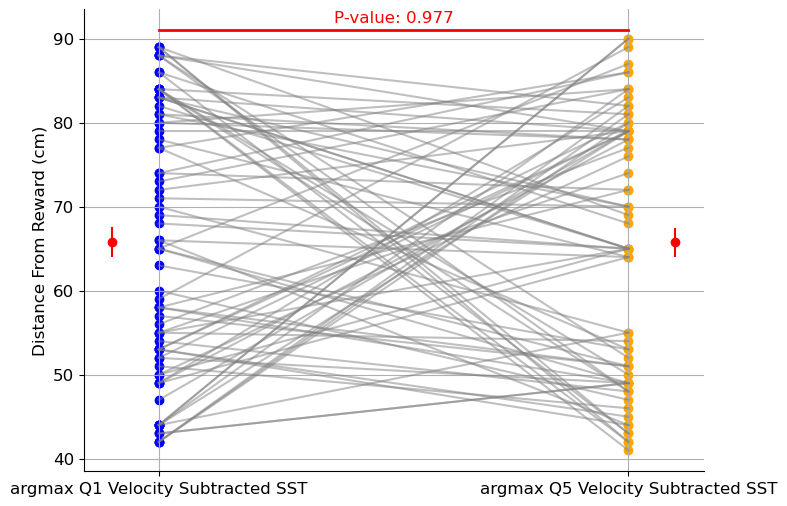

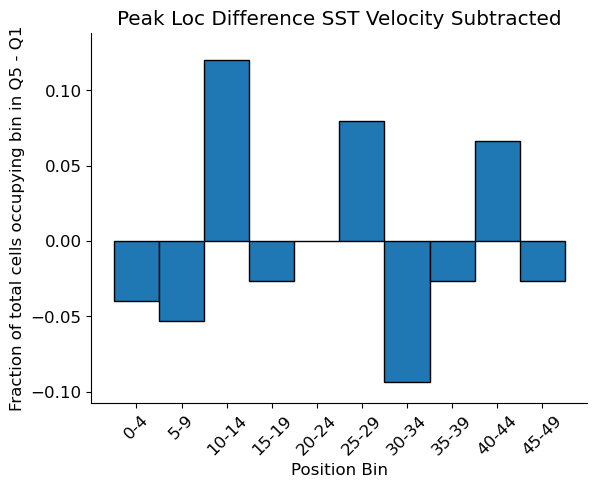

In [389]:
trial_argmax_list_SST_first_quintile_velocity = []
trial_argmax_list_SST_last_quintile_velocity = []

for animal, subdict in residual_activity_velocity_SST.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_velocity_SST[animal][cell]
        sst_quintiles = split_into_quintiles(residual_data)
        first_quintile = sst_quintiles[0]
        last_quintile = sst_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_first_quintile_velocity.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_last_quintile_velocity.append(argmax_loc)
        
trial_argmax_list_SST_first_quintile_velocity_distance = []
for i in trial_argmax_list_SST_first_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_SST_first_quintile_velocity_distance.append(diff)
    
trial_argmax_list_SST_last_quintile_velocity_distance = []
for i in trial_argmax_list_SST_last_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_SST_last_quintile_velocity_distance.append(diff)
    
    
t_stat, p_value_raw_velocity = ttest_rel(trial_argmax_list_SST_first_quintile_velocity_distance, trial_argmax_list_SST_last_quintile_velocity_distance)
        
mean_vl = np.mean(trial_argmax_list_SST_last_quintile_velocity_distance)
mean_velocity = np.mean(trial_argmax_list_SST_first_quintile_velocity_distance)

sem_vl = np.std(trial_argmax_list_SST_last_quintile_velocity_distance) / np.sqrt(len(trial_argmax_list_SST_last_quintile_velocity_distance))
sem_velocity = np.std(trial_argmax_list_SST_first_quintile_velocity_distance) / np.sqrt(len(trial_argmax_list_SST_first_quintile_velocity_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 Velocity Subtracted SST", "argmax Q5 Velocity Subtracted SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_SST_last_quintile_velocity_distance)):
    plt.plot(x_positions, [trial_argmax_list_SST_first_quintile_velocity_distance[i], trial_argmax_list_SST_last_quintile_velocity_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_SST_first_quintile_velocity_distance), trial_argmax_list_SST_first_quintile_velocity_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_SST_last_quintile_velocity_distance), trial_argmax_list_SST_last_quintile_velocity_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_SST_first_quintile_velocity_distance), max(trial_argmax_list_SST_last_quintile_velocity_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')



bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_SST_first_quintile_velocity, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_SST_last_quintile_velocity, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_SST_velocity = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_SST_first_quintile_velocity)
    peak_loc_difference_learning_list_SST_velocity.append(value)

y_min = np.min(peak_loc_difference_learning_list_SST_velocity)
y_max = np.max(peak_loc_difference_learning_list_SST_velocity)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_SST_velocity, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference SST Velocity Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()
        

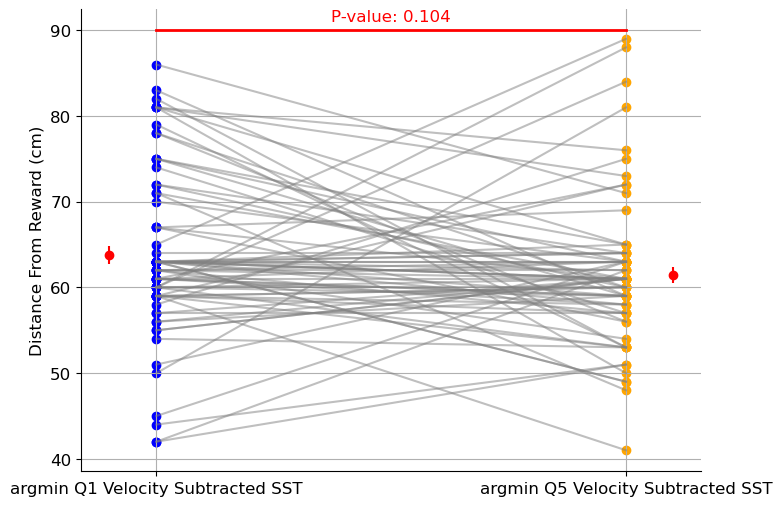

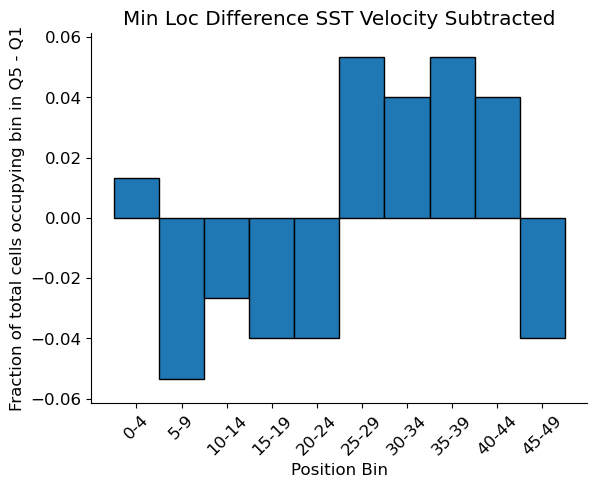

In [388]:
trial_argmin_list_SST_first_quintile_velocity = []
trial_argmin_list_SST_last_quintile_velocity = []

for animal, subdict in residual_activity_velocity_SST.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_velocity_SST[animal][cell]
        sst_quintiles = split_into_quintiles(residual_data)
        first_quintile = sst_quintiles[0]
        last_quintile = sst_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_SST_first_quintile_velocity.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_SST_last_quintile_velocity.append(argmin_loc)
        
trial_argmin_list_SST_first_quintile_velocity_distance = []
for i in trial_argmin_list_SST_first_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_SST_first_quintile_velocity_distance.append(diff)
    
trial_argmin_list_SST_last_quintile_velocity_distance = []
for i in trial_argmin_list_SST_last_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_SST_last_quintile_velocity_distance.append(diff)
    
    
t_stat, p_value_raw_velocity = ttest_rel(trial_argmin_list_SST_first_quintile_velocity_distance, trial_argmin_list_SST_last_quintile_velocity_distance)
        
mean_vl = np.mean(trial_argmin_list_SST_last_quintile_velocity_distance)
mean_velocity = np.mean(trial_argmin_list_SST_first_quintile_velocity_distance)

sem_vl = np.std(trial_argmin_list_SST_last_quintile_velocity_distance) / np.sqrt(len(trial_argmin_list_SST_last_quintile_velocity_distance))
sem_velocity = np.std(trial_argmin_list_SST_first_quintile_velocity_distance) / np.sqrt(len(trial_argmin_list_SST_first_quintile_velocity_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 Velocity Subtracted SST", "argmin Q5 Velocity Subtracted SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_SST_last_quintile_velocity_distance)):
    plt.plot(x_positions, [trial_argmin_list_SST_first_quintile_velocity_distance[i], trial_argmin_list_SST_last_quintile_velocity_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_SST_first_quintile_velocity_distance), trial_argmin_list_SST_first_quintile_velocity_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_SST_last_quintile_velocity_distance), trial_argmin_list_SST_last_quintile_velocity_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_SST_first_quintile_velocity_distance), max(trial_argmin_list_SST_last_quintile_velocity_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')
        


bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmin_list_SST_first_quintile_velocity, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmin_list_SST_last_quintile_velocity, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_SST_velocity = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_SST_first_quintile_velocity)
    min_loc_difference_learning_list_SST_velocity.append(value)

y_min = np.min(min_loc_difference_learning_list_SST_velocity)
y_max = np.max(min_loc_difference_learning_list_SST_velocity)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_SST_velocity, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference SST Velocity Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)



plt.show()
        

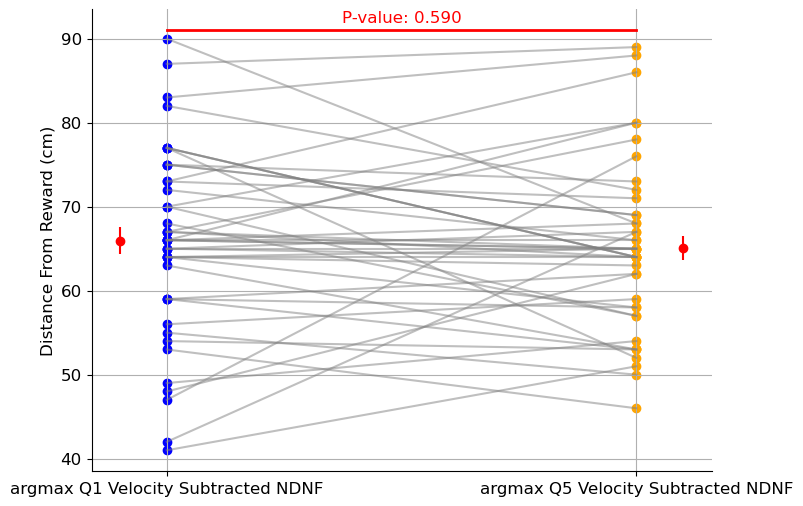

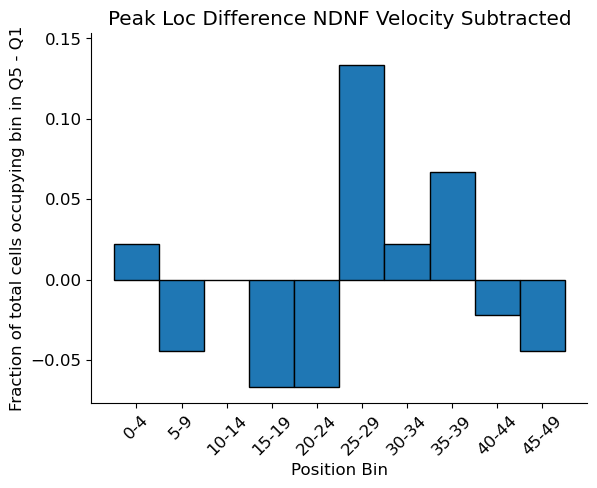

In [387]:
trial_argmax_list_NDNF_first_quintile_velocity = []
trial_argmax_list_NDNF_last_quintile_velocity = []

for animal, subdict in residual_activity_velocity_NDNF.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_velocity_NDNF[animal][cell]
        NDNF_quintiles = split_into_quintiles(residual_data)
        first_quintile = NDNF_quintiles[0]
        last_quintile = NDNF_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_NDNF_first_quintile_velocity.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_NDNF_last_quintile_velocity.append(argmax_loc)
        
trial_argmax_list_NDNF_first_quintile_velocity_distance = []
for i in trial_argmax_list_NDNF_first_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_NDNF_first_quintile_velocity_distance.append(diff)
    
trial_argmax_list_NDNF_last_quintile_velocity_distance = []
for i in trial_argmax_list_NDNF_last_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_NDNF_last_quintile_velocity_distance.append(diff)
    
    
t_stat, p_value_raw_velocity = ttest_rel(trial_argmax_list_NDNF_first_quintile_velocity_distance, trial_argmax_list_NDNF_last_quintile_velocity_distance)
        
mean_vl = np.mean(trial_argmax_list_NDNF_last_quintile_velocity_distance)
mean_velocity = np.mean(trial_argmax_list_NDNF_first_quintile_velocity_distance)

sem_vl = np.std(trial_argmax_list_NDNF_last_quintile_velocity_distance) / np.sqrt(len(trial_argmax_list_NDNF_last_quintile_velocity_distance))
sem_velocity = np.std(trial_argmax_list_NDNF_first_quintile_velocity_distance) / np.sqrt(len(trial_argmax_list_NDNF_first_quintile_velocity_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 Velocity Subtracted NDNF", "argmax Q5 Velocity Subtracted NDNF"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_NDNF_last_quintile_velocity_distance)):
    plt.plot(x_positions, [trial_argmax_list_NDNF_first_quintile_velocity_distance[i], trial_argmax_list_NDNF_last_quintile_velocity_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_NDNF_first_quintile_velocity_distance), trial_argmax_list_NDNF_first_quintile_velocity_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_NDNF_last_quintile_velocity_distance), trial_argmax_list_NDNF_last_quintile_velocity_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_NDNF_first_quintile_velocity_distance), max(trial_argmax_list_NDNF_last_quintile_velocity_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')


bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_first_quintile_velocity, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_last_quintile_velocity, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_NDNF_velocity = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_NDNF_first_quintile_velocity)
    peak_loc_difference_learning_list_NDNF_velocity.append(value)

y_min = np.min(peak_loc_difference_learning_list_NDNF_velocity)
y_max = np.max(peak_loc_difference_learning_list_NDNF_velocity)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_NDNF_velocity, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference NDNF Velocity Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()



plt.show()
        

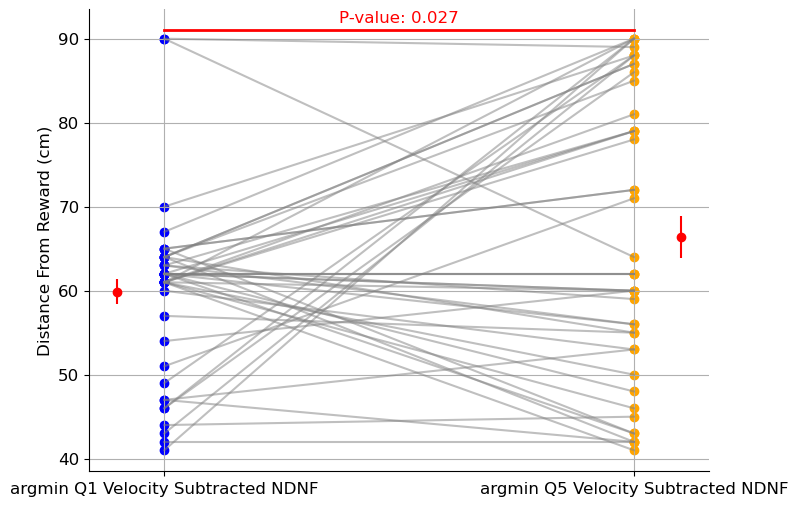

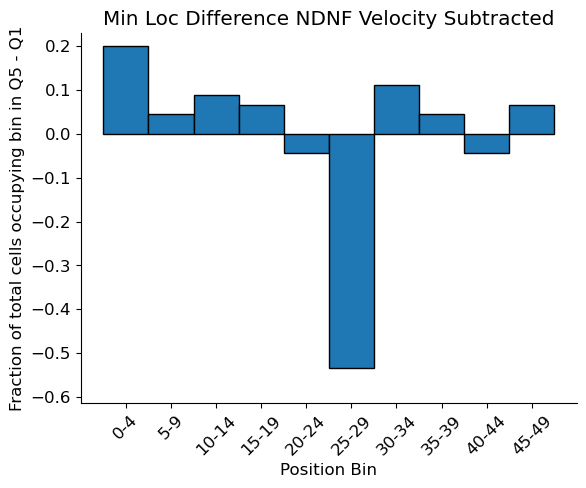

In [386]:
trial_argmin_list_NDNF_first_quintile_velocity = []
trial_argmin_list_NDNF_last_quintile_velocity = []

for animal, subdict in residual_activity_velocity_NDNF.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_velocity_NDNF[animal][cell]
        NDNF_quintiles = split_into_quintiles(residual_data)
        first_quintile = NDNF_quintiles[0]
        last_quintile = NDNF_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_NDNF_first_quintile_velocity.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_NDNF_last_quintile_velocity.append(argmin_loc)
        
trial_argmin_list_NDNF_first_quintile_velocity_distance = []
for i in trial_argmin_list_NDNF_first_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_NDNF_first_quintile_velocity_distance.append(diff)
    
trial_argmin_list_NDNF_last_quintile_velocity_distance = []
for i in trial_argmin_list_NDNF_last_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_NDNF_last_quintile_velocity_distance.append(diff)
    
    
t_stat, p_value_raw_velocity = ttest_rel(trial_argmin_list_NDNF_first_quintile_velocity_distance, trial_argmin_list_NDNF_last_quintile_velocity_distance)
        
mean_vl = np.mean(trial_argmin_list_NDNF_last_quintile_velocity_distance)
mean_velocity = np.mean(trial_argmin_list_NDNF_first_quintile_velocity_distance)

sem_vl = np.std(trial_argmin_list_NDNF_last_quintile_velocity_distance) / np.sqrt(len(trial_argmin_list_NDNF_last_quintile_velocity_distance))
sem_velocity = np.std(trial_argmin_list_NDNF_first_quintile_velocity_distance) / np.sqrt(len(trial_argmin_list_NDNF_first_quintile_velocity_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 Velocity Subtracted NDNF", "argmin Q5 Velocity Subtracted NDNF"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_NDNF_last_quintile_velocity_distance)):
    plt.plot(x_positions, [trial_argmin_list_NDNF_first_quintile_velocity_distance[i], trial_argmin_list_NDNF_last_quintile_velocity_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_NDNF_first_quintile_velocity_distance), trial_argmin_list_NDNF_first_quintile_velocity_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_NDNF_last_quintile_velocity_distance), trial_argmin_list_NDNF_last_quintile_velocity_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_NDNF_first_quintile_velocity_distance), max(trial_argmin_list_NDNF_last_quintile_velocity_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')


bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmin_list_NDNF_first_quintile_velocity, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmin_list_NDNF_last_quintile_velocity, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_NDNF_velocity = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_NDNF_first_quintile_velocity)
    min_loc_difference_learning_list_NDNF_velocity.append(value)

y_min = np.min(min_loc_difference_learning_list_NDNF_velocity)
y_max = np.max(min_loc_difference_learning_list_NDNF_velocity)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_NDNF_velocity, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference NDNF Velocity Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)
plt.show()

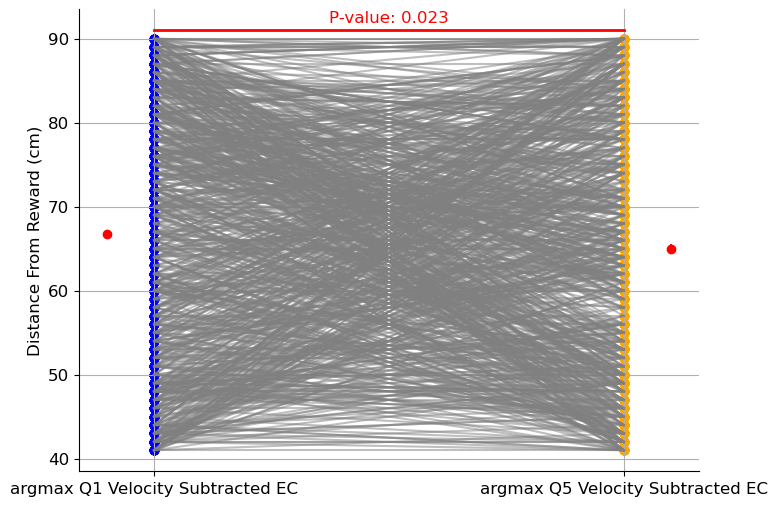

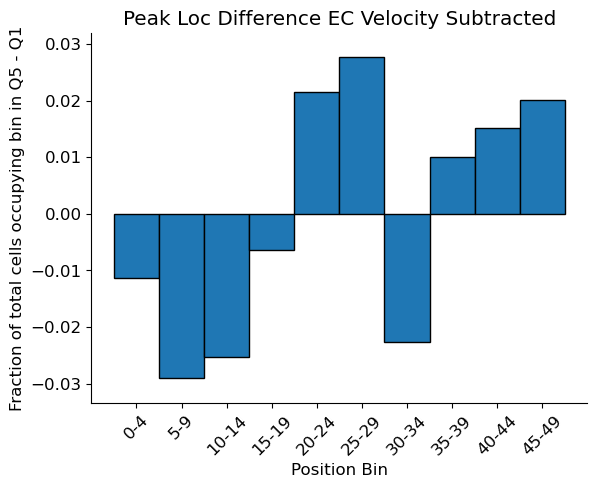

In [384]:
trial_argmax_list_EC_first_quintile_velocity = []
trial_argmax_list_EC_last_quintile_velocity = []

for animal, subdict in residual_activity_velocity_EC.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_velocity_EC[animal][cell]
        EC_quintiles = split_into_quintiles(residual_data)
        first_quintile = EC_quintiles[0]
        last_quintile = EC_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_EC_first_quintile_velocity.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_EC_last_quintile_velocity.append(argmax_loc)
        
trial_argmax_list_EC_first_quintile_velocity_distance = []
for i in trial_argmax_list_EC_first_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_EC_first_quintile_velocity_distance.append(diff)
    
trial_argmax_list_EC_last_quintile_velocity_distance = []
for i in trial_argmax_list_EC_last_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_EC_last_quintile_velocity_distance.append(diff)
    
    
t_stat, p_value_raw_velocity = ttest_rel(trial_argmax_list_EC_first_quintile_velocity_distance, trial_argmax_list_EC_last_quintile_velocity_distance)
        
mean_vl = np.mean(trial_argmax_list_EC_last_quintile_velocity_distance)
mean_velocity = np.mean(trial_argmax_list_EC_first_quintile_velocity_distance)

sem_vl = np.std(trial_argmax_list_EC_last_quintile_velocity_distance) / np.sqrt(len(trial_argmax_list_EC_last_quintile_velocity_distance))
sem_velocity = np.std(trial_argmax_list_EC_first_quintile_velocity_distance) / np.sqrt(len(trial_argmax_list_EC_first_quintile_velocity_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 Velocity Subtracted EC", "argmax Q5 Velocity Subtracted EC"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_EC_last_quintile_velocity_distance)):
    plt.plot(x_positions, [trial_argmax_list_EC_first_quintile_velocity_distance[i], trial_argmax_list_EC_last_quintile_velocity_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_EC_first_quintile_velocity_distance), trial_argmax_list_EC_first_quintile_velocity_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_EC_last_quintile_velocity_distance), trial_argmax_list_EC_last_quintile_velocity_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_EC_first_quintile_velocity_distance), max(trial_argmax_list_EC_last_quintile_velocity_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')



bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_EC_first_quintile_velocity, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_EC_last_quintile_velocity, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_EC_velocity = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_EC_first_quintile_velocity)
    peak_loc_difference_learning_list_EC_velocity.append(value)

y_min = np.min(peak_loc_difference_learning_list_EC_velocity)
y_max = np.max(peak_loc_difference_learning_list_EC_velocity)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_EC_velocity, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference EC Velocity Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()



plt.show()
        

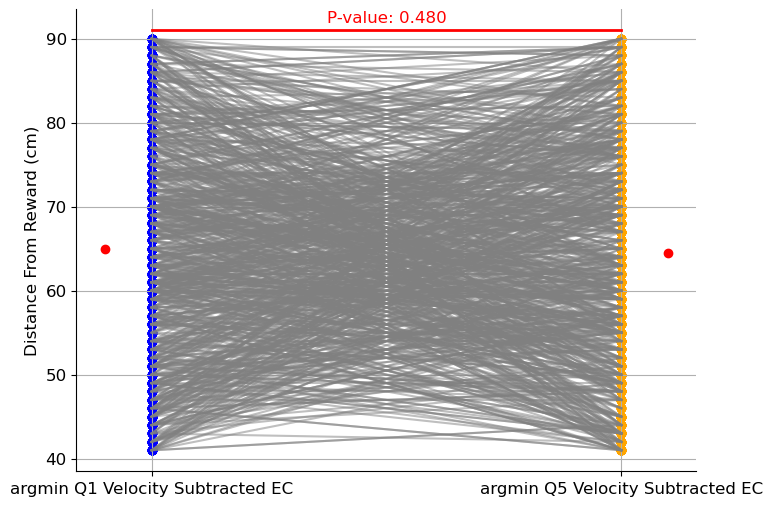

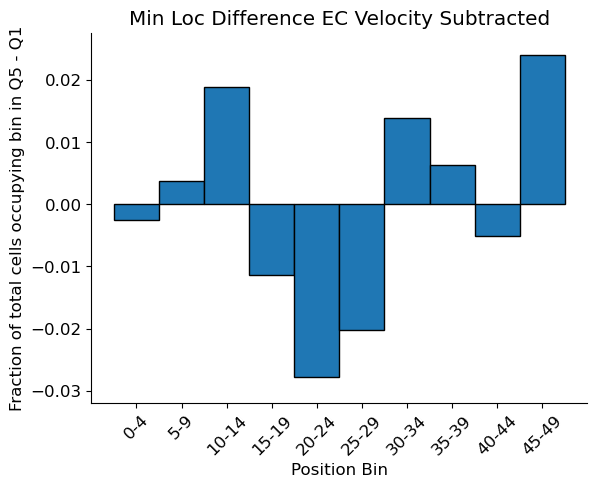

In [385]:
trial_argmin_list_EC_first_quintile_velocity = []
trial_argmin_list_EC_last_quintile_velocity = []

for animal, subdict in residual_activity_velocity_EC.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_velocity_EC[animal][cell]
        EC_quintiles = split_into_quintiles(residual_data)
        first_quintile = EC_quintiles[0]
        last_quintile = EC_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_EC_first_quintile_velocity.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_EC_last_quintile_velocity.append(argmin_loc)
        
trial_argmin_list_EC_first_quintile_velocity_distance = []
for i in trial_argmin_list_EC_first_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_EC_first_quintile_velocity_distance.append(diff)
    
trial_argmin_list_EC_last_quintile_velocity_distance = []
for i in trial_argmin_list_EC_last_quintile_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_EC_last_quintile_velocity_distance.append(diff)
    
    
t_stat, p_value_raw_velocity = ttest_rel(trial_argmin_list_EC_first_quintile_velocity_distance, trial_argmin_list_EC_last_quintile_velocity_distance)
        
mean_vl = np.mean(trial_argmin_list_EC_last_quintile_velocity_distance)
mean_velocity = np.mean(trial_argmin_list_EC_first_quintile_velocity_distance)

sem_vl = np.std(trial_argmin_list_EC_last_quintile_velocity_distance) / np.sqrt(len(trial_argmin_list_EC_last_quintile_velocity_distance))
sem_velocity = np.std(trial_argmin_list_EC_first_quintile_velocity_distance) / np.sqrt(len(trial_argmin_list_EC_first_quintile_velocity_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 Velocity Subtracted EC", "argmin Q5 Velocity Subtracted EC"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_EC_last_quintile_velocity_distance)):
    plt.plot(x_positions, [trial_argmin_list_EC_first_quintile_velocity_distance[i], trial_argmin_list_EC_last_quintile_velocity_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_EC_first_quintile_velocity_distance), trial_argmin_list_EC_first_quintile_velocity_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_EC_last_quintile_velocity_distance), trial_argmin_list_EC_last_quintile_velocity_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_EC_first_quintile_velocity_distance), max(trial_argmin_list_EC_last_quintile_velocity_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')




bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmin_list_EC_first_quintile_velocity, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmin_list_EC_last_quintile_velocity, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_EC_velocity = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_EC_first_quintile_velocity)
    min_loc_difference_learning_list_EC_velocity.append(value)

y_min = np.min(min_loc_difference_learning_list_EC_velocity)
y_max = np.max(min_loc_difference_learning_list_EC_velocity)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_EC_velocity, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference EC Velocity Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)
plt.show()

plt.show()
        

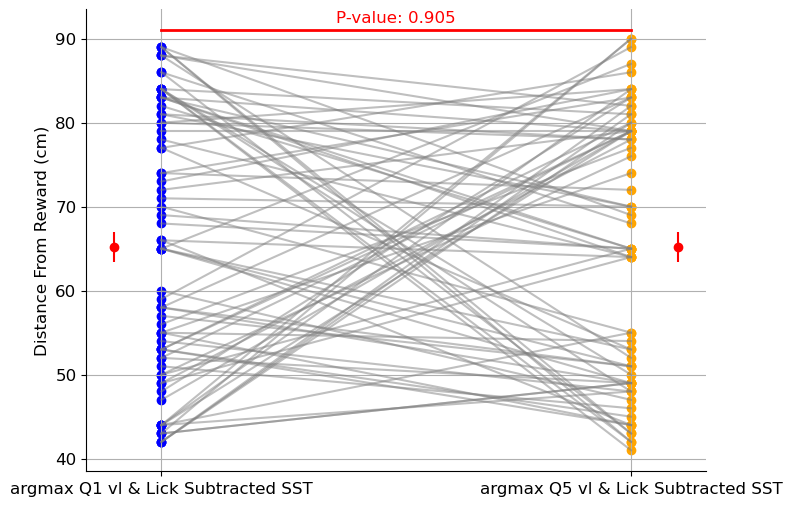

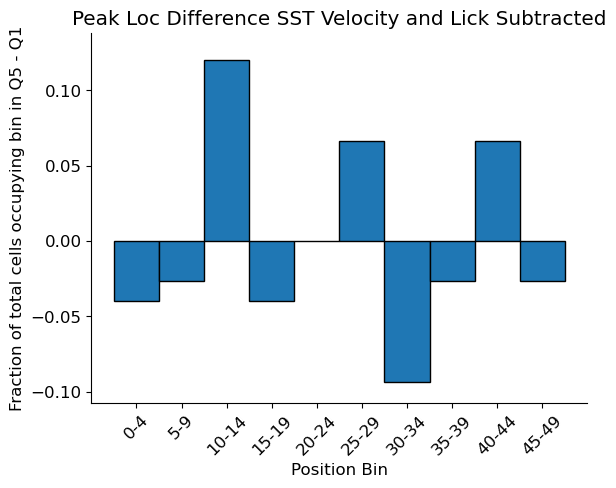

In [382]:
trial_argmax_list_SST_first_quintile_vl = []
trial_argmax_list_SST_last_quintile_vl = []

for animal, subdict in residual_activity_vl_SST.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vl_SST[animal][cell]
        sst_quintiles = split_into_quintiles(residual_data)
        first_quintile = sst_quintiles[0]
        last_quintile = sst_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_first_quintile_vl.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_last_quintile_vl.append(argmax_loc)
        
trial_argmax_list_SST_first_quintile_vl_distance = []
for i in trial_argmax_list_SST_first_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_SST_first_quintile_vl_distance.append(diff)
    
trial_argmax_list_SST_last_quintile_vl_distance = []
for i in trial_argmax_list_SST_last_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_SST_last_quintile_vl_distance.append(diff)
    
    
t_stat, p_value_raw_vl = ttest_rel(trial_argmax_list_SST_first_quintile_vl_distance, trial_argmax_list_SST_last_quintile_vl_distance)
        
mean_vl = np.mean(trial_argmax_list_SST_last_quintile_vl_distance)
mean_vl = np.mean(trial_argmax_list_SST_first_quintile_vl_distance)

sem_vl = np.std(trial_argmax_list_SST_last_quintile_vl_distance) / np.sqrt(len(trial_argmax_list_SST_last_quintile_vl_distance))
sem_vl = np.std(trial_argmax_list_SST_first_quintile_vl_distance) / np.sqrt(len(trial_argmax_list_SST_first_quintile_vl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 vl & Lick Subtracted SST", "argmax Q5 vl & Lick Subtracted SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_SST_last_quintile_vl_distance)):
    plt.plot(x_positions, [trial_argmax_list_SST_first_quintile_vl_distance[i], trial_argmax_list_SST_last_quintile_vl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_SST_first_quintile_vl_distance), trial_argmax_list_SST_first_quintile_vl_distance, color='blue', label="First Quintile Distance From Reward SST")
plt.scatter([x_positions[1]] * len(trial_argmax_list_SST_last_quintile_vl_distance), trial_argmax_list_SST_last_quintile_vl_distance, color='orange', label="Last Quintile Distance From Reward SST")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_SST_first_quintile_vl_distance), max(trial_argmax_list_SST_last_quintile_vl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vl:.3f}", ha='center', color='red')



bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_SST_first_quintile_vl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_SST_last_quintile_vl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_SST_vl = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_SST_first_quintile_vl)
    peak_loc_difference_learning_list_SST_vl.append(value)

y_min = np.min(peak_loc_difference_learning_list_SST_vl)
y_max = np.max(peak_loc_difference_learning_list_SST_vl)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_SST_vl, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference SST Velocity and Lick Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()




plt.show()
        

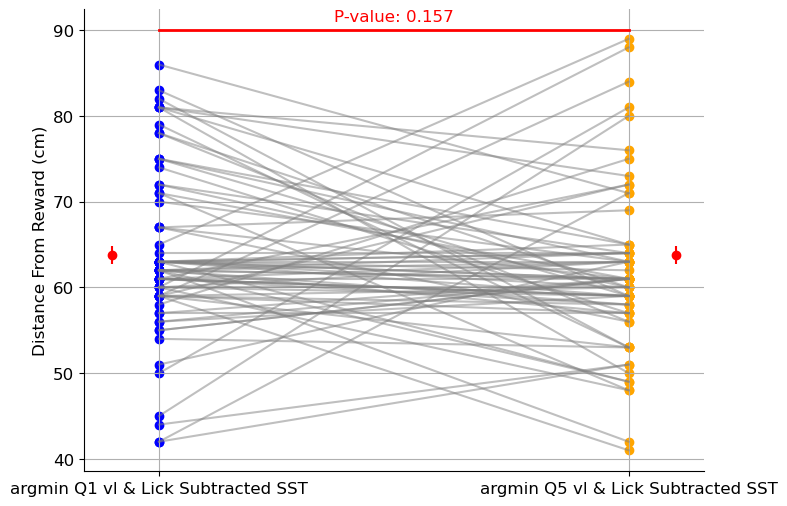

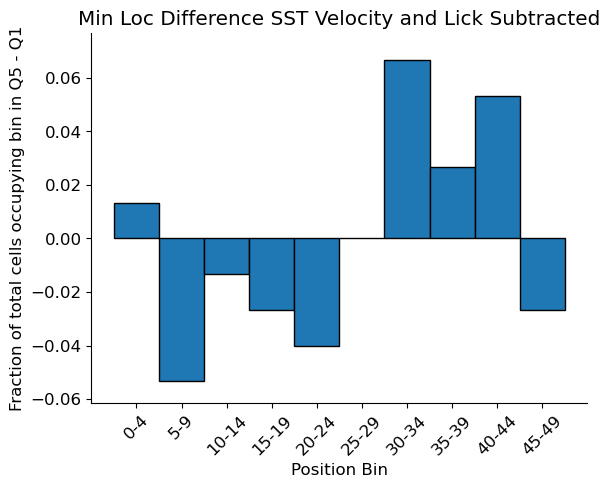

In [381]:
trial_argmin_list_SST_first_quintile_vl = []
trial_argmin_list_SST_last_quintile_vl = []

for animal, subdict in residual_activity_vl_SST.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vl_SST[animal][cell]
        sst_quintiles = split_into_quintiles(residual_data)
        first_quintile = sst_quintiles[0]
        last_quintile = sst_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_SST_first_quintile_vl.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_SST_last_quintile_vl.append(argmin_loc)
        
trial_argmin_list_SST_first_quintile_vl_distance = []
for i in trial_argmin_list_SST_first_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_SST_first_quintile_vl_distance.append(diff)
    
trial_argmin_list_SST_last_quintile_vl_distance = []
for i in trial_argmin_list_SST_last_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_SST_last_quintile_vl_distance.append(diff)
    
    
t_stat, p_value_raw_vl = ttest_rel(trial_argmin_list_SST_first_quintile_vl_distance, trial_argmin_list_SST_last_quintile_vl_distance)
        
mean_vl = np.mean(trial_argmin_list_SST_last_quintile_vl_distance)
mean_vl = np.mean(trial_argmin_list_SST_first_quintile_vl_distance)

sem_vl = np.std(trial_argmin_list_SST_last_quintile_vl_distance) / np.sqrt(len(trial_argmin_list_SST_last_quintile_vl_distance))
sem_vl = np.std(trial_argmin_list_SST_first_quintile_vl_distance) / np.sqrt(len(trial_argmin_list_SST_first_quintile_vl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 vl & Lick Subtracted SST", "argmin Q5 vl & Lick Subtracted SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_SST_last_quintile_vl_distance)):
    plt.plot(x_positions, [trial_argmin_list_SST_first_quintile_vl_distance[i], trial_argmin_list_SST_last_quintile_vl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_SST_first_quintile_vl_distance), trial_argmin_list_SST_first_quintile_vl_distance, color='blue', label="First Quintile Distance From Reward SST")
plt.scatter([x_positions[1]] * len(trial_argmin_list_SST_last_quintile_vl_distance), trial_argmin_list_SST_last_quintile_vl_distance, color='orange', label="Last Quintile Distance From Reward SST")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_SST_first_quintile_vl_distance), max(trial_argmin_list_SST_last_quintile_vl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vl:.3f}", ha='center', color='red')





bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmin_list_SST_first_quintile_vl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmin_list_SST_last_quintile_vl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_SST_vl = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_SST_first_quintile_vl)
    min_loc_difference_learning_list_SST_vl.append(value)

y_min = np.min(min_loc_difference_learning_list_SST_vl)
y_max = np.max(min_loc_difference_learning_list_SST_vl)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_SST_vl, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference SST Velocity and Lick Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)
plt.show()



plt.show()
        

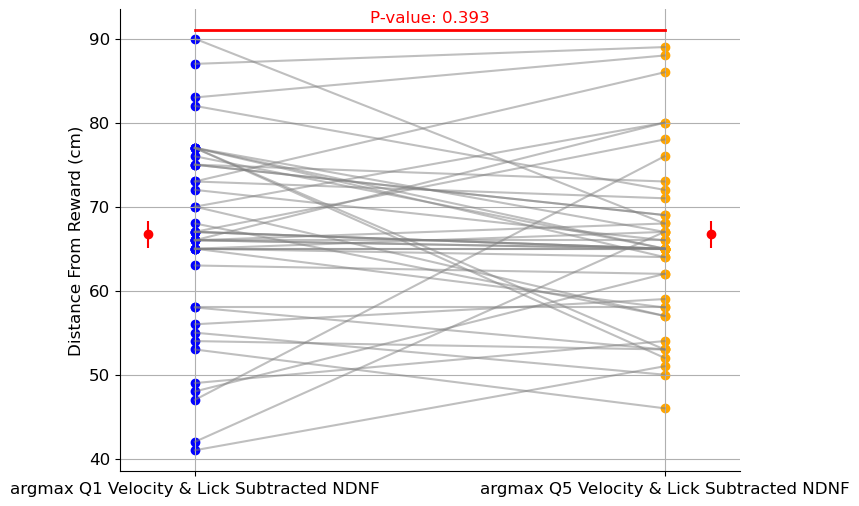

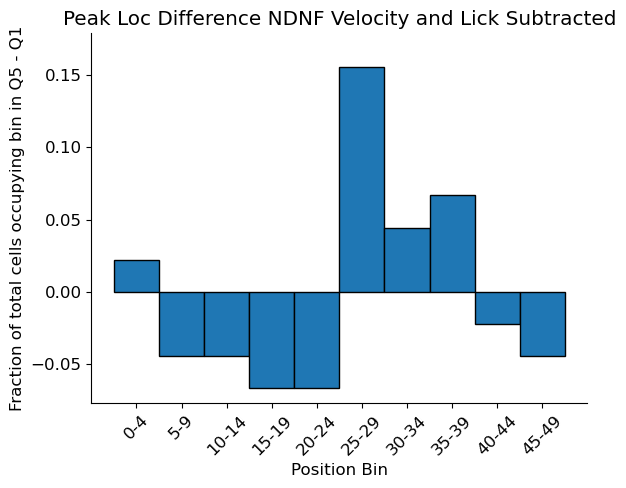

In [380]:
trial_argmax_list_NDNF_first_quintile_vl = []
trial_argmax_list_NDNF_last_quintile_vl = []

for animal, subdict in residual_activity_vl_NDNF.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vl_NDNF[animal][cell]
        NDNF_quintiles = split_into_quintiles(residual_data)
        first_quintile = NDNF_quintiles[0]
        last_quintile = NDNF_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_NDNF_first_quintile_vl.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_NDNF_last_quintile_vl.append(argmax_loc)
        
trial_argmax_list_NDNF_first_quintile_vl_distance = []
for i in trial_argmax_list_NDNF_first_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_NDNF_first_quintile_vl_distance.append(diff)
    
trial_argmax_list_NDNF_last_quintile_vl_distance = []
for i in trial_argmax_list_NDNF_last_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_NDNF_last_quintile_vl_distance.append(diff)
    
    
t_stat, p_value_raw_vl = ttest_rel(trial_argmax_list_NDNF_first_quintile_vl_distance, trial_argmax_list_NDNF_last_quintile_vl_distance)
        
mean_vl = np.mean(trial_argmax_list_NDNF_last_quintile_vl_distance)
mean_vl = np.mean(trial_argmax_list_NDNF_first_quintile_vl_distance)

sem_vl = np.std(trial_argmax_list_NDNF_last_quintile_vl_distance) / np.sqrt(len(trial_argmax_list_NDNF_last_quintile_vl_distance))
sem_vl = np.std(trial_argmax_list_NDNF_first_quintile_vl_distance) / np.sqrt(len(trial_argmax_list_NDNF_first_quintile_vl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 Velocity & Lick Subtracted NDNF", "argmax Q5 Velocity & Lick Subtracted NDNF"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_NDNF_last_quintile_vl_distance)):
    plt.plot(x_positions, [trial_argmax_list_NDNF_first_quintile_vl_distance[i], trial_argmax_list_NDNF_last_quintile_vl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_NDNF_first_quintile_vl_distance), trial_argmax_list_NDNF_first_quintile_vl_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_NDNF_last_quintile_vl_distance), trial_argmax_list_NDNF_last_quintile_vl_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_NDNF_first_quintile_vl_distance), max(trial_argmax_list_NDNF_last_quintile_vl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vl:.3f}", ha='center', color='red')





bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_first_quintile_vl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_last_quintile_vl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_NDNF_vl = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_NDNF_first_quintile_vl)
    peak_loc_difference_learning_list_NDNF_vl.append(value)

y_min = np.min(peak_loc_difference_learning_list_NDNF_vl)
y_max = np.max(peak_loc_difference_learning_list_NDNF_vl)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_NDNF_vl, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference NDNF Velocity and Lick Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()



plt.show()
        

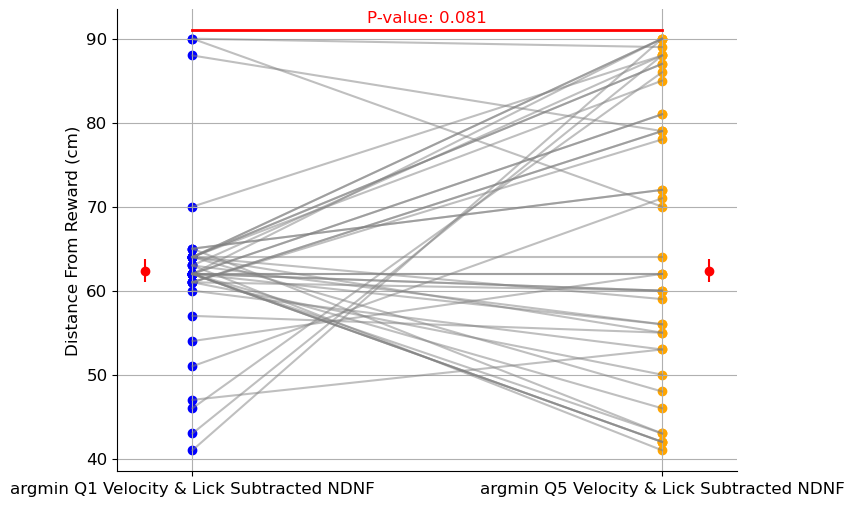

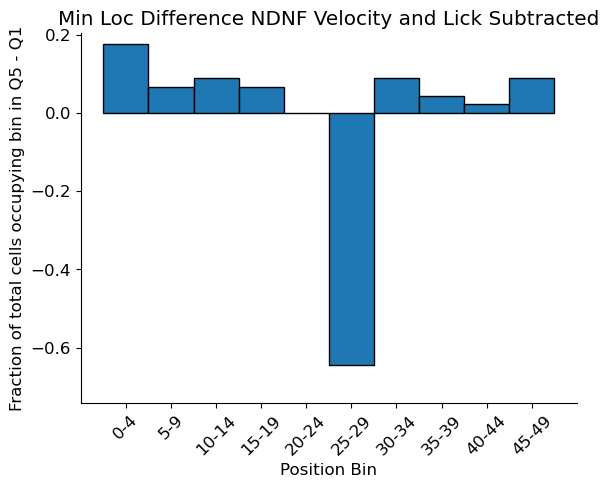

In [379]:
trial_argmin_list_NDNF_first_quintile_vl = []
trial_argmin_list_NDNF_last_quintile_vl = []

for animal, subdict in residual_activity_vl_NDNF.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vl_NDNF[animal][cell]
        NDNF_quintiles = split_into_quintiles(residual_data)
        first_quintile = NDNF_quintiles[0]
        last_quintile = NDNF_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_NDNF_first_quintile_vl.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_NDNF_last_quintile_vl.append(argmin_loc)
        
trial_argmin_list_NDNF_first_quintile_vl_distance = []
for i in trial_argmin_list_NDNF_first_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_NDNF_first_quintile_vl_distance.append(diff)
    
trial_argmin_list_NDNF_last_quintile_vl_distance = []
for i in trial_argmin_list_NDNF_last_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_NDNF_last_quintile_vl_distance.append(diff)
    
    
t_stat, p_value_raw_vl = ttest_rel(trial_argmin_list_NDNF_first_quintile_vl_distance, trial_argmin_list_NDNF_last_quintile_vl_distance)
        
mean_vl = np.mean(trial_argmin_list_NDNF_last_quintile_vl_distance)
mean_vl = np.mean(trial_argmin_list_NDNF_first_quintile_vl_distance)

sem_vl = np.std(trial_argmin_list_NDNF_last_quintile_vl_distance) / np.sqrt(len(trial_argmin_list_NDNF_last_quintile_vl_distance))
sem_vl = np.std(trial_argmin_list_NDNF_first_quintile_vl_distance) / np.sqrt(len(trial_argmin_list_NDNF_first_quintile_vl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 Velocity & Lick Subtracted NDNF", "argmin Q5 Velocity & Lick Subtracted NDNF"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_NDNF_last_quintile_vl_distance)):
    plt.plot(x_positions, [trial_argmin_list_NDNF_first_quintile_vl_distance[i], trial_argmin_list_NDNF_last_quintile_vl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_NDNF_first_quintile_vl_distance), trial_argmin_list_NDNF_first_quintile_vl_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_NDNF_last_quintile_vl_distance), trial_argmin_list_NDNF_last_quintile_vl_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_NDNF_first_quintile_vl_distance), max(trial_argmin_list_NDNF_last_quintile_vl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vl:.3f}", ha='center', color='red')





bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmin_list_NDNF_first_quintile_vl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmin_list_NDNF_last_quintile_vl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_NDNF_vl = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_NDNF_first_quintile_vl)
    min_loc_difference_learning_list_NDNF_vl.append(value)

y_min = np.min(min_loc_difference_learning_list_NDNF_vl)
y_max = np.max(min_loc_difference_learning_list_NDNF_vl)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_NDNF_vl, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference NDNF Velocity and Lick Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)
plt.show()



plt.show()
        

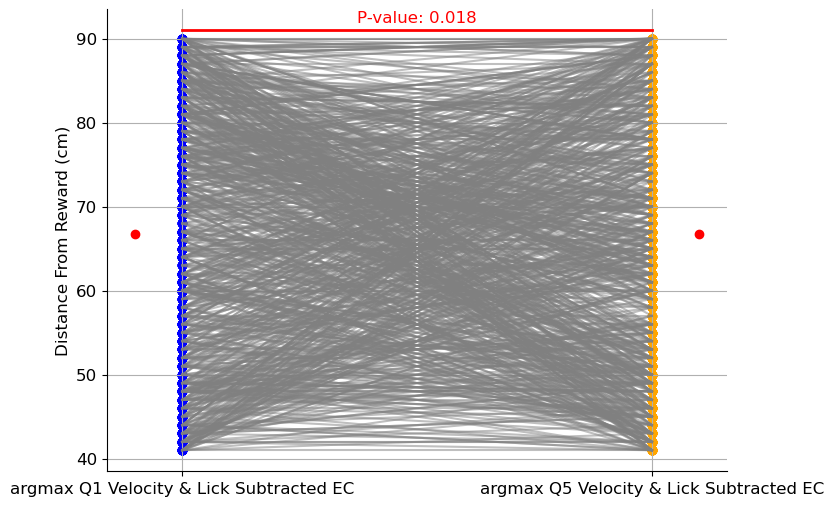

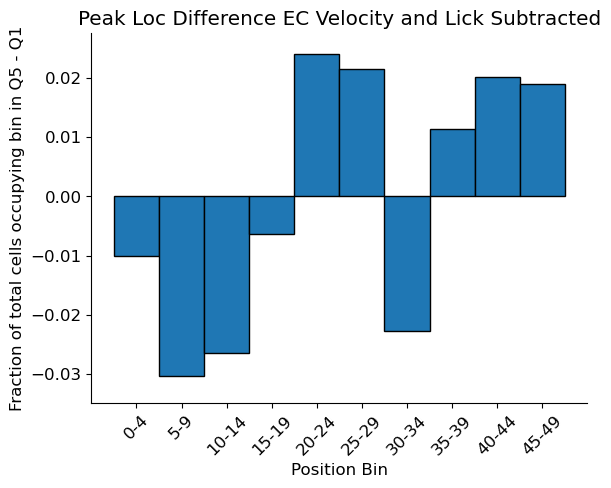

In [378]:
trial_argmax_list_EC_first_quintile_vl = []
trial_argmax_list_EC_last_quintile_vl = []

for animal, subdict in residual_activity_vl_EC.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vl_EC[animal][cell]
        EC_quintiles = split_into_quintiles(residual_data)
        first_quintile = EC_quintiles[0]
        last_quintile = EC_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_EC_first_quintile_vl.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_EC_last_quintile_vl.append(argmax_loc)
        
trial_argmax_list_EC_first_quintile_vl_distance = []
for i in trial_argmax_list_EC_first_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_EC_first_quintile_vl_distance.append(diff)
    
trial_argmax_list_EC_last_quintile_vl_distance = []
for i in trial_argmax_list_EC_last_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_EC_last_quintile_vl_distance.append(diff)
    
    
t_stat, p_value_raw_vl = ttest_rel(trial_argmax_list_EC_first_quintile_vl_distance, trial_argmax_list_EC_last_quintile_vl_distance)
        
mean_vl = np.mean(trial_argmax_list_EC_last_quintile_vl_distance)
mean_vl = np.mean(trial_argmax_list_EC_first_quintile_vl_distance)

sem_vl = np.std(trial_argmax_list_EC_last_quintile_vl_distance) / np.sqrt(len(trial_argmax_list_EC_last_quintile_vl_distance))
sem_vl = np.std(trial_argmax_list_EC_first_quintile_vl_distance) / np.sqrt(len(trial_argmax_list_EC_first_quintile_vl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 Velocity & Lick Subtracted EC", "argmax Q5 Velocity & Lick Subtracted EC"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_EC_last_quintile_vl_distance)):
    plt.plot(x_positions, [trial_argmax_list_EC_first_quintile_vl_distance[i], trial_argmax_list_EC_last_quintile_vl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_EC_first_quintile_vl_distance), trial_argmax_list_EC_first_quintile_vl_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_EC_last_quintile_vl_distance), trial_argmax_list_EC_last_quintile_vl_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_EC_first_quintile_vl_distance), max(trial_argmax_list_EC_last_quintile_vl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vl:.3f}", ha='center', color='red')



bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_EC_first_quintile_vl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_EC_last_quintile_vl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_EC_vl = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_EC_first_quintile_vl)
    peak_loc_difference_learning_list_EC_vl.append(value)

y_min = np.min(peak_loc_difference_learning_list_EC_vl)
y_max = np.max(peak_loc_difference_learning_list_EC_vl)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_EC_vl, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference EC Velocity and Lick Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()




plt.show()
        

mean_vl_last 64.83964646464646
mean_vl_first 64.94444444444444


NameError: name 'trial_argmax_list_EC_first_quintile_vl' is not defined

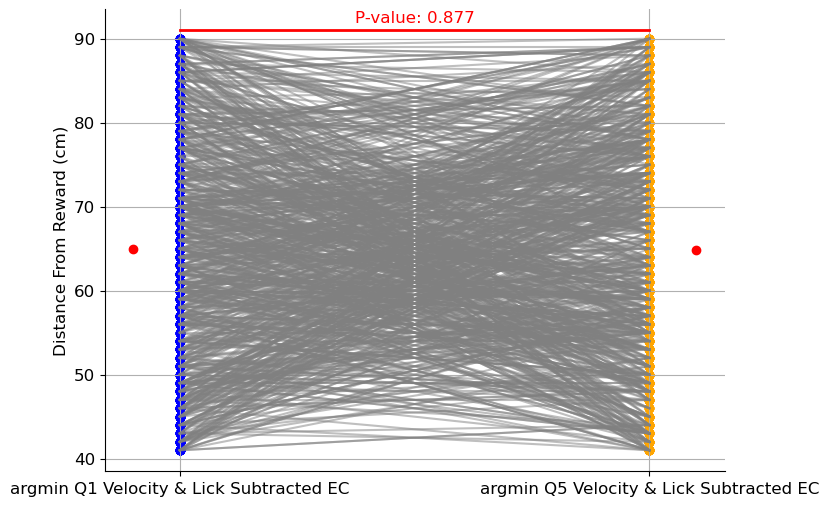

In [55]:
trial_argmin_list_EC_first_quintile_vl = []
trial_argmin_list_EC_last_quintile_vl = []

for animal, subdict in residual_activity_vl_EC.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vl_EC[animal][cell]
        EC_quintiles = split_into_quintiles(residual_data)
        first_quintile = EC_quintiles[0]
        last_quintile = EC_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_EC_first_quintile_vl.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_EC_last_quintile_vl.append(argmin_loc)
        
trial_argmin_list_EC_first_quintile_vl_distance = []
for i in trial_argmin_list_EC_first_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_EC_first_quintile_vl_distance.append(diff)
    
trial_argmin_list_EC_last_quintile_vl_distance = []
for i in trial_argmin_list_EC_last_quintile_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_EC_last_quintile_vl_distance.append(diff)
    
    
t_stat, p_value_raw_vl = ttest_rel(trial_argmin_list_EC_first_quintile_vl_distance, trial_argmin_list_EC_last_quintile_vl_distance)
        
mean_vl_last = np.mean(trial_argmin_list_EC_last_quintile_vl_distance)
mean_vl_first = np.mean(trial_argmin_list_EC_first_quintile_vl_distance)

sem_vl_last = np.std(trial_argmin_list_EC_last_quintile_vl_distance) / np.sqrt(len(trial_argmin_list_EC_last_quintile_vl_distance))
sem_vl_first = np.std(trial_argmin_list_EC_first_quintile_vl_distance) / np.sqrt(len(trial_argmin_list_EC_first_quintile_vl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 Velocity & Lick Subtracted EC", "argmin Q5 Velocity & Lick Subtracted EC"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vl_first, yerr=sem_vl_first, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl_last, yerr=sem_vl_last, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_EC_last_quintile_vl_distance)):
    plt.plot(x_positions, [trial_argmin_list_EC_first_quintile_vl_distance[i], trial_argmin_list_EC_last_quintile_vl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_EC_first_quintile_vl_distance), trial_argmin_list_EC_first_quintile_vl_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_EC_last_quintile_vl_distance), trial_argmin_list_EC_last_quintile_vl_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_EC_first_quintile_vl_distance), max(trial_argmin_list_EC_last_quintile_vl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vl:.3f}", ha='center', color='red')


print(f"mean_vl_last {mean_vl_last}")
print(f"mean_vl_first {mean_vl_first}")


bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmin_list_EC_first_quintile_vl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmin_list_EC_last_quintile_vl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_EC_vl = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_EC_first_quintile_vl)
    min_loc_difference_learning_list_EC_vl.append(value)

y_min = np.min(min_loc_difference_learning_list_EC_vl)
y_max = np.max(min_loc_difference_learning_list_EC_vl)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_EC_vl, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference EC Velocity and Lick Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)
plt.show()



plt.show()
        

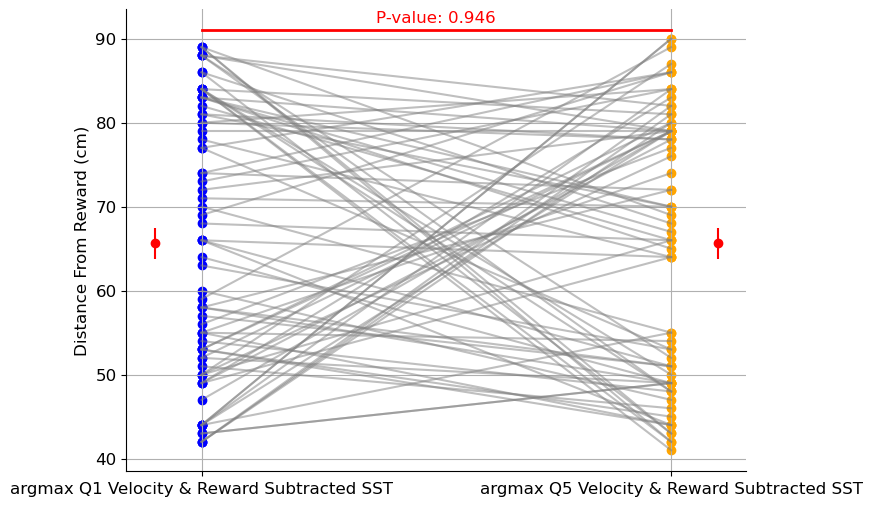

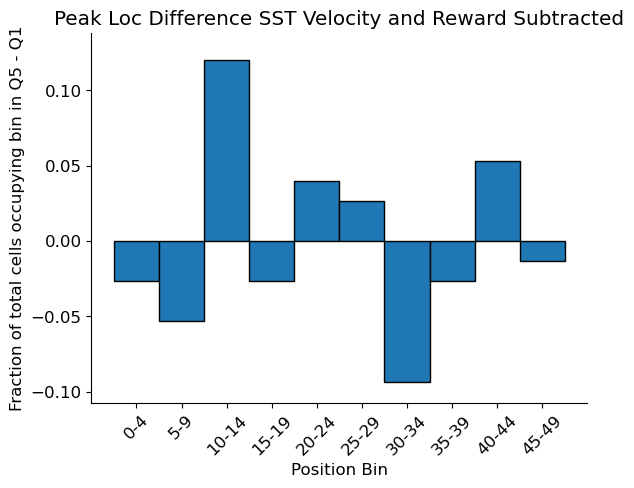

In [376]:
trial_argmax_list_SST_first_quintile_vr = []
trial_argmax_list_SST_last_quintile_vr = []

for animal, subdict in residual_activity_vr_SST.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vr_SST[animal][cell]
        sst_quintiles = split_into_quintiles(residual_data)
        first_quintile = sst_quintiles[0]
        last_quintile = sst_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_first_quintile_vr.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_last_quintile_vr.append(argmax_loc)
        
trial_argmax_list_SST_first_quintile_vr_distance = []
for i in trial_argmax_list_SST_first_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_SST_first_quintile_vr_distance.append(diff)
    
trial_argmax_list_SST_last_quintile_vr_distance = []
for i in trial_argmax_list_SST_last_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_SST_last_quintile_vr_distance.append(diff)
    
    
t_stat, p_value_raw_vr = ttest_rel(trial_argmax_list_SST_first_quintile_vr_distance, trial_argmax_list_SST_last_quintile_vr_distance)
        
mean_vr = np.mean(trial_argmax_list_SST_last_quintile_vr_distance)
mean_vr = np.mean(trial_argmax_list_SST_first_quintile_vr_distance)

sem_vr = np.std(trial_argmax_list_SST_last_quintile_vr_distance) / np.sqrt(len(trial_argmax_list_SST_last_quintile_vr_distance))
sem_vr = np.std(trial_argmax_list_SST_first_quintile_vr_distance) / np.sqrt(len(trial_argmax_list_SST_first_quintile_vr_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 Velocity & Reward Subtracted SST", "argmax Q5 Velocity & Reward Subtracted SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vr, yerr=sem_vr, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vr, yerr=sem_vr, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_SST_last_quintile_vr_distance)):
    plt.plot(x_positions, [trial_argmax_list_SST_first_quintile_vr_distance[i], trial_argmax_list_SST_last_quintile_vr_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_SST_first_quintile_vr_distance), trial_argmax_list_SST_first_quintile_vr_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_SST_last_quintile_vr_distance), trial_argmax_list_SST_last_quintile_vr_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_SST_first_quintile_vr_distance), max(trial_argmax_list_SST_last_quintile_vr_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vr:.3f}", ha='center', color='red')




bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_SST_first_quintile_vr, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_SST_last_quintile_vr, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_SST_vr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_SST_first_quintile_vr)
    peak_loc_difference_learning_list_SST_vr.append(value)

y_min = np.min(peak_loc_difference_learning_list_SST_vr)
y_max = np.max(peak_loc_difference_learning_list_SST_vr)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_SST_vr, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference SST Velocity and Reward Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()




plt.show()
        

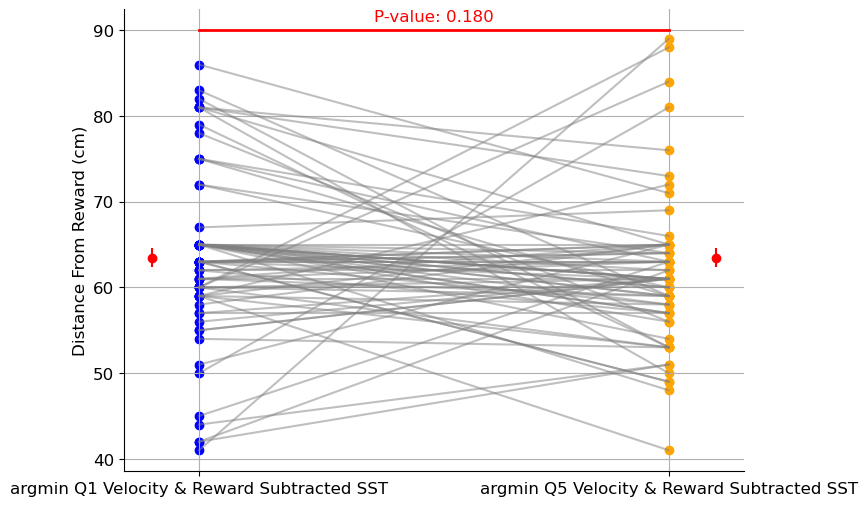

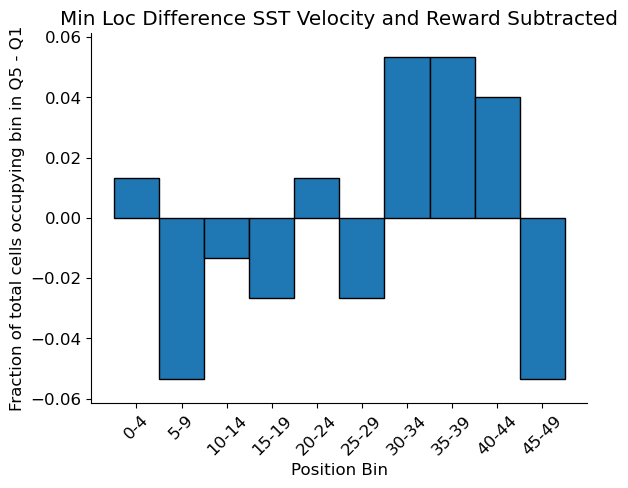

In [375]:
trial_argmin_list_SST_first_quintile_vr = []
trial_argmin_list_SST_last_quintile_vr = []

for animal, subdict in residual_activity_vr_SST.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vr_SST[animal][cell]
        sst_quintiles = split_into_quintiles(residual_data)
        first_quintile = sst_quintiles[0]
        last_quintile = sst_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_SST_first_quintile_vr.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_SST_last_quintile_vr.append(argmin_loc)
        
trial_argmin_list_SST_first_quintile_vr_distance = []
for i in trial_argmin_list_SST_first_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_SST_first_quintile_vr_distance.append(diff)
    
trial_argmin_list_SST_last_quintile_vr_distance = []
for i in trial_argmin_list_SST_last_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_SST_last_quintile_vr_distance.append(diff)
    
    
t_stat, p_value_raw_vr = ttest_rel(trial_argmin_list_SST_first_quintile_vr_distance, trial_argmin_list_SST_last_quintile_vr_distance)
        
mean_vr = np.mean(trial_argmin_list_SST_last_quintile_vr_distance)
mean_vr = np.mean(trial_argmin_list_SST_first_quintile_vr_distance)

sem_vr = np.std(trial_argmin_list_SST_last_quintile_vr_distance) / np.sqrt(len(trial_argmin_list_SST_last_quintile_vr_distance))
sem_vr = np.std(trial_argmin_list_SST_first_quintile_vr_distance) / np.sqrt(len(trial_argmin_list_SST_first_quintile_vr_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 Velocity & Reward Subtracted SST", "argmin Q5 Velocity & Reward Subtracted SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vr, yerr=sem_vr, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vr, yerr=sem_vr, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_SST_last_quintile_vr_distance)):
    plt.plot(x_positions, [trial_argmin_list_SST_first_quintile_vr_distance[i], trial_argmin_list_SST_last_quintile_vr_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_SST_first_quintile_vr_distance), trial_argmin_list_SST_first_quintile_vr_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_SST_last_quintile_vr_distance), trial_argmin_list_SST_last_quintile_vr_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_SST_first_quintile_vr_distance), max(trial_argmin_list_SST_last_quintile_vr_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vr:.3f}", ha='center', color='red')




bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmin_list_SST_first_quintile_vr, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmin_list_SST_last_quintile_vr, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_SST_vr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_SST_first_quintile_vr)
    min_loc_difference_learning_list_SST_vr.append(value)

y_min = np.min(min_loc_difference_learning_list_SST_vr)
y_max = np.max(min_loc_difference_learning_list_SST_vr)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_SST_vr, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference SST Velocity and Reward Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)
plt.show()




plt.show()
        

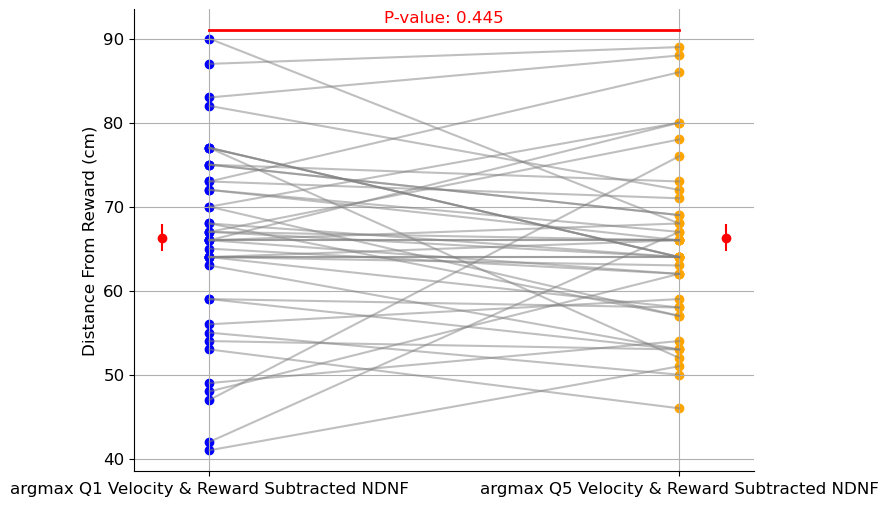

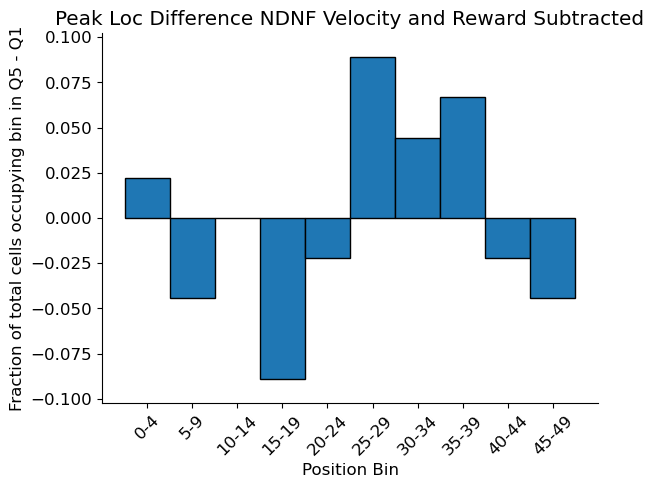

In [374]:
trial_argmax_list_NDNF_first_quintile_vr = []
trial_argmax_list_NDNF_last_quintile_vr = []

for animal, subdict in residual_activity_vr_NDNF.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vr_NDNF[animal][cell]
        NDNF_quintiles = split_into_quintiles(residual_data)
        first_quintile = NDNF_quintiles[0]
        last_quintile = NDNF_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_NDNF_first_quintile_vr.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_NDNF_last_quintile_vr.append(argmax_loc)
        
trial_argmax_list_NDNF_first_quintile_vr_distance = []
for i in trial_argmax_list_NDNF_first_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_NDNF_first_quintile_vr_distance.append(diff)
    
trial_argmax_list_NDNF_last_quintile_vr_distance = []
for i in trial_argmax_list_NDNF_last_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_NDNF_last_quintile_vr_distance.append(diff)
    
    
t_stat, p_value_raw_vr = ttest_rel(trial_argmax_list_NDNF_first_quintile_vr_distance, trial_argmax_list_NDNF_last_quintile_vr_distance)
        
mean_vr = np.mean(trial_argmax_list_NDNF_last_quintile_vr_distance)
mean_vr = np.mean(trial_argmax_list_NDNF_first_quintile_vr_distance)

sem_vr = np.std(trial_argmax_list_NDNF_last_quintile_vr_distance) / np.sqrt(len(trial_argmax_list_NDNF_last_quintile_vr_distance))
sem_vr = np.std(trial_argmax_list_NDNF_first_quintile_vr_distance) / np.sqrt(len(trial_argmax_list_NDNF_first_quintile_vr_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 Velocity & Reward Subtracted NDNF", "argmax Q5 Velocity & Reward Subtracted NDNF"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vr, yerr=sem_vr, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vr, yerr=sem_vr, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_NDNF_last_quintile_vr_distance)):
    plt.plot(x_positions, [trial_argmax_list_NDNF_first_quintile_vr_distance[i], trial_argmax_list_NDNF_last_quintile_vr_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_NDNF_first_quintile_vr_distance), trial_argmax_list_NDNF_first_quintile_vr_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_NDNF_last_quintile_vr_distance), trial_argmax_list_NDNF_last_quintile_vr_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_max = max(max(trial_argmax_list_NDNF_first_quintile_vr_distance), max(trial_argmax_list_NDNF_last_quintile_vr_distance))
plt.plot([x_positions[0], x_positions[1]], [y_max + 1, y_max + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_max + 2, f"P-value: {p_value_raw_vr:.3f}", ha='center', color='red')






bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_first_quintile_vr, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_last_quintile_vr, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_NDNF_vr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_NDNF_first_quintile_vr)
    peak_loc_difference_learning_list_NDNF_vr.append(value)

y_min = np.min(peak_loc_difference_learning_list_NDNF_vr)
y_max = np.max(peak_loc_difference_learning_list_NDNF_vr)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_NDNF_vr, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference NDNF Velocity and Reward Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()


plt.show()
        

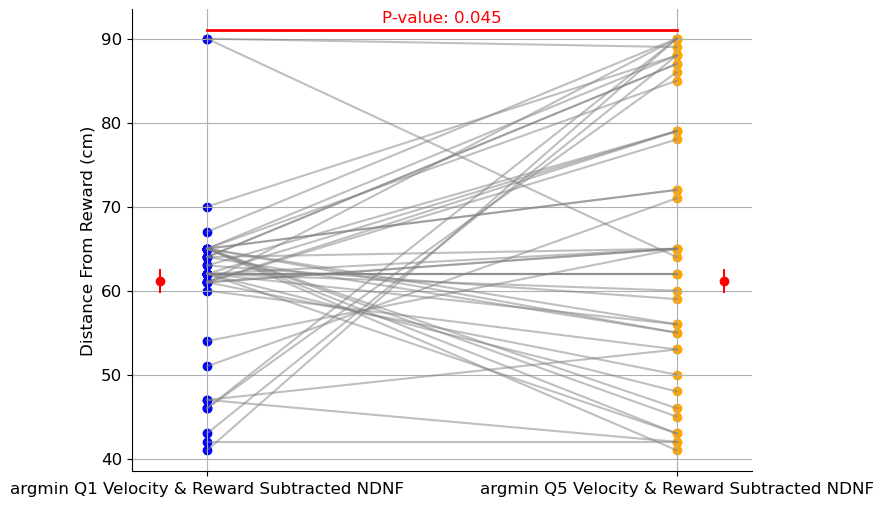

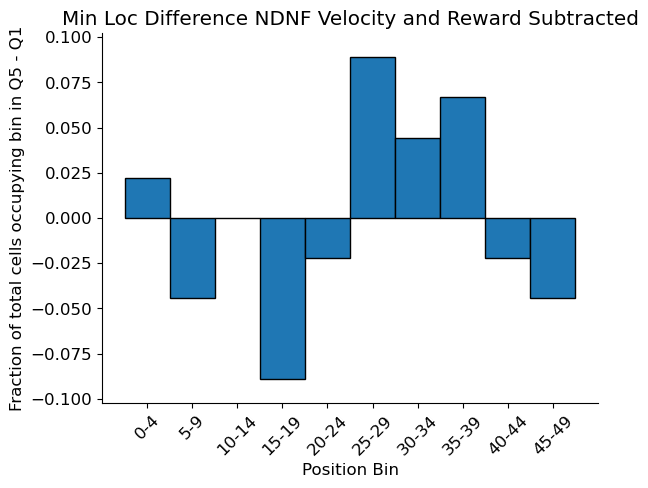

In [373]:
trial_argmin_list_NDNF_first_quintile_vr = []
trial_argmin_list_NDNF_last_quintile_vr = []

for animal, subdict in residual_activity_vr_NDNF.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vr_NDNF[animal][cell]
        NDNF_quintiles = split_into_quintiles(residual_data)
        first_quintile = NDNF_quintiles[0]
        last_quintile = NDNF_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_NDNF_first_quintile_vr.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_NDNF_last_quintile_vr.append(argmin_loc)
        
trial_argmin_list_NDNF_first_quintile_vr_distance = []
for i in trial_argmin_list_NDNF_first_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_NDNF_first_quintile_vr_distance.append(diff)
    
trial_argmin_list_NDNF_last_quintile_vr_distance = []
for i in trial_argmin_list_NDNF_last_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_NDNF_last_quintile_vr_distance.append(diff)
    
    
t_stat, p_value_raw_vr = ttest_rel(trial_argmin_list_NDNF_first_quintile_vr_distance, trial_argmin_list_NDNF_last_quintile_vr_distance)
        
mean_vr = np.mean(trial_argmin_list_NDNF_last_quintile_vr_distance)
mean_vr = np.mean(trial_argmin_list_NDNF_first_quintile_vr_distance)

sem_vr = np.std(trial_argmin_list_NDNF_last_quintile_vr_distance) / np.sqrt(len(trial_argmin_list_NDNF_last_quintile_vr_distance))
sem_vr = np.std(trial_argmin_list_NDNF_first_quintile_vr_distance) / np.sqrt(len(trial_argmin_list_NDNF_first_quintile_vr_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 Velocity & Reward Subtracted NDNF", "argmin Q5 Velocity & Reward Subtracted NDNF"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vr, yerr=sem_vr, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vr, yerr=sem_vr, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_NDNF_last_quintile_vr_distance)):
    plt.plot(x_positions, [trial_argmin_list_NDNF_first_quintile_vr_distance[i], trial_argmin_list_NDNF_last_quintile_vr_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_NDNF_first_quintile_vr_distance), trial_argmin_list_NDNF_first_quintile_vr_distance, color='blue', label="First Quintile Distance From Reward NDNF")
plt.scatter([x_positions[1]] * len(trial_argmin_list_NDNF_last_quintile_vr_distance), trial_argmin_list_NDNF_last_quintile_vr_distance, color='orange', label="Last Quintile Distance From Reward NDNF")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_NDNF_first_quintile_vr_distance), max(trial_argmin_list_NDNF_last_quintile_vr_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vr:.3f}", ha='center', color='red')




bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_first_quintile_vr, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_last_quintile_vr, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_NDNF_vr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_NDNF_first_quintile_vr)
    min_loc_difference_learning_list_NDNF_vr.append(value)

y_min = np.min(min_loc_difference_learning_list_NDNF_vr)
y_max = np.max(min_loc_difference_learning_list_NDNF_vr)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_NDNF_vr, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference NDNF Velocity and Reward Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()




plt.show()
        

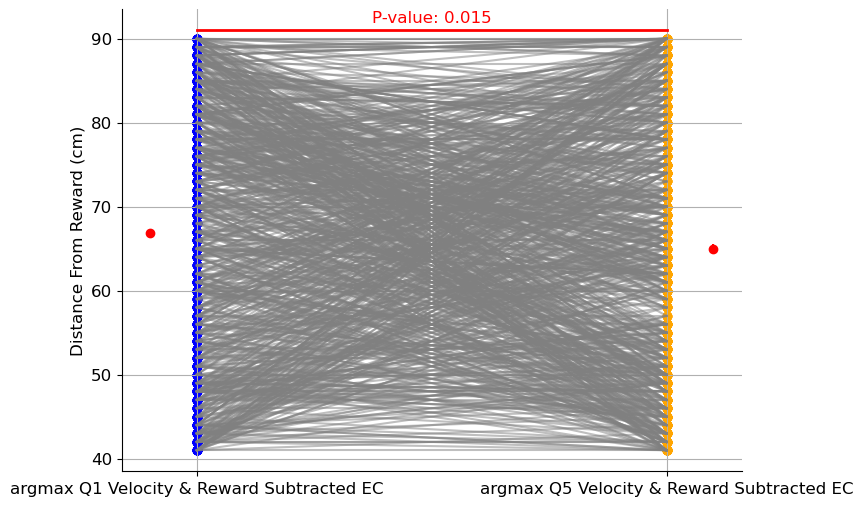

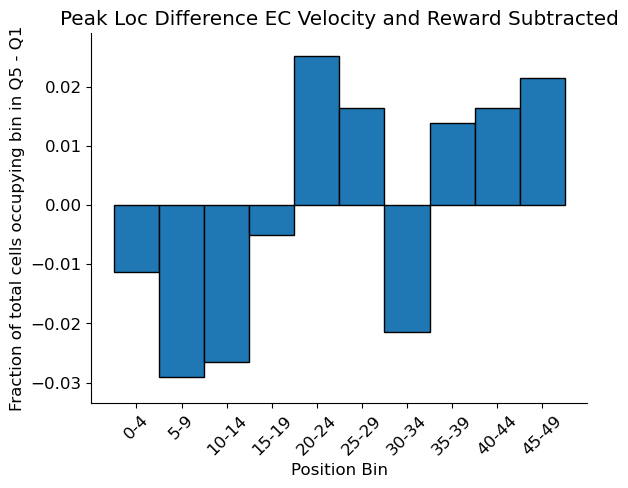

In [56]:
trial_argmax_list_EC_first_quintile_vr = []
trial_argmax_list_EC_last_quintile_vr = []

for animal, subdict in residual_activity_vr_EC.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vr_EC[animal][cell]
        EC_quintiles = split_into_quintiles(residual_data)
        first_quintile = EC_quintiles[0]
        last_quintile = EC_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_EC_first_quintile_vr.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_EC_last_quintile_vr.append(argmax_loc)
        
trial_argmax_list_EC_first_quintile_vr_distance = []
for i in trial_argmax_list_EC_first_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_EC_first_quintile_vr_distance.append(diff)
    
trial_argmax_list_EC_last_quintile_vr_distance = []
for i in trial_argmax_list_EC_last_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_EC_last_quintile_vr_distance.append(diff)
    
    
t_stat, p_value_raw_vr = ttest_rel(trial_argmax_list_EC_first_quintile_vr_distance, trial_argmax_list_EC_last_quintile_vr_distance)
        
mean_vr_last = np.mean(trial_argmax_list_EC_last_quintile_vr_distance)
mean_vr_first = np.mean(trial_argmax_list_EC_first_quintile_vr_distance)

sem_vr_last = np.std(trial_argmax_list_EC_last_quintile_vr_distance) / np.sqrt(len(trial_argmax_list_EC_last_quintile_vr_distance))
sem_vr_first = np.std(trial_argmax_list_EC_first_quintile_vr_distance) / np.sqrt(len(trial_argmax_list_EC_first_quintile_vr_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 Velocity & Reward Subtracted EC", "argmax Q5 Velocity & Reward Subtracted EC"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vr_first, yerr=sem_vr_first, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vr_last, yerr=sem_vr_last, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_EC_last_quintile_vr_distance)):
    plt.plot(x_positions, [trial_argmax_list_EC_first_quintile_vr_distance[i], trial_argmax_list_EC_last_quintile_vr_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_EC_first_quintile_vr_distance), trial_argmax_list_EC_first_quintile_vr_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_EC_last_quintile_vr_distance), trial_argmax_list_EC_last_quintile_vr_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_EC_first_quintile_vr_distance), max(trial_argmax_list_EC_last_quintile_vr_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vr:.3f}", ha='center', color='red')






bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_EC_first_quintile_vr, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_EC_last_quintile_vr, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_EC_vr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_EC_first_quintile_vr)
    peak_loc_difference_learning_list_EC_vr.append(value)

y_min = np.min(peak_loc_difference_learning_list_EC_vr)
y_max = np.max(peak_loc_difference_learning_list_EC_vr)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_EC_vr, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference EC Velocity and Reward Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)
plt.show()






plt.show()
        

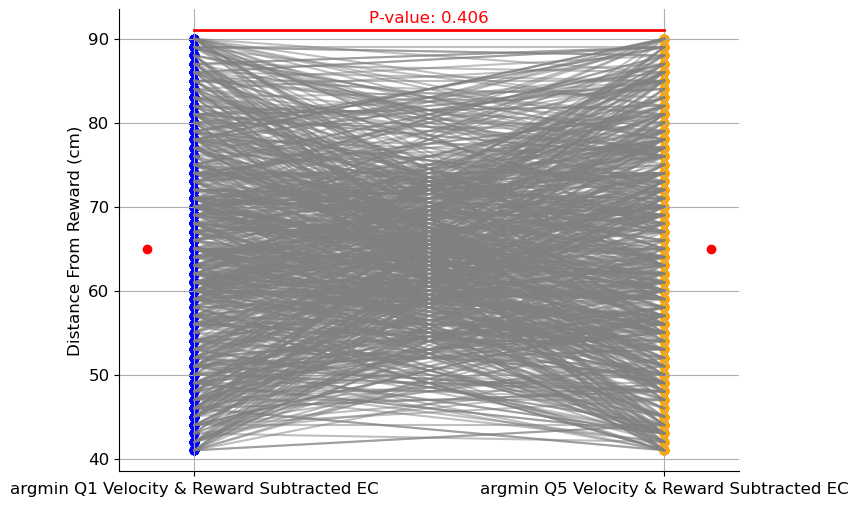

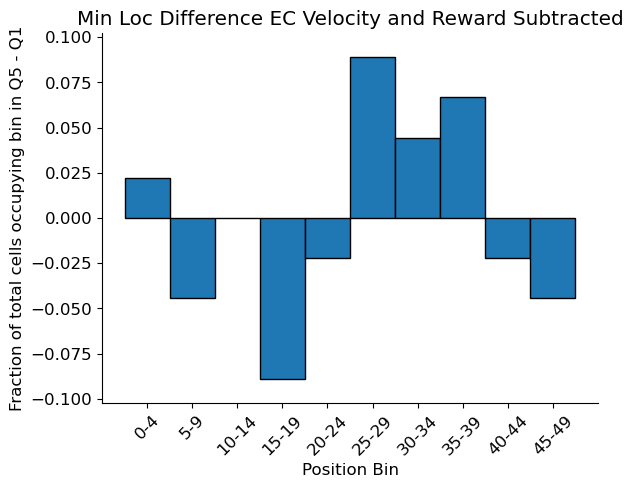

In [369]:
trial_argmin_list_EC_first_quintile_vr = []
trial_argmin_list_EC_last_quintile_vr = []

for animal, subdict in residual_activity_vr_EC.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vr_EC[animal][cell]
        EC_quintiles = split_into_quintiles(residual_data)
        first_quintile = EC_quintiles[0]
        last_quintile = EC_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_EC_first_quintile_vr.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_EC_last_quintile_vr.append(argmin_loc)
        
trial_argmin_list_EC_first_quintile_vr_distance = []
for i in trial_argmin_list_EC_first_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_EC_first_quintile_vr_distance.append(diff)
    
trial_argmin_list_EC_last_quintile_vr_distance = []
for i in trial_argmin_list_EC_last_quintile_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_EC_last_quintile_vr_distance.append(diff)
    
    
t_stat, p_value_raw_vr = ttest_rel(trial_argmin_list_EC_first_quintile_vr_distance, trial_argmin_list_EC_last_quintile_vr_distance)
        
mean_vr = np.mean(trial_argmin_list_EC_last_quintile_vr_distance)
mean_vr = np.mean(trial_argmin_list_EC_first_quintile_vr_distance)

sem_vr = np.std(trial_argmin_list_EC_last_quintile_vr_distance) / np.sqrt(len(trial_argmin_list_EC_last_quintile_vr_distance))
sem_vr = np.std(trial_argmin_list_EC_first_quintile_vr_distance) / np.sqrt(len(trial_argmin_list_EC_first_quintile_vr_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 Velocity & Reward Subtracted EC", "argmin Q5 Velocity & Reward Subtracted EC"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vr, yerr=sem_vr, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vr, yerr=sem_vr, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_EC_last_quintile_vr_distance)):
    plt.plot(x_positions, [trial_argmin_list_EC_first_quintile_vr_distance[i], trial_argmin_list_EC_last_quintile_vr_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_EC_first_quintile_vr_distance), trial_argmin_list_EC_first_quintile_vr_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_EC_last_quintile_vr_distance), trial_argmin_list_EC_last_quintile_vr_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_EC_first_quintile_vr_distance), max(trial_argmin_list_EC_last_quintile_vr_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vr:.3f}", ha='center', color='red')





bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_first_quintile_vr, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_last_quintile_vr, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_EC_vr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_NDNF_first_quintile_vr)
    min_loc_difference_learning_list_EC_vr.append(value)

y_min = np.min(min_loc_difference_learning_list_EC_vr)
y_max = np.max(min_loc_difference_learning_list_EC_vr)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_EC_vr, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference EC Velocity and Reward Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()


plt.show()
        

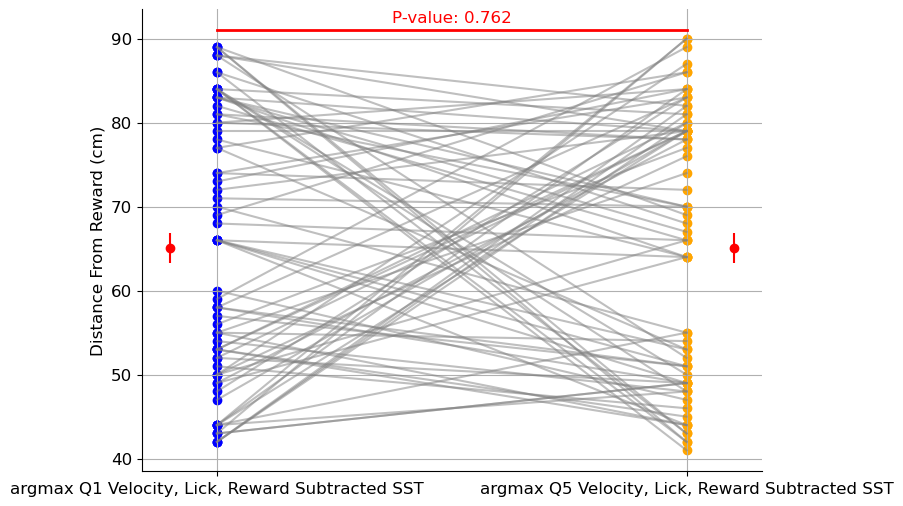

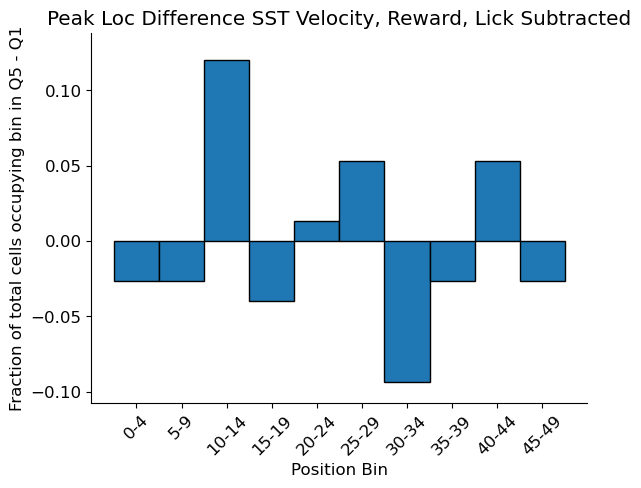

In [365]:
trial_argmax_list_SST_first_quintile_vrl = []
trial_argmax_list_SST_last_quintile_vrl = []

for animal, subdict in residual_activity_vrl_SST.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vrl_SST[animal][cell]
        sst_quintiles = split_into_quintiles(residual_data)
        first_quintile = sst_quintiles[0]
        last_quintile = sst_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_first_quintile_vrl.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_last_quintile_vrl.append(argmax_loc)
        
trial_argmax_list_SST_first_quintile_vrl_distance = []
for i in trial_argmax_list_SST_first_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_SST_first_quintile_vrl_distance.append(diff)
    
trial_argmax_list_SST_last_quintile_vrl_distance = []
for i in trial_argmax_list_SST_last_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_SST_last_quintile_vrl_distance.append(diff)
    
    
t_stat, p_value_raw_vrl = ttest_rel(trial_argmax_list_SST_first_quintile_vrl_distance, trial_argmax_list_SST_last_quintile_vrl_distance)
        
mean_vrl = np.mean(trial_argmax_list_SST_last_quintile_vrl_distance)
mean_vrl = np.mean(trial_argmax_list_SST_first_quintile_vrl_distance)

sem_vrl = np.std(trial_argmax_list_SST_last_quintile_vrl_distance) / np.sqrt(len(trial_argmax_list_SST_last_quintile_vrl_distance))
sem_vrl = np.std(trial_argmax_list_SST_first_quintile_vrl_distance) / np.sqrt(len(trial_argmax_list_SST_first_quintile_vrl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 Velocity, Lick, Reward Subtracted SST", "argmax Q5 Velocity, Lick, Reward Subtracted SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vrl, yerr=sem_vrl, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vrl, yerr=sem_vrl, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_SST_last_quintile_vrl_distance)):
    plt.plot(x_positions, [trial_argmax_list_SST_first_quintile_vrl_distance[i], trial_argmax_list_SST_last_quintile_vrl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_SST_first_quintile_vrl_distance), trial_argmax_list_SST_first_quintile_vrl_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_SST_last_quintile_vrl_distance), trial_argmax_list_SST_last_quintile_vrl_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_SST_first_quintile_vrl_distance), max(trial_argmax_list_SST_last_quintile_vrl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vrl:.3f}", ha='center', color='red')






bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_SST_first_quintile_vrl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_SST_last_quintile_vrl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_SST_vlr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_SST_first_quintile_vrl)
    peak_loc_difference_learning_list_SST_vlr.append(value)

y_min = np.min(peak_loc_difference_learning_list_SST_vlr)
y_max = np.max(peak_loc_difference_learning_list_SST_vlr)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_SST_vlr, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference SST Velocity, Reward, Lick Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()


plt.show()
        

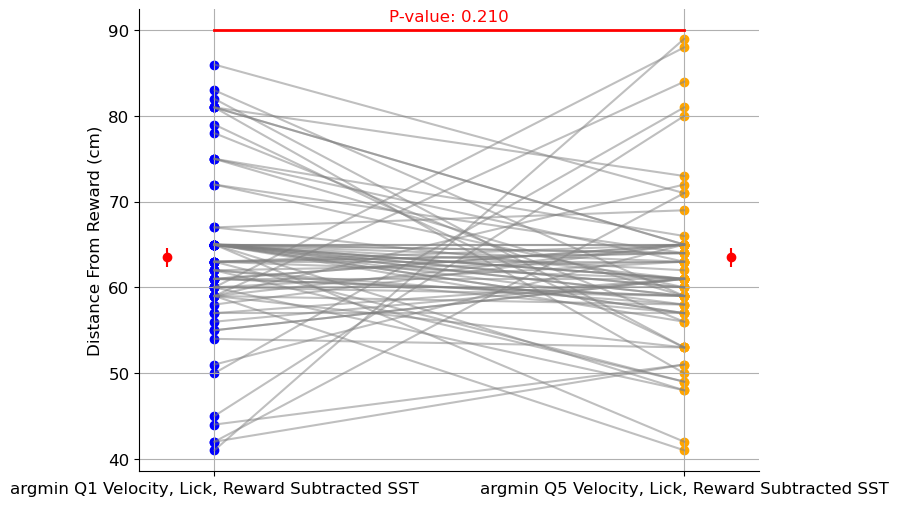

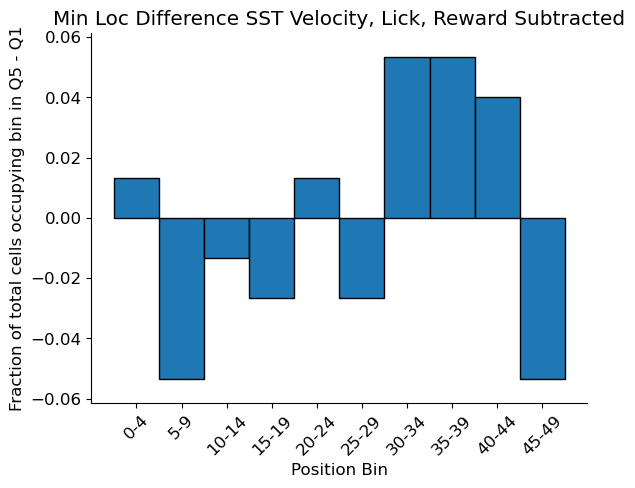

In [364]:
trial_argmin_list_SST_first_quintile_vrl = []
trial_argmin_list_SST_last_quintile_vrl = []

for animal, subdict in residual_activity_vrl_SST.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vrl_SST[animal][cell]
        sst_quintiles = split_into_quintiles(residual_data)
        first_quintile = sst_quintiles[0]
        last_quintile = sst_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_SST_first_quintile_vrl.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_SST_last_quintile_vrl.append(argmin_loc)
        
trial_argmin_list_SST_first_quintile_vrl_distance = []
for i in trial_argmin_list_SST_first_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_SST_first_quintile_vrl_distance.append(diff)
    
trial_argmin_list_SST_last_quintile_vrl_distance = []
for i in trial_argmin_list_SST_last_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_SST_last_quintile_vrl_distance.append(diff)
    
    
t_stat, p_value_raw_vrl = ttest_rel(trial_argmin_list_SST_first_quintile_vrl_distance, trial_argmin_list_SST_last_quintile_vrl_distance)
        
mean_vrl = np.mean(trial_argmin_list_SST_last_quintile_vrl_distance)
mean_vrl = np.mean(trial_argmin_list_SST_first_quintile_vrl_distance)

sem_vrl = np.std(trial_argmin_list_SST_last_quintile_vrl_distance) / np.sqrt(len(trial_argmin_list_SST_last_quintile_vrl_distance))
sem_vrl = np.std(trial_argmin_list_SST_first_quintile_vrl_distance) / np.sqrt(len(trial_argmin_list_SST_first_quintile_vrl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 Velocity, Lick, Reward Subtracted SST", "argmin Q5 Velocity, Lick, Reward Subtracted SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vrl, yerr=sem_vrl, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vrl, yerr=sem_vrl, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_SST_last_quintile_vrl_distance)):
    plt.plot(x_positions, [trial_argmin_list_SST_first_quintile_vrl_distance[i], trial_argmin_list_SST_last_quintile_vrl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_SST_first_quintile_vrl_distance), trial_argmin_list_SST_first_quintile_vrl_distance, color='blue', label="First Quintile Distance From Reward SST")
plt.scatter([x_positions[1]] * len(trial_argmin_list_SST_last_quintile_vrl_distance), trial_argmin_list_SST_last_quintile_vrl_distance, color='orange', label="Last Quintile Distance From Reward SST")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_SST_first_quintile_vrl_distance), max(trial_argmin_list_SST_last_quintile_vrl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vrl:.3f}", ha='center', color='red')







bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmin_list_SST_first_quintile_vr, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmin_list_SST_last_quintile_vr, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_SST_vlr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_SST_first_quintile_vr)
    min_loc_difference_learning_list_SST_vlr.append(value)

y_min = np.min(min_loc_difference_learning_list_SST_vlr)
y_max = np.max(min_loc_difference_learning_list_SST_vlr)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_SST_vlr, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference SST Velocity, Lick, Reward Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)
plt.show()




plt.show()
        

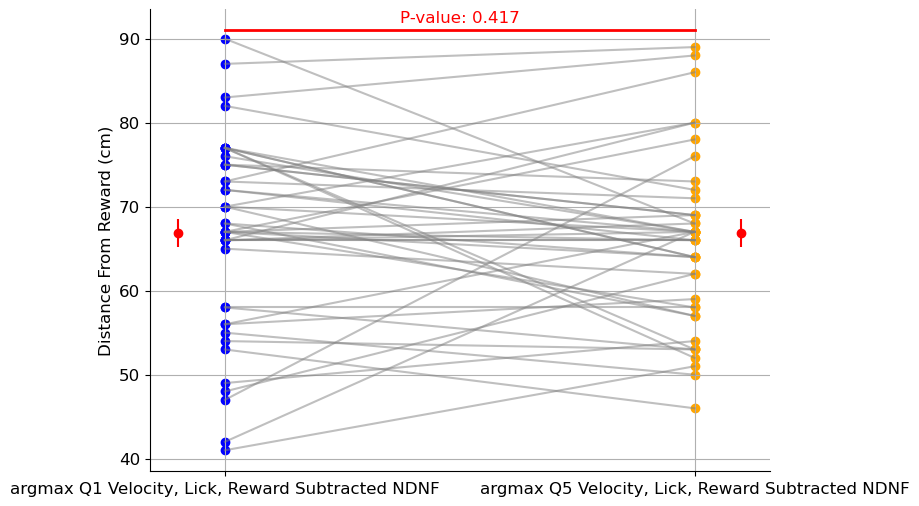

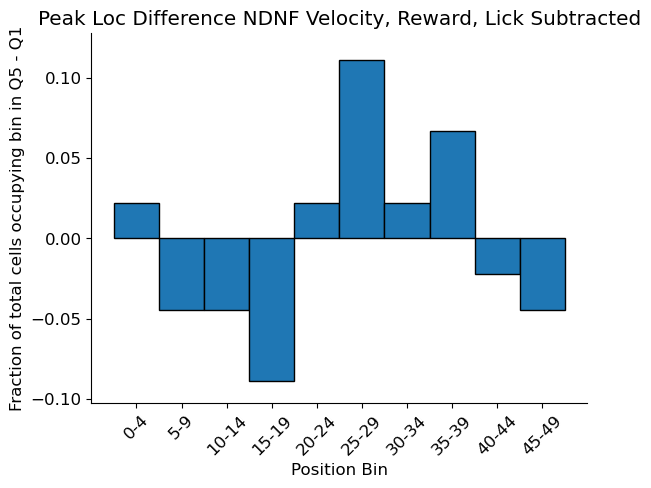

In [363]:
trial_argmax_list_NDNF_first_quintile_vrl = []
trial_argmax_list_NDNF_last_quintile_vrl = []

for animal, subdict in residual_activity_vrl_NDNF.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vrl_NDNF[animal][cell]
        NDNF_quintiles = split_into_quintiles(residual_data)
        first_quintile = NDNF_quintiles[0]
        last_quintile = NDNF_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_NDNF_first_quintile_vrl.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_NDNF_last_quintile_vrl.append(argmax_loc)
        
trial_argmax_list_NDNF_first_quintile_vrl_distance = []
for i in trial_argmax_list_NDNF_first_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_NDNF_first_quintile_vrl_distance.append(diff)
    
trial_argmax_list_NDNF_last_quintile_vrl_distance = []
for i in trial_argmax_list_NDNF_last_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_NDNF_last_quintile_vrl_distance.append(diff)
    
    
t_stat, p_value_raw_vrl = ttest_rel(trial_argmax_list_NDNF_first_quintile_vrl_distance, trial_argmax_list_NDNF_last_quintile_vrl_distance)
        
mean_vrl = np.mean(trial_argmax_list_NDNF_last_quintile_vrl_distance)
mean_vrl = np.mean(trial_argmax_list_NDNF_first_quintile_vrl_distance)

sem_vrl = np.std(trial_argmax_list_NDNF_last_quintile_vrl_distance) / np.sqrt(len(trial_argmax_list_NDNF_last_quintile_vrl_distance))
sem_vrl = np.std(trial_argmax_list_NDNF_first_quintile_vrl_distance) / np.sqrt(len(trial_argmax_list_NDNF_first_quintile_vrl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 Velocity, Lick, Reward Subtracted NDNF", "argmax Q5 Velocity, Lick, Reward Subtracted NDNF"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vrl, yerr=sem_vrl, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vrl, yerr=sem_vrl, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_NDNF_last_quintile_vrl_distance)):
    plt.plot(x_positions, [trial_argmax_list_NDNF_first_quintile_vrl_distance[i], trial_argmax_list_NDNF_last_quintile_vrl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_NDNF_first_quintile_vrl_distance), trial_argmax_list_NDNF_first_quintile_vrl_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_NDNF_last_quintile_vrl_distance), trial_argmax_list_NDNF_last_quintile_vrl_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_NDNF_first_quintile_vrl_distance), max(trial_argmax_list_NDNF_last_quintile_vrl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vrl:.3f}", ha='center', color='red')



bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_first_quintile_vrl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_last_quintile_vrl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_NDNF_vlr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_NDNF_first_quintile_vrl)
    peak_loc_difference_learning_list_NDNF_vlr.append(value)

y_min = np.min(peak_loc_difference_learning_list_NDNF_vlr)
y_max = np.max(peak_loc_difference_learning_list_NDNF_vlr)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_NDNF_vlr, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference NDNF Velocity, Reward, Lick Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()




plt.show()
        

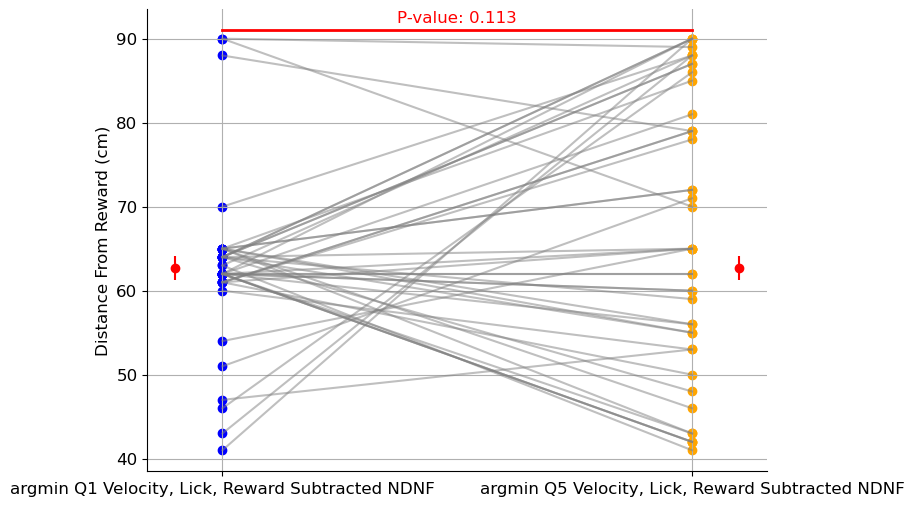

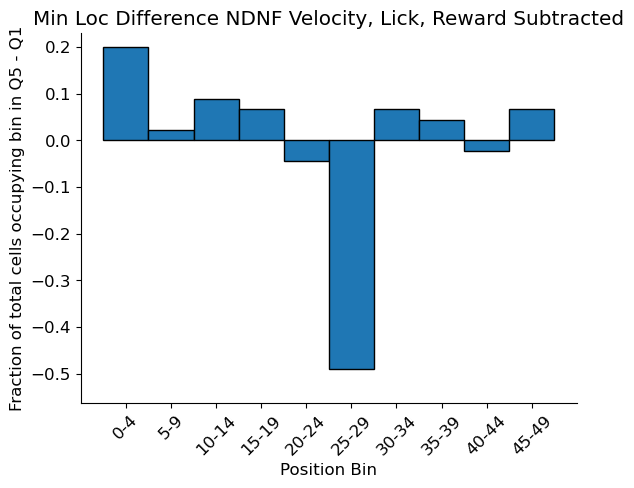

In [362]:
trial_argmin_list_NDNF_first_quintile_vrl = []
trial_argmin_list_NDNF_last_quintile_vrl = []

for animal, subdict in residual_activity_vrl_NDNF.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vrl_NDNF[animal][cell]
        NDNF_quintiles = split_into_quintiles(residual_data)
        first_quintile = NDNF_quintiles[0]
        last_quintile = NDNF_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_NDNF_first_quintile_vrl.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_NDNF_last_quintile_vrl.append(argmin_loc)
        
trial_argmin_list_NDNF_first_quintile_vrl_distance = []
for i in trial_argmin_list_NDNF_first_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_NDNF_first_quintile_vrl_distance.append(diff)
    
trial_argmin_list_NDNF_last_quintile_vrl_distance = []
for i in trial_argmin_list_NDNF_last_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_NDNF_last_quintile_vrl_distance.append(diff)
    
    
t_stat, p_value_raw_vrl = ttest_rel(trial_argmin_list_NDNF_first_quintile_vrl_distance, trial_argmin_list_NDNF_last_quintile_vrl_distance)
        
mean_vrl = np.mean(trial_argmin_list_NDNF_last_quintile_vrl_distance)
mean_vrl = np.mean(trial_argmin_list_NDNF_first_quintile_vrl_distance)

sem_vrl = np.std(trial_argmin_list_NDNF_last_quintile_vrl_distance) / np.sqrt(len(trial_argmin_list_NDNF_last_quintile_vrl_distance))
sem_vrl = np.std(trial_argmin_list_NDNF_first_quintile_vrl_distance) / np.sqrt(len(trial_argmin_list_NDNF_first_quintile_vrl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 Velocity, Lick, Reward Subtracted NDNF", "argmin Q5 Velocity, Lick, Reward Subtracted NDNF"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vrl, yerr=sem_vrl, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vrl, yerr=sem_vrl, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_NDNF_last_quintile_vrl_distance)):
    plt.plot(x_positions, [trial_argmin_list_NDNF_first_quintile_vrl_distance[i], trial_argmin_list_NDNF_last_quintile_vrl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_NDNF_first_quintile_vrl_distance), trial_argmin_list_NDNF_first_quintile_vrl_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_NDNF_last_quintile_vrl_distance), trial_argmin_list_NDNF_last_quintile_vrl_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_NDNF_first_quintile_vrl_distance), max(trial_argmin_list_NDNF_last_quintile_vrl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vrl:.3f}", ha='center', color='red')





bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmin_list_NDNF_first_quintile_vr, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmin_list_NDNF_last_quintile_vr, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_NDNF_vlr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_NDNF_first_quintile_vr)
    min_loc_difference_learning_list_NDNF_vlr.append(value)

y_min = np.min(min_loc_difference_learning_list_NDNF_vlr)
y_max = np.max(min_loc_difference_learning_list_NDNF_vlr)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_NDNF_vlr, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference NDNF Velocity, Lick, Reward Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)
plt.show()


plt.show()
        

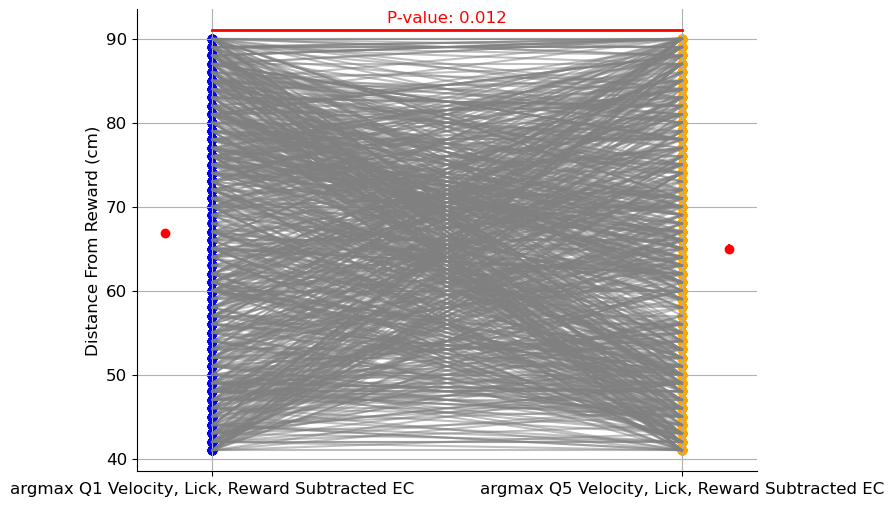

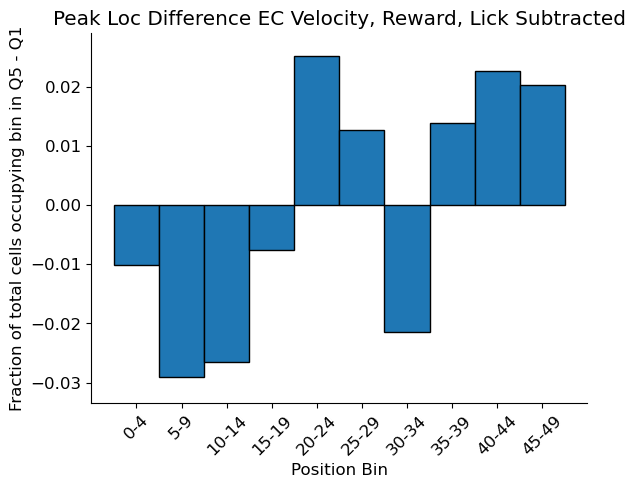

In [57]:
trial_argmax_list_EC_first_quintile_vrl = []
trial_argmax_list_EC_last_quintile_vrl = []

for animal, subdict in residual_activity_vrl_EC.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vrl_EC[animal][cell]
        EC_quintiles = split_into_quintiles(residual_data)
        first_quintile = EC_quintiles[0]
        last_quintile = EC_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_EC_first_quintile_vrl.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_EC_last_quintile_vrl.append(argmax_loc)
        
trial_argmax_list_EC_first_quintile_vrl_distance = []
for i in trial_argmax_list_EC_first_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_EC_first_quintile_vrl_distance.append(diff)
    
trial_argmax_list_EC_last_quintile_vrl_distance = []
for i in trial_argmax_list_EC_last_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_EC_last_quintile_vrl_distance.append(diff)
    
    
t_stat, p_value_raw_vrl = ttest_rel(trial_argmax_list_EC_first_quintile_vrl_distance, trial_argmax_list_EC_last_quintile_vrl_distance)
        
mean_vrl_last = np.mean(trial_argmax_list_EC_last_quintile_vrl_distance)
mean_vrl_first = np.mean(trial_argmax_list_EC_first_quintile_vrl_distance)

sem_vrl_last = np.std(trial_argmax_list_EC_last_quintile_vrl_distance) / np.sqrt(len(trial_argmax_list_EC_last_quintile_vrl_distance))
sem_vrl_first = np.std(trial_argmax_list_EC_first_quintile_vrl_distance) / np.sqrt(len(trial_argmax_list_EC_first_quintile_vrl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 Velocity, Lick, Reward Subtracted EC", "argmax Q5 Velocity, Lick, Reward Subtracted EC"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vrl_first, yerr=sem_vrl_first, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vrl_last, yerr=sem_vrl_last, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_EC_last_quintile_vrl_distance)):
    plt.plot(x_positions, [trial_argmax_list_EC_first_quintile_vrl_distance[i], trial_argmax_list_EC_last_quintile_vrl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_EC_first_quintile_vrl_distance), trial_argmax_list_EC_first_quintile_vrl_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_EC_last_quintile_vrl_distance), trial_argmax_list_EC_last_quintile_vrl_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_EC_first_quintile_vrl_distance), max(trial_argmax_list_EC_last_quintile_vrl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vrl:.3f}", ha='center', color='red')



bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_EC_first_quintile_vrl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_EC_last_quintile_vrl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_EC_vlr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_EC_first_quintile_vrl)
    peak_loc_difference_learning_list_EC_vlr.append(value)

y_min = np.min(peak_loc_difference_learning_list_EC_vlr)
y_max = np.max(peak_loc_difference_learning_list_EC_vlr)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_EC_vlr, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference EC Velocity, Reward, Lick Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()




plt.show()
        

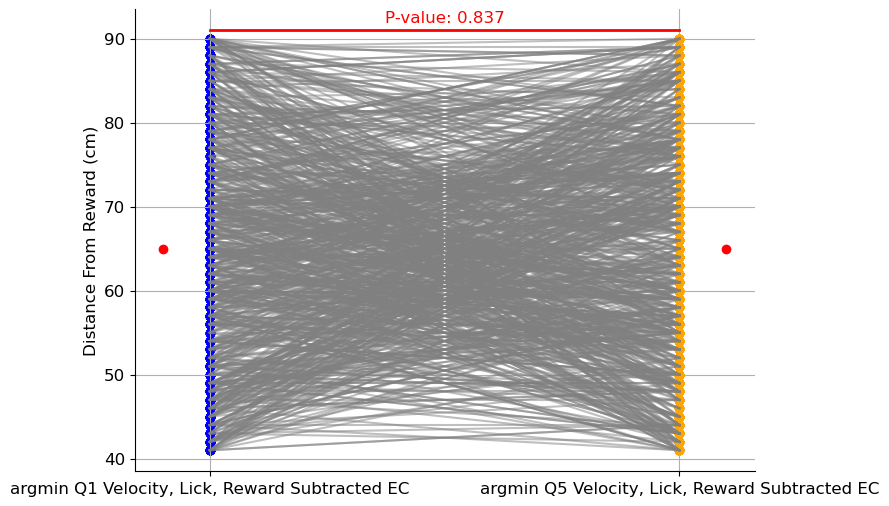

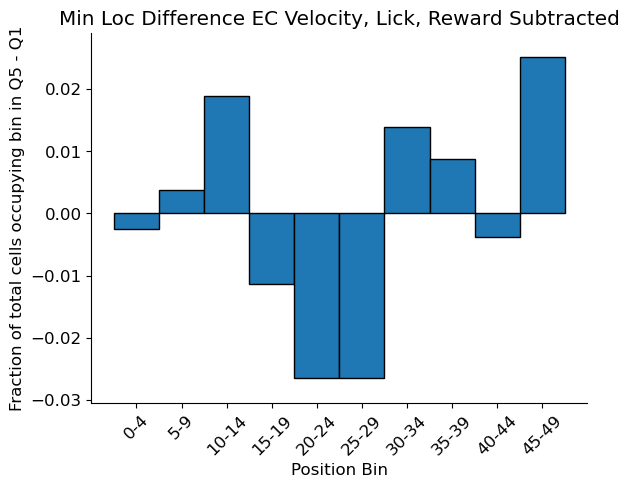

In [360]:
trial_argmin_list_EC_first_quintile_vrl = []
trial_argmin_list_EC_last_quintile_vrl = []

for animal, subdict in residual_activity_vrl_EC.items():
    for cell, value in subdict.items():
        
        residual_data = residual_activity_vrl_EC[animal][cell]
        EC_quintiles = split_into_quintiles(residual_data)
        first_quintile = EC_quintiles[0]
        last_quintile = EC_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_EC_first_quintile_vrl.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_EC_last_quintile_vrl.append(argmin_loc)
        
trial_argmin_list_EC_first_quintile_vrl_distance = []
for i in trial_argmin_list_EC_first_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_EC_first_quintile_vrl_distance.append(diff)
    
trial_argmin_list_EC_last_quintile_vrl_distance = []
for i in trial_argmin_list_EC_last_quintile_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_EC_last_quintile_vrl_distance.append(diff)
    
    
t_stat, p_value_raw_vrl = ttest_rel(trial_argmin_list_EC_first_quintile_vrl_distance, trial_argmin_list_EC_last_quintile_vrl_distance)
        
mean_vrl = np.mean(trial_argmin_list_EC_last_quintile_vrl_distance)
mean_vrl = np.mean(trial_argmin_list_EC_first_quintile_vrl_distance)

sem_vrl = np.std(trial_argmin_list_EC_last_quintile_vrl_distance) / np.sqrt(len(trial_argmin_list_EC_last_quintile_vrl_distance))
sem_vrl = np.std(trial_argmin_list_EC_first_quintile_vrl_distance) / np.sqrt(len(trial_argmin_list_EC_first_quintile_vrl_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 Velocity, Lick, Reward Subtracted EC", "argmin Q5 Velocity, Lick, Reward Subtracted EC"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_vrl, yerr=sem_vrl, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vrl, yerr=sem_vrl, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_EC_last_quintile_vrl_distance)):
    plt.plot(x_positions, [trial_argmin_list_EC_first_quintile_vrl_distance[i], trial_argmin_list_EC_last_quintile_vrl_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_EC_first_quintile_vrl_distance), trial_argmin_list_EC_first_quintile_vrl_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_EC_last_quintile_vrl_distance), trial_argmin_list_EC_last_quintile_vrl_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_EC_first_quintile_vrl_distance), max(trial_argmin_list_EC_last_quintile_vrl_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_vrl:.3f}", ha='center', color='red')





bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmin_list_EC_first_quintile_vr, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmin_list_EC_last_quintile_vr, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_EC_vlr = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_EC_first_quintile_vr)
    min_loc_difference_learning_list_EC_vlr.append(value)

y_min = np.min(min_loc_difference_learning_list_EC_vlr)
y_max = np.max(min_loc_difference_learning_list_EC_vlr)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_EC_vlr, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference EC Velocity, Lick, Reward Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)
plt.show()


plt.show()

<BarContainer object of 10 artists>

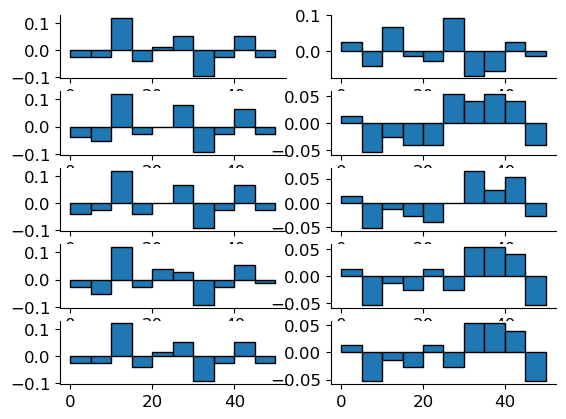

In [402]:
fig, axs = plt.subplots(5,2)


# axs[4,1].bar(bin_centers, peak_loc_difference_learning_list, width=5, align='center', edgecolor='k')
# axs[4,1].title('Min Loc Difference EC Velocity, Lick, Reward Subtracted')
# axs[4,1].ylabel('Fraction of total cells occupying bin in Q5 - Q1')
# axs[4,1].xlabel('Position Bin')
# axs[4,1].ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
# axs[4,1].xticks(bin_centers, bin_labels, rotation=45)
# axs[4,1].show()


axs[0, 0].bar(bin_centers, peak_loc_difference_learning_list_SST_raw, width=5, align='center', edgecolor='k')
axs[0, 1].bar(bin_centers, min_loc_difference_learning_list_SST_raw, width=5, align='center', edgecolor='k')

axs[1, 0].bar(bin_centers, peak_loc_difference_learning_list_SST_velocity, width=5, align='center', edgecolor='k')
axs[1, 1].bar(bin_centers, min_loc_difference_learning_list_SST_velocity, width=5, align='center', edgecolor='k')

axs[2, 0].bar(bin_centers, peak_loc_difference_learning_list_SST_vl, width=5, align='center', edgecolor='k')
axs[2, 1].bar(bin_centers, min_loc_difference_learning_list_SST_vl, width=5, align='center', edgecolor='k')

axs[3, 0].bar(bin_centers, peak_loc_difference_learning_list_SST_vr, width=5, align='center', edgecolor='k')
axs[3, 1].bar(bin_centers, min_loc_difference_learning_list_SST_vr, width=5, align='center', edgecolor='k')

axs[4, 0].bar(bin_centers, peak_loc_difference_learning_list_SST_vlr, width=5, align='center', edgecolor='k')
axs[4, 1].bar(bin_centers, min_loc_difference_learning_list_SST_vlr, width=5, align='center', edgecolor='k')




NameError: name 'peak_loc_difference_learning_list_SST_raw' is not defined

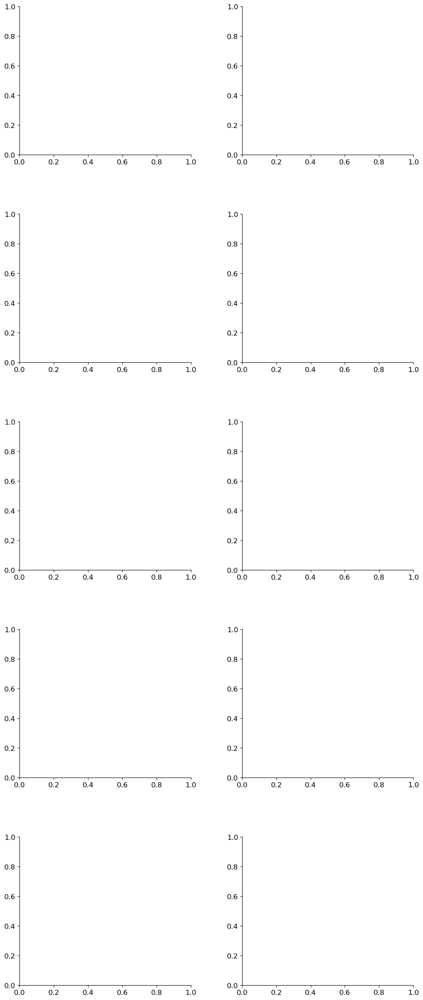

In [60]:
fig, axs = plt.subplots(5, 2, figsize=(12,30))

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# Unified bin settings for clarity
y_max = 0.15
x_min, x_max = 0, 45

# Plotting each subplot
titles = [
    "Min Loc Difference SST (Raw)", "Peak Loc Difference SST (Raw)",
    "Min Loc Difference SST (Velocity)", "Peak Loc Difference SST (Velocity)",
    "Min Loc Difference SST (Velocity + Lick)", "Peak Loc Difference SST (Velocity + Lick)",
    "Min Loc Difference SST (Velocity + Reward)", "Peak Loc Difference SST (Velocity + Reward)",
    "Min Loc Difference SST (VLR)", "Peak Loc Difference SST (VLR)"
]

datasets = [
    peak_loc_difference_learning_list_SST_raw, min_loc_difference_learning_list_SST_raw,
    peak_loc_difference_learning_list_SST_velocity, min_loc_difference_learning_list_SST_velocity,
    peak_loc_difference_learning_list_SST_vl, min_loc_difference_learning_list_SST_vl,
    peak_loc_difference_learning_list_SST_vr, min_loc_difference_learning_list_SST_vr,
    peak_loc_difference_learning_list_SST_vlr, min_loc_difference_learning_list_SST_vlr
]

for ax, title, data in zip(axs.flat, titles, datasets):
    ax.bar(bin_centers, data, width=5, align='center', edgecolor='k', color='blue', alpha=0.7)
    ax.set_title(title, fontsize=12)
    ax.set_ylim(-y_max, y_max)
    ax.set_xlim(x_min, x_max)
    ax.set_xlabel("Position Bin", fontsize=10)
    ax.set_ylabel("Fraction of Total Cells", fontsize=10)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Set a global title for the figure
fig.suptitle("Learning-Related Location Differences (SST)", fontsize=16)

# Show the final plot
plt.show()


In [59]:
import matplotlib.pyplot as plt

# Define parameters
bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5

# Data and titles
datasets = [
    min_loc_difference_learning_list_SST_raw, peak_loc_difference_learning_list_SST_raw,
    min_loc_difference_learning_list_SST_velocity, peak_loc_difference_learning_list_SST_velocity,
    min_loc_difference_learning_list_SST_vl, peak_loc_difference_learning_list_SST_vl,
    min_loc_difference_learning_list_SST_vr, peak_loc_difference_learning_list_SST_vr,
    min_loc_difference_learning_list_SST_vlr, peak_loc_difference_learning_list_SST_vlr
]

titles = [
    "Min Loc Difference SST (Raw)", "Peak Loc Difference SST (Raw)",
    "Min Loc Difference SST (Velocity)", "Peak Loc Difference SST (Velocity)",
    "Min Loc Difference SST (Velocity + Lick)", "Peak Loc Difference SST (Velocity + Lick)",
    "Min Loc Difference SST (Velocity + Reward)", "Peak Loc Difference SST (Velocity + Reward)",
    "Min Loc Difference SST (VLR)", "Peak Loc Difference SST (VLR)"
]

# Create subplots
fig, axs = plt.subplots(5, 2, figsize=(12, 30))

# Adjust spacing
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# Plot each dataset
for ax, data, title in zip(axs.flat, datasets, titles):
    ax.bar(bin_centers, data, width=5, align='center', edgecolor='k', color='blue', alpha=0.7)
    ax.set_title(title, fontsize=12)
    ax.set_xlabel("Position Bin", fontsize=10)
    ax.set_ylabel("Fraction of Total Cells", fontsize=10)
    ax.set_ylim(-0.15, 0.15)
    ax.set_xlim(0, 45)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Global title
fig.suptitle("Learning-Related Location Differences (SST)", fontsize=18)

# Show plot
plt.show()


NameError: name 'min_loc_difference_learning_list_SST_raw' is not defined

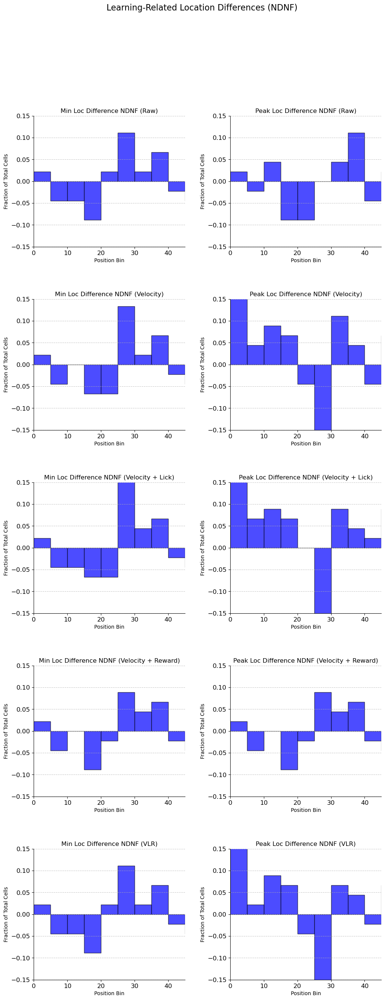

In [407]:
fig, axs = plt.subplots(5, 2, figsize=(12,30))

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# Unified bin settings for clarity
y_max = 0.15
x_min, x_max = 0, 45

# Plotting each subplot
titles = [
    "Min Loc Difference NDNF (Raw)", "Peak Loc Difference NDNF (Raw)",
    "Min Loc Difference NDNF (Velocity)", "Peak Loc Difference NDNF (Velocity)",
    "Min Loc Difference NDNF (Velocity + Lick)", "Peak Loc Difference NDNF (Velocity + Lick)",
    "Min Loc Difference NDNF (Velocity + Reward)", "Peak Loc Difference NDNF (Velocity + Reward)",
    "Min Loc Difference NDNF (VLR)", "Peak Loc Difference NDNF (VLR)"
]

datasets = [
    peak_loc_difference_learning_list_NDNF_raw, min_loc_difference_learning_list_NDNF_raw,
    peak_loc_difference_learning_list_NDNF_velocity, min_loc_difference_learning_list_NDNF_velocity,
    peak_loc_difference_learning_list_NDNF_vl, min_loc_difference_learning_list_NDNF_vl,
    peak_loc_difference_learning_list_NDNF_vr, min_loc_difference_learning_list_NDNF_vr,
    peak_loc_difference_learning_list_NDNF_vlr, min_loc_difference_learning_list_NDNF_vlr
]

for ax, title, data in zip(axs.flat, titles, datasets):
    ax.bar(bin_centers, data, width=5, align='center', edgecolor='k', color='blue', alpha=0.7)
    ax.set_title(title, fontsize=12)
    ax.set_ylim(-y_max, y_max)
    ax.set_xlim(x_min, x_max)
    ax.set_xlabel("Position Bin", fontsize=10)
    ax.set_ylabel("Fraction of Total Cells", fontsize=10)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Set a global title for the figure
fig.suptitle("Learning-Related Location Differences (NDNF)", fontsize=16)

# Show the final plot
plt.show()


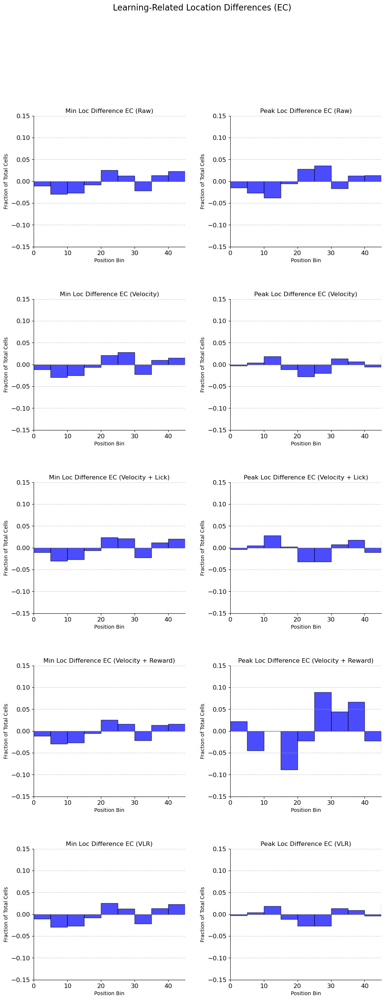

In [408]:
fig, axs = plt.subplots(5, 2, figsize=(12,30))

# Adjust spacing between subplots
plt.subplots_adjust(hspace=0.4, wspace=0.3)

# Unified bin settings for clarity
y_max = 0.15
x_min, x_max = 0, 45

# Plotting each subplot
titles = [
    "Min Loc Difference EC (Raw)", "Peak Loc Difference EC (Raw)",
    "Min Loc Difference EC (Velocity)", "Peak Loc Difference EC (Velocity)",
    "Min Loc Difference EC (Velocity + Lick)", "Peak Loc Difference EC (Velocity + Lick)",
    "Min Loc Difference EC (Velocity + Reward)", "Peak Loc Difference EC (Velocity + Reward)",
    "Min Loc Difference EC (VLR)", "Peak Loc Difference EC (VLR)"
]

datasets = [
    peak_loc_difference_learning_list_EC_raw, min_loc_difference_learning_list_EC_raw,
    peak_loc_difference_learning_list_EC_velocity, min_loc_difference_learning_list_EC_velocity,
    peak_loc_difference_learning_list_EC_vl, min_loc_difference_learning_list_EC_vl,
    peak_loc_difference_learning_list_EC_vr, min_loc_difference_learning_list_EC_vr,
    peak_loc_difference_learning_list_EC_vlr, min_loc_difference_learning_list_EC_vlr
]

for ax, title, data in zip(axs.flat, titles, datasets):
    ax.bar(bin_centers, data, width=5, align='center', edgecolor='k', color='blue', alpha=0.7)
    ax.set_title(title, fontsize=12)
    ax.set_ylim(-y_max, y_max)
    ax.set_xlim(x_min, x_max)
    ax.set_xlabel("Position Bin", fontsize=10)
    ax.set_ylabel("Fraction of Total Cells", fontsize=10)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

# Set a global title for the figure
fig.suptitle("Learning-Related Location Differences (EC)", fontsize=16)

# Show the final plot
plt.show()


In [ ]:
fig, axs = plt.subplots(2,5)

peak_loc_difference_learning_list_NDNF_raw
min_loc_difference_learning_list_NDNF_raw

peak_loc_difference_learning_list_NDNF_velocity
min_loc_difference_learning_list_NDNF_velocity

peak_loc_difference_learning_list_NDNF_vl
min_loc_difference_learning_list_NDNF_vl

peak_loc_difference_learning_list_NDNF_vr
min_loc_difference_learning_list_NDNF_vr

peak_loc_difference_learning_list_NDNF_vlr
min_loc_difference_learning_list_NDNF_vlr

In [390]:
fig, axs = plt.subplots(2,5)

peak_loc_difference_learning_list_EC_raw
min_loc_difference_learning_list_EC_raw

peak_loc_difference_learning_list_EC_velocity
min_loc_difference_learning_list_EC_velocity

peak_loc_difference_learning_list_EC_vl
min_loc_difference_learning_list_EC_vl

peak_loc_difference_learning_list_EC_vr
min_loc_difference_learning_list_EC_vr

peak_loc_difference_learning_list_EC_vlr
min_loc_difference_learning_list_EC_vlr

NameError: name 'peak_loc_difference_learning_list_EC_raw' is not defined

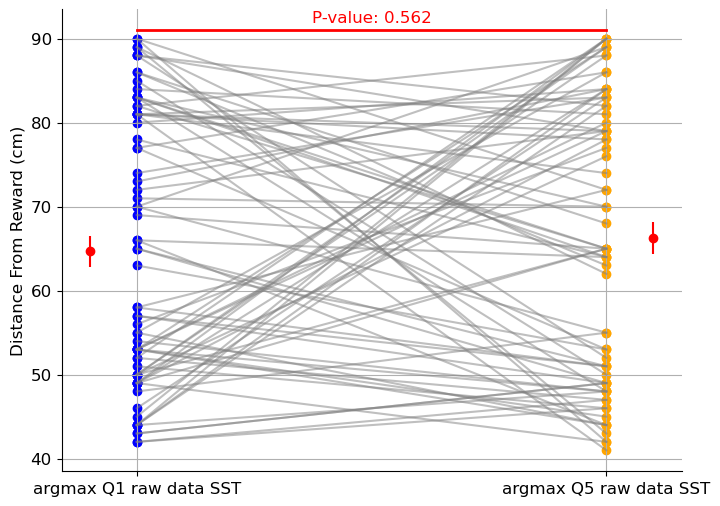

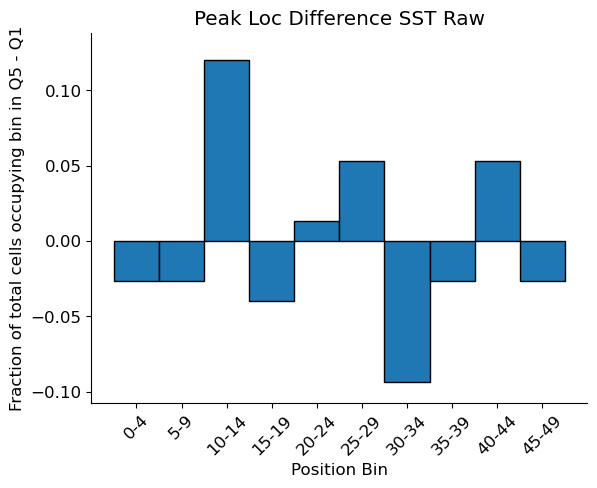

In [393]:

datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename = "SSTindivsomata_GLM"
filepath = os.path.join(datasets_dir, filename+".mat")
reorganized_data, variable_list = preprocess_data(filepath, normalize=True)

trial_argmax_list_SST_first_quintile_raw = []
trial_argmax_list_SST_last_quintile_raw = []


for animal, subdict in reorganized_data.items():
    for cell, value in subdict.items():
        neuron_data = reorganized_data[animal][cell]
#         print(f"neuron_data.shape {neuron_data.shape}")
        neuron_activity = neuron_data[:, 0, :]
        sst_quintiles = split_into_quintiles(neuron_activity)
        first_quintile = sst_quintiles[0]
        last_quintile = sst_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_first_quintile_raw.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_SST_last_quintile_raw.append(argmax_loc)
        
trial_argmax_list_SST_first_quintile_raw_distance = []
for i in trial_argmax_list_SST_first_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_SST_first_quintile_raw_distance.append(diff)
    
trial_argmax_list_SST_last_quintile_raw_distance = []
for i in trial_argmax_list_SST_last_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_SST_last_quintile_raw_distance.append(diff)
    
    
t_stat, p_value_raw_raw = ttest_rel(trial_argmax_list_SST_first_quintile_raw_distance, trial_argmax_list_SST_last_quintile_raw_distance)
        
mean_vl = np.mean(trial_argmax_list_SST_last_quintile_raw_distance)
mean_raw = np.mean(trial_argmax_list_SST_first_quintile_raw_distance)

sem_vl = np.std(trial_argmax_list_SST_last_quintile_raw_distance) / np.sqrt(len(trial_argmax_list_SST_last_quintile_raw_distance))
sem_raw = np.std(trial_argmax_list_SST_first_quintile_raw_distance) / np.sqrt(len(trial_argmax_list_SST_first_quintile_raw_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 raw data SST", "argmax Q5 raw data SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_SST_last_quintile_raw_distance)):
    plt.plot(x_positions, [trial_argmax_list_SST_first_quintile_raw_distance[i], trial_argmax_list_SST_last_quintile_raw_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_SST_first_quintile_raw_distance), trial_argmax_list_SST_first_quintile_raw_distance, color='blue', label="First Quintile Distance From Reward SST")
plt.scatter([x_positions[1]] * len(trial_argmax_list_SST_last_quintile_raw_distance), trial_argmax_list_SST_last_quintile_raw_distance, color='orange', label="Last Quintile Distance From Reward SST")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_SST_first_quintile_raw_distance), max(trial_argmax_list_SST_last_quintile_raw_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_raw:.3f}", ha='center', color='red')



bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_SST_first_quintile_vrl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_SST_last_quintile_vrl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_SST_raw = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_SST_first_quintile_vrl)
    peak_loc_difference_learning_list_SST_raw.append(value)

y_min = np.min(peak_loc_difference_learning_list_SST_raw)
y_max = np.max(peak_loc_difference_learning_list_SST_raw)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_SST_raw, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference SST Raw')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()



plt.show()
        

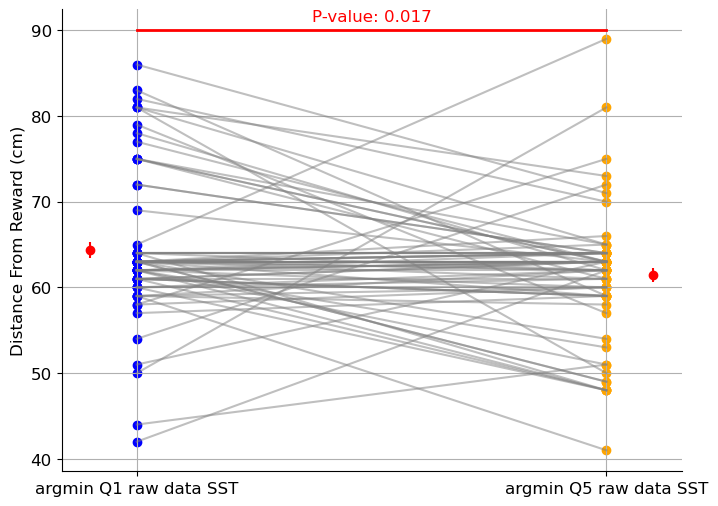

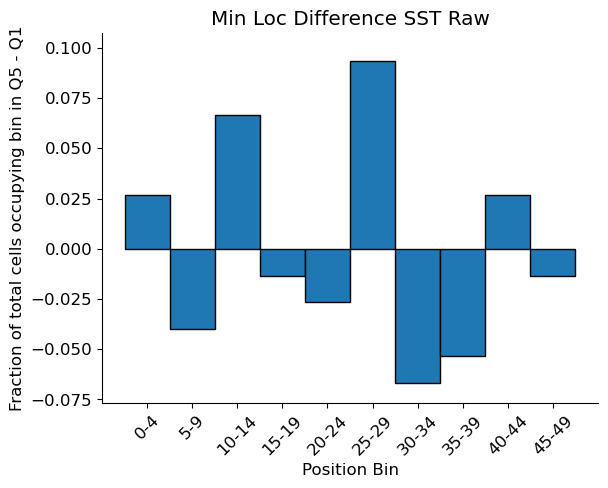

In [394]:

datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename = "SSTindivsomata_GLM"
filepath = os.path.join(datasets_dir, filename+".mat")
reorganized_data, variable_list = preprocess_data(filepath, normalize=True)

trial_argmin_list_SST_first_quintile_raw = []
trial_argmin_list_SST_last_quintile_raw = []


for animal, subdict in reorganized_data.items():
    for cell, value in subdict.items():
        neuron_data = reorganized_data[animal][cell]
#         print(f"neuron_data.shape {neuron_data.shape}")
        neuron_activity = neuron_data[:, 0, :]
        sst_quintiles = split_into_quintiles(neuron_activity)
        first_quintile = sst_quintiles[0]
        last_quintile = sst_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_SST_first_quintile_raw.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_SST_last_quintile_raw.append(argmin_loc)
        
trial_argmin_list_SST_first_quintile_raw_distance = []
for i in trial_argmin_list_SST_first_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_SST_first_quintile_raw_distance.append(diff)
    
trial_argmin_list_SST_last_quintile_raw_distance = []
for i in trial_argmin_list_SST_last_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_SST_last_quintile_raw_distance.append(diff)
    
    
t_stat, p_value_raw_raw = ttest_rel(trial_argmin_list_SST_first_quintile_raw_distance, trial_argmin_list_SST_last_quintile_raw_distance)
        
mean_vl = np.mean(trial_argmin_list_SST_last_quintile_raw_distance)
mean_raw = np.mean(trial_argmin_list_SST_first_quintile_raw_distance)

sem_vl = np.std(trial_argmin_list_SST_last_quintile_raw_distance) / np.sqrt(len(trial_argmin_list_SST_last_quintile_raw_distance))
sem_raw = np.std(trial_argmin_list_SST_first_quintile_raw_distance) / np.sqrt(len(trial_argmin_list_SST_first_quintile_raw_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 raw data SST", "argmin Q5 raw data SST"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_SST_last_quintile_raw_distance)):
    plt.plot(x_positions, [trial_argmin_list_SST_first_quintile_raw_distance[i], trial_argmin_list_SST_last_quintile_raw_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_SST_first_quintile_raw_distance), trial_argmin_list_SST_first_quintile_raw_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_SST_last_quintile_raw_distance), trial_argmin_list_SST_last_quintile_raw_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_SST_first_quintile_raw_distance), max(trial_argmin_list_SST_last_quintile_raw_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_raw:.3f}", ha='center', color='red')





bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_SST_first_quintile_raw, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_SST_last_quintile_raw, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_SST_raw = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_SST_first_quintile_vrl)
    min_loc_difference_learning_list_SST_raw.append(value)

y_min = np.min(min_loc_difference_learning_list_SST_raw)
y_max = np.max(min_loc_difference_learning_list_SST_raw)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_SST_raw, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference SST Raw')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()




plt.show()
        

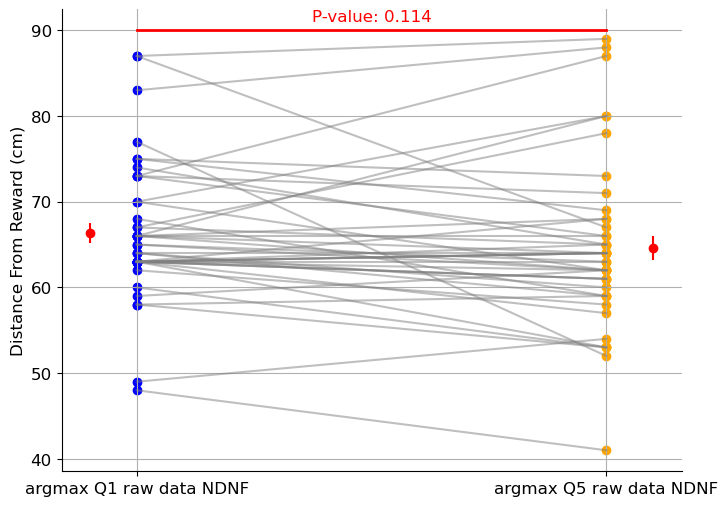

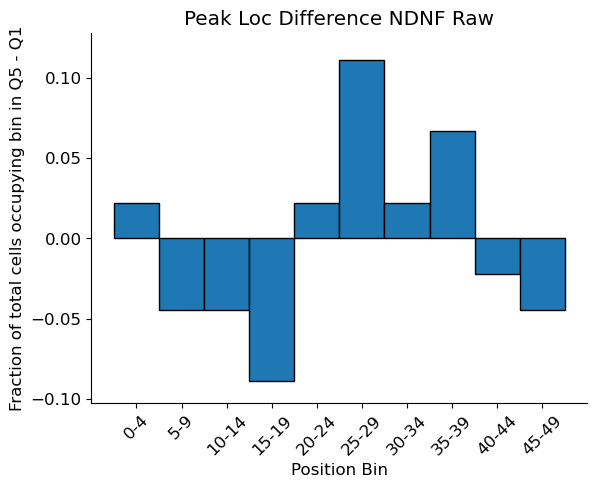

In [395]:
datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename = "NDNFindivsomata_GLM"
filepath = os.path.join(datasets_dir, filename+".mat")
reorganized_data, variable_list = preprocess_data(filepath, normalize=True)


trial_argmax_list_NDNF_first_quintile_raw = []
trial_argmax_list_NDNF_last_quintile_raw = []


for animal, subdict in reorganized_data.items():
    for cell, value in subdict.items():
        neuron_data = reorganized_data[animal][cell]
#         print(f"neuron_data.shape {neuron_data.shape}")
        neuron_activity = neuron_data[:, 0, :]
        NDNF_quintiles = split_into_quintiles(neuron_activity)
        first_quintile = NDNF_quintiles[0]
        last_quintile = NDNF_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_NDNF_first_quintile_raw.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_NDNF_last_quintile_raw.append(argmax_loc)
        
trial_argmax_list_NDNF_first_quintile_raw_distance = []
for i in trial_argmax_list_NDNF_first_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_NDNF_first_quintile_raw_distance.append(diff)
    
trial_argmax_list_NDNF_last_quintile_raw_distance = []
for i in trial_argmax_list_NDNF_last_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_NDNF_last_quintile_raw_distance.append(diff)
    
    
t_stat, p_value_raw_raw = ttest_rel(trial_argmax_list_NDNF_first_quintile_raw_distance, trial_argmax_list_NDNF_last_quintile_raw_distance)
        
mean_vl = np.mean(trial_argmax_list_NDNF_last_quintile_raw_distance)
mean_raw = np.mean(trial_argmax_list_NDNF_first_quintile_raw_distance)

sem_vl = np.std(trial_argmax_list_NDNF_last_quintile_raw_distance) / np.sqrt(len(trial_argmax_list_NDNF_last_quintile_raw_distance))
sem_raw = np.std(trial_argmax_list_NDNF_first_quintile_raw_distance) / np.sqrt(len(trial_argmax_list_NDNF_first_quintile_raw_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 raw data NDNF", "argmax Q5 raw data NDNF"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_NDNF_last_quintile_raw_distance)):
    plt.plot(x_positions, [trial_argmax_list_NDNF_first_quintile_raw_distance[i], trial_argmax_list_NDNF_last_quintile_raw_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_NDNF_first_quintile_raw_distance), trial_argmax_list_NDNF_first_quintile_raw_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_NDNF_last_quintile_raw_distance), trial_argmax_list_NDNF_last_quintile_raw_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_NDNF_first_quintile_raw_distance), max(trial_argmax_list_NDNF_last_quintile_raw_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_raw:.3f}", ha='center', color='red')




bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_first_quintile_vrl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_last_quintile_vrl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_NDNF_raw = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_NDNF_first_quintile_vrl)
    peak_loc_difference_learning_list_NDNF_raw.append(value)

y_min = np.min(peak_loc_difference_learning_list_NDNF_raw)
y_max = np.max(peak_loc_difference_learning_list_NDNF_raw)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_NDNF_raw, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference NDNF Raw')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()



plt.show()
        

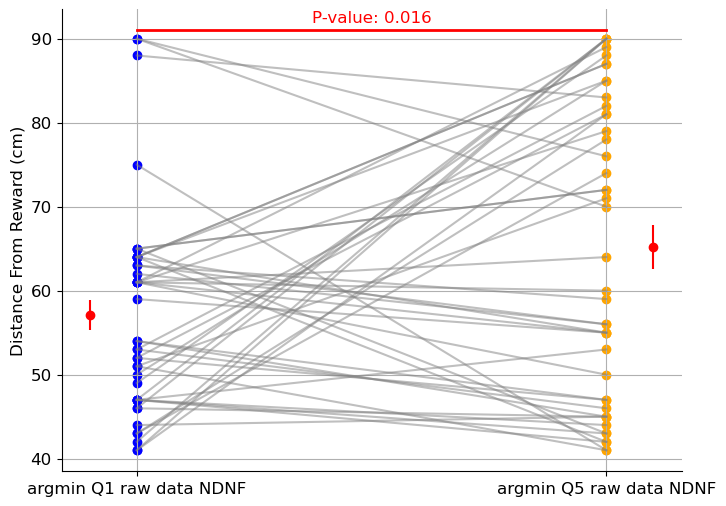

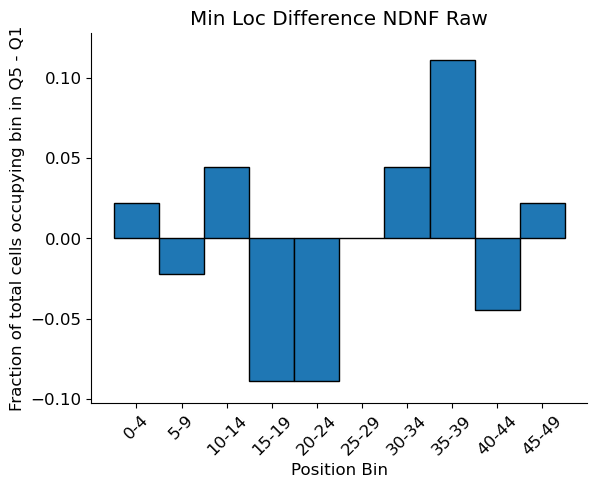

In [396]:
datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename = "NDNFindivsomata_GLM"
filepath = os.path.join(datasets_dir, filename+".mat")
reorganized_data, variable_list = preprocess_data(filepath, normalize=True)


trial_argmin_list_NDNF_first_quintile_raw = []
trial_argmin_list_NDNF_last_quintile_raw = []


for animal, subdict in reorganized_data.items():
    for cell, value in subdict.items():
        neuron_data = reorganized_data[animal][cell]
#         print(f"neuron_data.shape {neuron_data.shape}")
        neuron_activity = neuron_data[:, 0, :]
        NDNF_quintiles = split_into_quintiles(neuron_activity)
        first_quintile = NDNF_quintiles[0]
        last_quintile = NDNF_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_NDNF_first_quintile_raw.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_NDNF_last_quintile_raw.append(argmin_loc)
        
trial_argmin_list_NDNF_first_quintile_raw_distance = []
for i in trial_argmin_list_NDNF_first_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_NDNF_first_quintile_raw_distance.append(diff)
    
trial_argmin_list_NDNF_last_quintile_raw_distance = []
for i in trial_argmin_list_NDNF_last_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_NDNF_last_quintile_raw_distance.append(diff)
    
    
t_stat, p_value_raw_raw = ttest_rel(trial_argmin_list_NDNF_first_quintile_raw_distance, trial_argmin_list_NDNF_last_quintile_raw_distance)
        
mean_vl = np.mean(trial_argmin_list_NDNF_last_quintile_raw_distance)
mean_raw = np.mean(trial_argmin_list_NDNF_first_quintile_raw_distance)

sem_vl = np.std(trial_argmin_list_NDNF_last_quintile_raw_distance) / np.sqrt(len(trial_argmin_list_NDNF_last_quintile_raw_distance))
sem_raw = np.std(trial_argmin_list_NDNF_first_quintile_raw_distance) / np.sqrt(len(trial_argmin_list_NDNF_first_quintile_raw_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 raw data NDNF", "argmin Q5 raw data NDNF"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_NDNF_last_quintile_raw_distance)):
    plt.plot(x_positions, [trial_argmin_list_NDNF_first_quintile_raw_distance[i], trial_argmin_list_NDNF_last_quintile_raw_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_NDNF_first_quintile_raw_distance), trial_argmin_list_NDNF_first_quintile_raw_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_NDNF_last_quintile_raw_distance), trial_argmin_list_NDNF_last_quintile_raw_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_NDNF_first_quintile_raw_distance), max(trial_argmin_list_NDNF_last_quintile_raw_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_raw:.3f}", ha='center', color='red')




bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_first_quintile_raw, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_NDNF_last_quintile_raw, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_NDNF_raw = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_NDNF_first_quintile_vrl)
    min_loc_difference_learning_list_NDNF_raw.append(value)

y_min = np.min(min_loc_difference_learning_list_NDNF_raw)
y_max = np.max(min_loc_difference_learning_list_NDNF_raw)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_NDNF_raw, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference NDNF Raw')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()




plt.show()
        

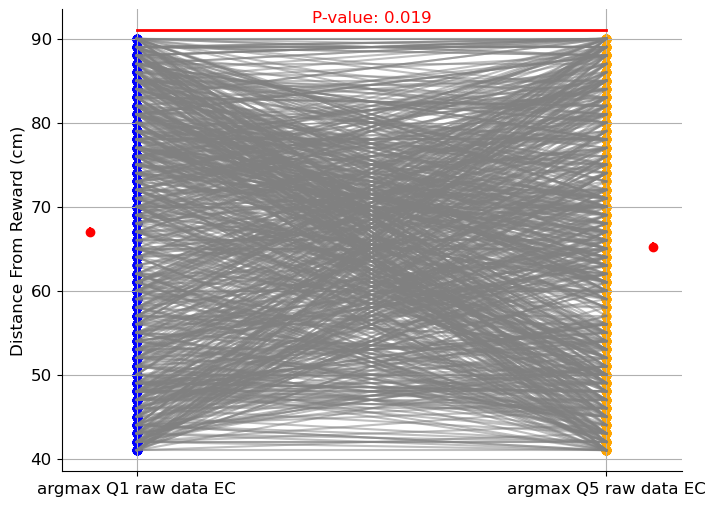

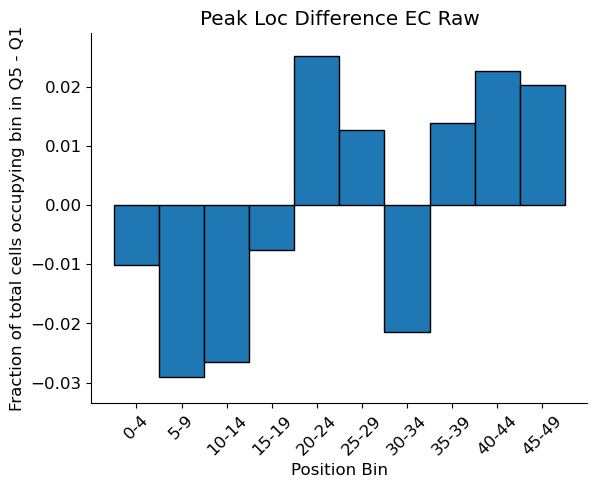

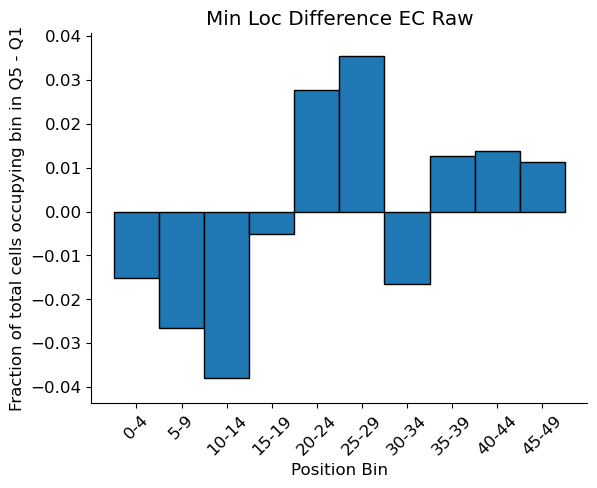

In [398]:
datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename = "EC_GLM"
filepath = os.path.join(datasets_dir, filename+".mat")
reorganized_data, variable_list = preprocess_data(filepath, normalize=True)

trial_argmax_list_EC_first_quintile_raw = []
trial_argmax_list_EC_last_quintile_raw = []


for animal, subdict in reorganized_data.items():
    for cell, value in subdict.items():
        neuron_data = reorganized_data[animal][cell]
#         print(f"neuron_data.shape {neuron_data.shape}")
        neuron_activity = neuron_data[:, 0, :]
        EC_quintiles = split_into_quintiles(neuron_activity)
        first_quintile = EC_quintiles[0]
        last_quintile = EC_quintiles[-1]
        argmax_loc = np.mean(first_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_EC_first_quintile_raw.append(argmax_loc)
        argmax_loc = np.mean(last_quintile, axis=1)
        argmax_loc = np.argmax(argmax_loc)
        trial_argmax_list_EC_last_quintile_raw.append(argmax_loc)
        
trial_argmax_list_EC_first_quintile_raw_distance = []
for i in trial_argmax_list_EC_first_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_EC_first_quintile_raw_distance.append(diff)
    
trial_argmax_list_EC_last_quintile_raw_distance = []
for i in trial_argmax_list_EC_last_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmax_list_EC_last_quintile_raw_distance.append(diff)
    
    
t_stat, p_value_raw_raw = ttest_rel(trial_argmax_list_EC_first_quintile_raw_distance, trial_argmax_list_EC_last_quintile_raw_distance)
        
mean_vl = np.mean(trial_argmax_list_EC_last_quintile_raw_distance)
mean_raw = np.mean(trial_argmax_list_EC_first_quintile_raw_distance)

sem_vl = np.std(trial_argmax_list_EC_last_quintile_raw_distance) / np.sqrt(len(trial_argmax_list_EC_last_quintile_raw_distance))
sem_raw = np.std(trial_argmax_list_EC_first_quintile_raw_distance) / np.sqrt(len(trial_argmax_list_EC_first_quintile_raw_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmax Q1 raw data EC", "argmax Q5 raw data EC"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmax_list_EC_last_quintile_raw_distance)):
    plt.plot(x_positions, [trial_argmax_list_EC_first_quintile_raw_distance[i], trial_argmax_list_EC_last_quintile_raw_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmax_list_EC_first_quintile_raw_distance), trial_argmax_list_EC_first_quintile_raw_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmax_list_EC_last_quintile_raw_distance), trial_argmax_list_EC_last_quintile_raw_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmax_list_EC_first_quintile_raw_distance), max(trial_argmax_list_EC_last_quintile_raw_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_raw:.3f}", ha='center', color='red')



bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_EC_first_quintile_vrl, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_EC_last_quintile_vrl, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

peak_loc_difference_learning_list_EC_raw = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_EC_first_quintile_vrl)
    peak_loc_difference_learning_list_EC_raw.append(value)

y_min = np.min(peak_loc_difference_learning_list_EC_raw)
y_max = np.max(peak_loc_difference_learning_list_EC_raw)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_EC_raw, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference EC Raw')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()

        

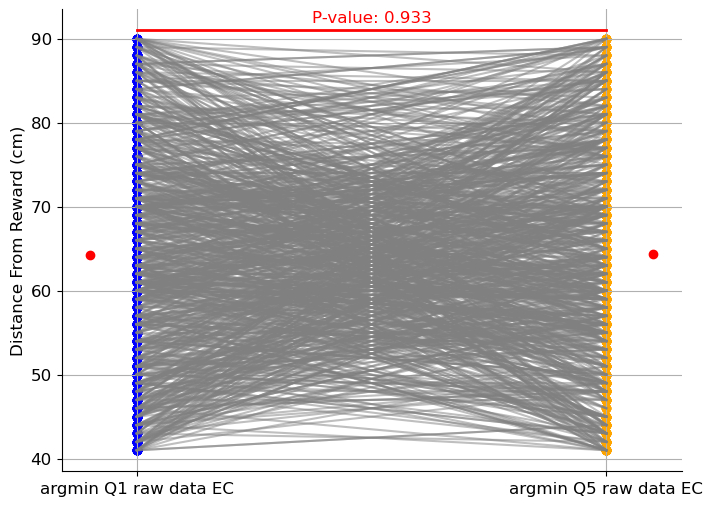

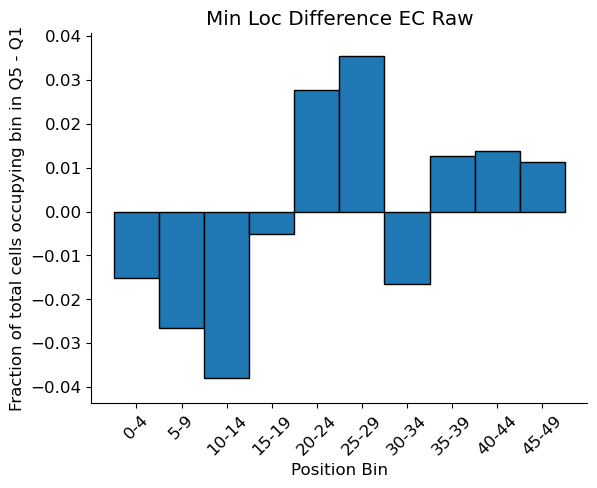

In [399]:
datasets_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir, "datasets"))
filename = "EC_GLM"
filepath = os.path.join(datasets_dir, filename+".mat")
reorganized_data, variable_list = preprocess_data(filepath, normalize=True)

trial_argmin_list_EC_first_quintile_raw = []
trial_argmin_list_EC_last_quintile_raw = []


for animal, subdict in reorganized_data.items():
    for cell, value in subdict.items():
        neuron_data = reorganized_data[animal][cell]
#         print(f"neuron_data.shape {neuron_data.shape}")
        neuron_activity = neuron_data[:, 0, :]
        EC_quintiles = split_into_quintiles(neuron_activity)
        first_quintile = EC_quintiles[0]
        last_quintile = EC_quintiles[-1]
        argmin_loc = np.mean(first_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_EC_first_quintile_raw.append(argmin_loc)
        argmin_loc = np.mean(last_quintile, axis=1)
        argmin_loc = np.argmin(argmin_loc)
        trial_argmin_list_EC_last_quintile_raw.append(argmin_loc)
        
trial_argmin_list_EC_first_quintile_raw_distance = []
for i in trial_argmin_list_EC_first_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_EC_first_quintile_raw_distance.append(diff)
    
trial_argmin_list_EC_last_quintile_raw_distance = []
for i in trial_argmin_list_EC_last_quintile_raw:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    trial_argmin_list_EC_last_quintile_raw_distance.append(diff)
    
    
t_stat, p_value_raw_raw = ttest_rel(trial_argmin_list_EC_first_quintile_raw_distance, trial_argmin_list_EC_last_quintile_raw_distance)
        
mean_vl = np.mean(trial_argmin_list_EC_last_quintile_raw_distance)
mean_raw = np.mean(trial_argmin_list_EC_first_quintile_raw_distance)

sem_vl = np.std(trial_argmin_list_EC_last_quintile_raw_distance) / np.sqrt(len(trial_argmin_list_EC_last_quintile_raw_distance))
sem_raw = np.std(trial_argmin_list_EC_first_quintile_raw_distance) / np.sqrt(len(trial_argmin_list_EC_first_quintile_raw_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["argmin Q1 raw data EC", "argmin Q5 raw data EC"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(trial_argmin_list_EC_last_quintile_raw_distance)):
    plt.plot(x_positions, [trial_argmin_list_EC_first_quintile_raw_distance[i], trial_argmin_list_EC_last_quintile_raw_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(trial_argmin_list_EC_first_quintile_raw_distance), trial_argmin_list_EC_first_quintile_raw_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(trial_argmin_list_EC_last_quintile_raw_distance), trial_argmin_list_EC_last_quintile_raw_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Distance From Reward (cm)')

# Display p-value with a red line
y_min = max(max(trial_argmin_list_EC_first_quintile_raw_distance), max(trial_argmin_list_EC_last_quintile_raw_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_raw:.3f}", ha='center', color='red')





bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

first_quintile_hist, _ = np.histogram(trial_argmax_list_EC_first_quintile_raw, bins=bin_edges)
last_quintile_hist, _ = np.histogram(trial_argmax_list_EC_last_quintile_raw, bins=bin_edges)

peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

min_loc_difference_learning_list_EC_raw = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_EC_first_quintile_vrl)
    min_loc_difference_learning_list_EC_raw.append(value)

y_min = np.min(min_loc_difference_learning_list_EC_raw)
y_max = np.max(min_loc_difference_learning_list_EC_raw)
    
plt.figure()
plt.bar(bin_centers, min_loc_difference_learning_list_EC_raw, width=5, align='center', edgecolor='k')
plt.title('Min Loc Difference EC Raw')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)

plt.show()


plt.show()
        

In [58]:


from scipy.stats import ttest_rel

t_stat, p_value_raw_velocity = ttest_rel(raw_argmax_list_SST_distance, velocity_argmax_list_SST_distance)
        
mean_raw = np.mean(velocity_argmax_list_SST_distance)
mean_velocity = np.mean(raw_argmax_list_SST_distance)

sem_raw = np.std(velocity_argmax_list_SST_distance) / np.sqrt(len(velocity_argmax_list_SST_distance))
sem_velocity = np.std(raw_argmax_list_SST_distance) / np.sqrt(len(raw_argmax_list_SST_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["Raw Peak Loc Difference Reward", "Velocity-Subtracted Peak Loc Difference Reward"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_raw, yerr=sem_raw, fmt='o', color='red'

)

for i in range(len(velocity_argmax_list_SST_distance)):
    plt.plot(x_positions, [raw_argmax_list_SST_distance[i], velocity_argmax_list_SST_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(raw_argmax_list_SST_distance), raw_argmax_list_SST_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(velocity_argmax_list_SST_distance), velocity_argmax_list_SST_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Vinje Selectivity Index')

# Display p-value with a red line
y_min = max(max(raw_argmax_list_SST_distance), max(velocity_argmax_list_SST_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')





# bin_edges = np.arange(0, 51, 5)
# bin_centers = bin_edges[:-1] + 2.5
# bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

# first_quintile_hist, _ = np.histogram(Argmax_list_raw_SST, bins=bin_edges)
# last_quintile_hist, _ = np.histogram(trial_argmax_list_SST_last_quintile_vrl, bins=bin_edges)

# peak_loc_difference_learning = (last_quintile_hist - first_quintile_hist)

# peak_loc_difference_learning_list_SST_rawr = []

# for value in peak_loc_difference_learning:
#     value = value / len(trial_argmax_list_SST_first_quintile_vrl)
#     peak_loc_difference_learning_list_SST_rawr.append(value)

# y_min = np.min(peak_loc_difference_learning_list_SST_rawr)
# y_max = np.max(peak_loc_difference_learning_list_SST_rawr)
    
# plt.figure()
# plt.bar(bin_centers, peak_loc_difference_learning_list_SST_rawr, width=5, align='center', edgecolor='k')
# plt.title('Peak Loc Difference SST Velocity, Reward, Lick Subtracted')
# plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
# plt.xlabel('Position Bin')
# plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
# plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()

plt.show()

NameError: name 'raw_argmax_list_SST_distance' is not defined

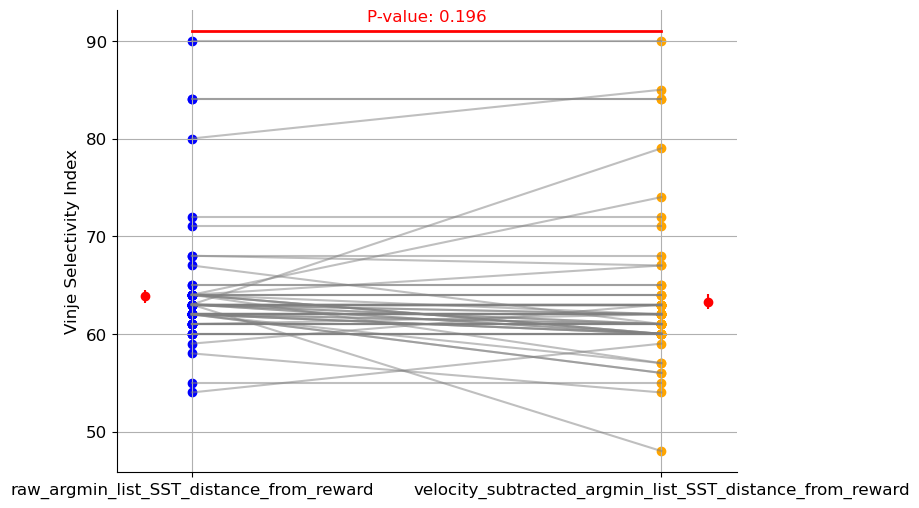

In [436]:


from scipy.stats import ttest_rel

t_stat, p_value_raw_velocity = ttest_rel(raw_argmin_list_SST_distance, velocity_argmin_list_SST_distance)
        
mean_vl = np.mean(velocity_argmin_list_SST_distance)
mean_velocity = np.mean(raw_argmin_list_SST_distance)

sem_vl = np.std(velocity_argmin_list_SST_distance) / np.sqrt(len(velocity_argmin_list_SST_distance))
sem_velocity = np.std(raw_argmin_list_SST_distance) / np.sqrt(len(raw_argmin_list_SST_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["raw_argmin_list_SST_distance_from_reward", "velocity_subtracted_argmin_list_SST_distance_from_reward"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(velocity_argmin_list_SST_distance)):
    plt.plot(x_positions, [raw_argmin_list_SST_distance[i], velocity_argmin_list_SST_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(raw_argmin_list_SST_distance), raw_argmin_list_SST_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(velocity_argmin_list_SST_distance), velocity_argmin_list_SST_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Vinje Selectivity Index')

# Display p-value with a red line
y_min = max(max(raw_argmin_list_SST_distance), max(velocity_argmin_list_SST_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')





plt.show()

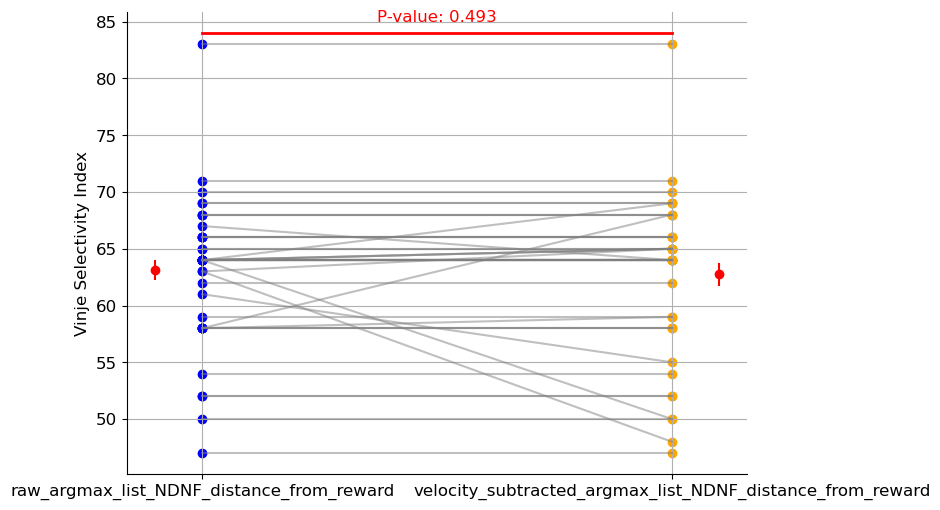

In [437]:


from scipy.stats import ttest_rel

t_stat, p_value_raw_velocity = ttest_rel(raw_argmax_list_NDNF_distance, velocity_argmax_list_NDNF_distance)
        
mean_vl = np.mean(velocity_argmax_list_NDNF_distance)
mean_velocity = np.mean(raw_argmax_list_NDNF_distance)

sem_vl = np.std(velocity_argmax_list_NDNF_distance) / np.sqrt(len(velocity_argmax_list_NDNF_distance))
sem_velocity = np.std(raw_argmax_list_NDNF_distance) / np.sqrt(len(raw_argmax_list_NDNF_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["raw_argmax_list_NDNF_distance_from_reward", "velocity_subtracted_argmax_list_NDNF_distance_from_reward"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(velocity_argmax_list_NDNF_distance)):
    plt.plot(x_positions, [raw_argmax_list_NDNF_distance[i], velocity_argmax_list_NDNF_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(raw_argmax_list_NDNF_distance), raw_argmax_list_NDNF_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(velocity_argmax_list_NDNF_distance), velocity_argmax_list_NDNF_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Vinje Selectivity Index')

# Display p-value with a red line
y_min = max(max(raw_argmax_list_NDNF_distance), max(velocity_argmax_list_NDNF_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')





plt.show()

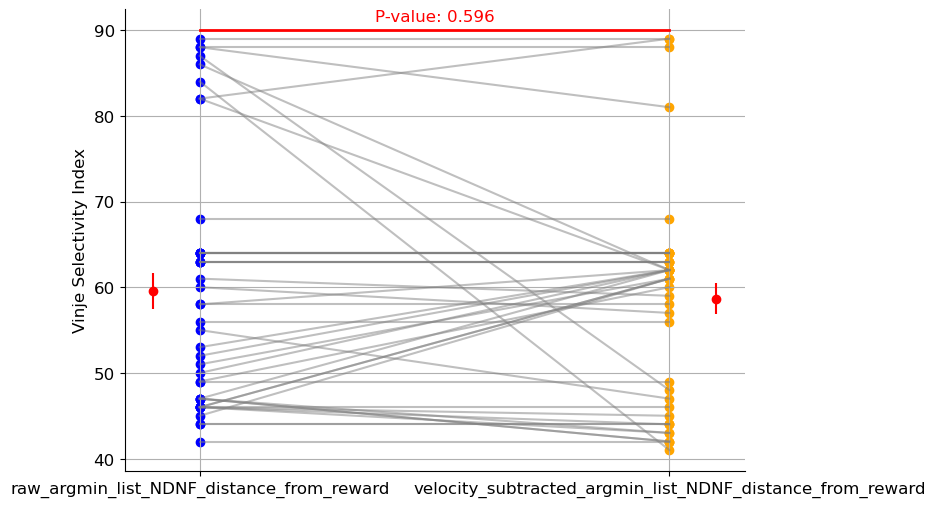

In [438]:


from scipy.stats import ttest_rel

t_stat, p_value_raw_velocity = ttest_rel(raw_argmin_list_NDNF_distance, velocity_argmin_list_NDNF_distance)
        
mean_vl = np.mean(velocity_argmin_list_NDNF_distance)
mean_velocity = np.mean(raw_argmin_list_NDNF_distance)

sem_vl = np.std(velocity_argmin_list_NDNF_distance) / np.sqrt(len(velocity_argmin_list_NDNF_distance))
sem_velocity = np.std(raw_argmin_list_NDNF_distance) / np.sqrt(len(raw_argmin_list_NDNF_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["raw_argmin_list_NDNF_distance_from_reward", "velocity_subtracted_argmin_list_NDNF_distance_from_reward"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(velocity_argmin_list_NDNF_distance)):
    plt.plot(x_positions, [raw_argmin_list_NDNF_distance[i], velocity_argmin_list_NDNF_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(raw_argmin_list_NDNF_distance), raw_argmin_list_NDNF_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(velocity_argmin_list_NDNF_distance), velocity_argmin_list_NDNF_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Vinje Selectivity Index')

# Display p-value with a red line
y_min = max(max(raw_argmin_list_NDNF_distance), max(velocity_argmin_list_NDNF_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')





plt.show()

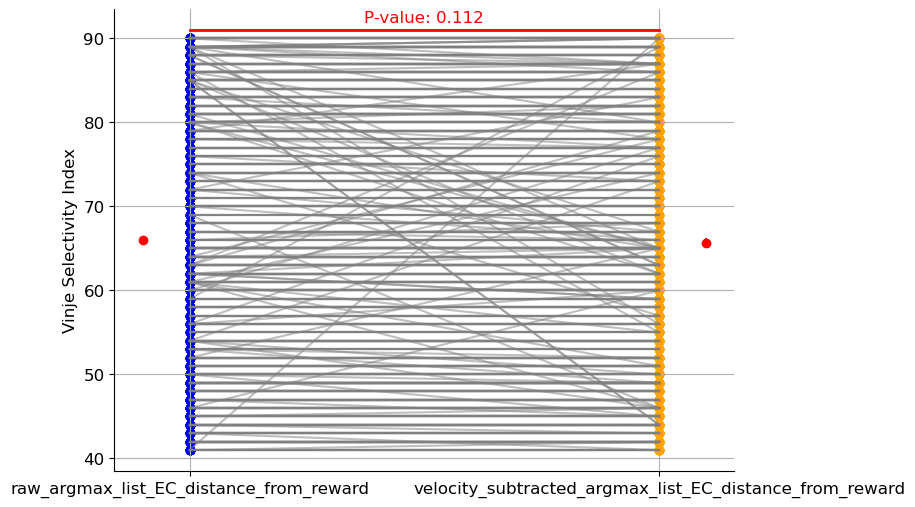

raw_argmax_list_EC_distance 792


In [439]:


from scipy.stats import ttest_rel

t_stat, p_value_raw_velocity = ttest_rel(raw_argmax_list_EC_distance, velocity_argmax_list_EC_distance)
        
mean_vl = np.mean(velocity_argmax_list_EC_distance)
mean_velocity = np.mean(raw_argmax_list_EC_distance)

sem_vl = np.std(velocity_argmax_list_EC_distance) / np.sqrt(len(velocity_argmax_list_EC_distance))
sem_velocity = np.std(raw_argmax_list_EC_distance) / np.sqrt(len(raw_argmax_list_EC_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["raw_argmax_list_EC_distance_from_reward", "velocity_subtracted_argmax_list_EC_distance_from_reward"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(velocity_argmax_list_EC_distance)):
    plt.plot(x_positions, [raw_argmax_list_EC_distance[i], velocity_argmax_list_EC_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(raw_argmax_list_EC_distance), raw_argmax_list_EC_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(velocity_argmax_list_EC_distance), velocity_argmax_list_EC_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Vinje Selectivity Index')

# Display p-value with a red line
y_min = max(max(raw_argmax_list_EC_distance), max(velocity_argmax_list_EC_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')





plt.show()

print(f"raw_argmax_list_EC_distance {len(raw_argmax_list_EC_distance)}")

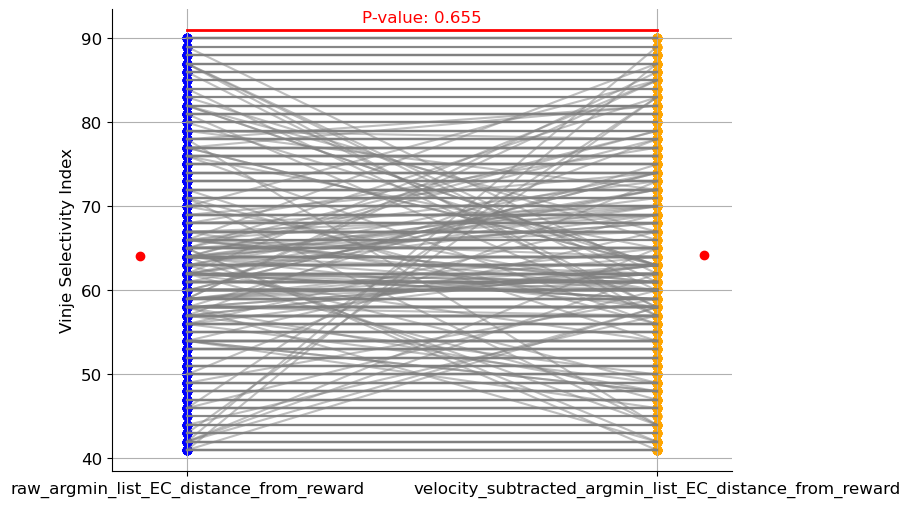

raw_argmin_list_EC_distance 792


In [440]:


from scipy.stats import ttest_rel

t_stat, p_value_raw_velocity = ttest_rel(raw_argmin_list_EC_distance, velocity_argmin_list_EC_distance)
        
mean_vl = np.mean(velocity_argmin_list_EC_distance)
mean_velocity = np.mean(raw_argmin_list_EC_distance)

sem_vl = np.std(velocity_argmin_list_EC_distance) / np.sqrt(len(velocity_argmin_list_EC_distance))
sem_velocity = np.std(raw_argmin_list_EC_distance) / np.sqrt(len(raw_argmin_list_EC_distance))

plt.figure(figsize=(8, 6))

# Scatter points
x_positions = [0.4, 0.6]
x_labels = ["raw_argmin_list_EC_distance_from_reward", "velocity_subtracted_argmin_list_EC_distance_from_reward"]

mean_offset = 0.02
plt.errorbar(
    x_positions[0] - mean_offset, mean_velocity, yerr=sem_velocity, fmt='o', color='red' 
)
plt.errorbar(
    x_positions[1] + mean_offset, mean_vl, yerr=sem_vl, fmt='o', color='red'

)

for i in range(len(velocity_argmin_list_EC_distance)):
    plt.plot(x_positions, [raw_argmin_list_EC_distance[i], velocity_argmin_list_EC_distance[i]], color='gray', alpha=0.5)

plt.scatter([x_positions[0]] * len(raw_argmin_list_EC_distance), raw_argmin_list_EC_distance, color='blue', label="First Quintile Distance From Reward EC")
plt.scatter([x_positions[1]] * len(velocity_argmin_list_EC_distance), velocity_argmin_list_EC_distance, color='orange', label="Last Quintile Distance From Reward EC")

# Add labels and title
plt.xticks(x_positions, x_labels)
plt.ylabel('Vinje Selectivity Index')

# Display p-value with a red line
y_min = max(max(raw_argmin_list_EC_distance), max(velocity_argmin_list_EC_distance))
plt.plot([x_positions[0], x_positions[1]], [y_min + 1, y_min + 1], color='red', linewidth=2)
plt.grid()         
plt.text(0.5, y_min + 2, f"P-value: {p_value_raw_velocity:.3f}", ha='center', color='red')





plt.show()

print(f"raw_argmin_list_EC_distance {len(raw_argmin_list_EC_distance)}")

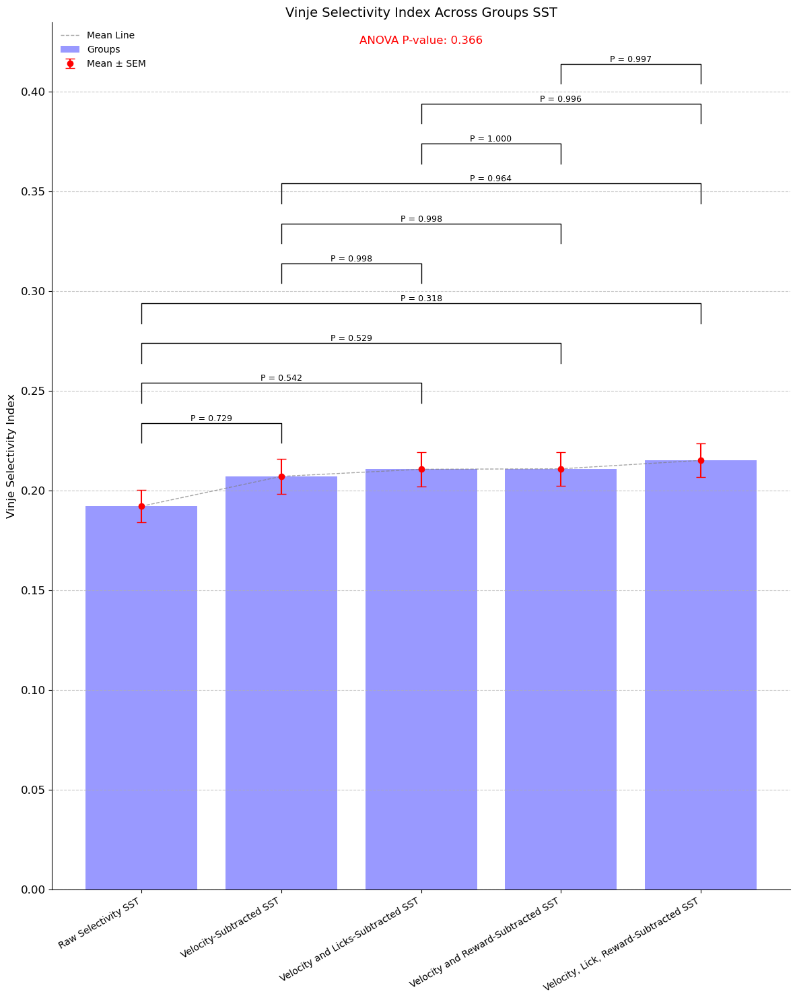

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1   0.0149  0.729 -0.0181  0.048  False
     0      2   0.0185  0.542 -0.0146 0.0516  False
     0      3   0.0187 0.5291 -0.0144 0.0518  False
     0      4    0.023 0.3181 -0.0101 0.0561  False
     1      2   0.0036 0.9984 -0.0295 0.0366  False
     1      3   0.0038 0.9979 -0.0293 0.0369  False
     1      4    0.008  0.964 -0.0251 0.0411  False
     2      3   0.0002    1.0 -0.0329 0.0333  False
     2      4   0.0045  0.996 -0.0286 0.0376  False
     3      4   0.0042 0.9968 -0.0289 0.0373  False
---------------------------------------------------


In [46]:
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import matplotlib.pyplot as plt

# Data groups
groups = [
    SST_raw_selectivity,
    selectivity_SST_velocity,
    selectivity_SST_vl,
    selectivity_SST_vr,
    selectivity_SST_vrl
]

# Labels for the groups
group_labels = [
    "Raw Selectivity SST",
    "Velocity-Subtracted SST",
    "Velocity and Licks-Subtracted SST",
    "Velocity and Reward-Subtracted SST",
    "Velocity, Lick, Reward-Subtracted SST"
]

# Flatten data for Tukey's test
flat_data = np.concatenate(groups)
group_indices = np.concatenate([[i] * len(group) for i, group in enumerate(groups)])

# Perform one-way ANOVA
f_stat, p_value_anova = f_oneway(*groups)

# Perform Tukey's HSD test
tukey = pairwise_tukeyhsd(flat_data, group_indices)

# Calculate means and SEMs for each group
means = [np.mean(group) for group in groups]
sems = [np.std(group) / np.sqrt(len(group)) for group in groups]

# Plotting
plt.figure(figsize=(12, 15))  # Reduced height for a more compact figure
x_positions = np.arange(len(groups))

# Plot bars for means
plt.bar(x_positions, means, alpha=0.4, color='blue', label='Groups')
plt.errorbar(x_positions, means, yerr=sems, fmt='o', color='red', capsize=5, label='Mean ± SEM')

# Grey line connecting means
plt.plot(x_positions, means, color='gray', linestyle='--', linewidth=1, alpha=0.7, label='Mean Line')

# Add pairwise comparisons with more condensed bars
y_max = max(means) + max(sems) 
y_offset = 0.01  # Smaller vertical spacing for condensed bars
bar_height = 0.01  # Reduced bar height

for row in tukey._results_table.data[1:]:  # Skip the header row
    group1, group2, _, p_val, _, _, _ = row  # Unpack relevant data
    x1, x2 = x_positions[int(group1)], x_positions[int(group2)]
    y = y_max  # Start of the comparison bar
    plt.plot([x1, x1, x2, x2], [y, y + bar_height, y + bar_height, y], color='black', linewidth=1)  # Vertical bar
    plt.text((x1 + x2) / 2, y + bar_height+0.001, f"P = {p_val:.3f}", ha='center', fontsize=9)
    y_max += bar_height + 0.01  # Slight stagger for next bar

# Customize plot
plt.xticks(x_positions, group_labels, rotation=30, ha='right', fontsize=10)
plt.ylabel('Vinje Selectivity Index', fontsize=12)
plt.title('Vinje Selectivity Index Across Groups SST', fontsize=14)
plt.text(len(groups) / 2 - 0.5, y_max, f"ANOVA P-value: {p_value_anova:.3f}", ha='center', color='red', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

# Print Tukey's HSD summary
print(tukey.summary())




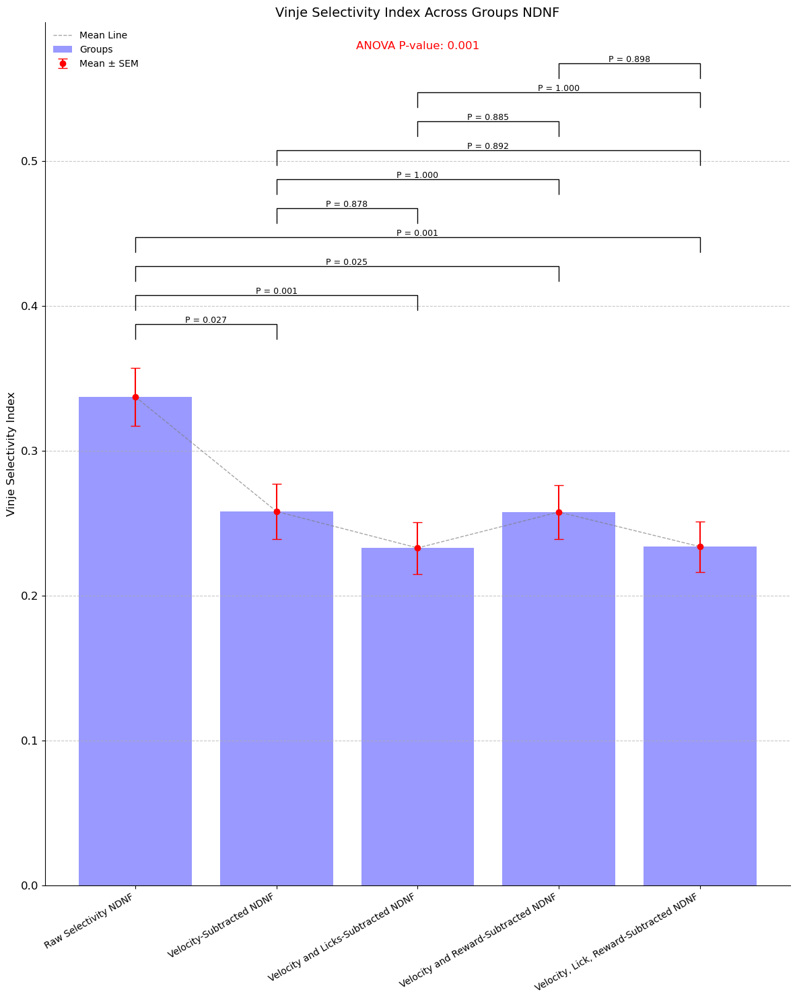

Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
     0      1  -0.0792 0.0268 -0.1524  -0.006   True
     0      2  -0.1044 0.0011 -0.1776 -0.0312   True
     0      3  -0.0796 0.0255 -0.1529 -0.0064   True
     0      4  -0.1035 0.0013 -0.1767 -0.0303   True
     1      2  -0.0252 0.8781 -0.0984   0.048  False
     1      3  -0.0004    1.0 -0.0737  0.0728  False
     1      4  -0.0243 0.8916 -0.0975  0.0489  False
     2      3   0.0248 0.8849 -0.0485   0.098  False
     2      4   0.0009    1.0 -0.0723  0.0741  False
     3      4  -0.0239 0.8979 -0.0971  0.0494  False
----------------------------------------------------


In [47]:
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import matplotlib.pyplot as plt

# Data groups
groups = [
    NDNF_raw_selectivity,
    selectivity_NDNF_velocity,
    selectivity_NDNF_vl,
    selectivity_NDNF_vr,
    selectivity_NDNF_vrl
]

# Labels for the groups
group_labels = [
    "Raw Selectivity NDNF",
    "Velocity-Subtracted NDNF",
    "Velocity and Licks-Subtracted NDNF",
    "Velocity and Reward-Subtracted NDNF",
    "Velocity, Lick, Reward-Subtracted NDNF"
]

# Flatten data for Tukey's test
flat_data = np.concatenate(groups)
group_indices = np.concatenate([[i] * len(group) for i, group in enumerate(groups)])

# Perform one-way ANOVA
f_stat, p_value_anova = f_oneway(*groups)

# Perform Tukey's HSD test
tukey = pairwise_tukeyhsd(flat_data, group_indices)

# Calculate means and SEMs for each group
means = [np.mean(group) for group in groups]
sems = [np.std(group) / np.sqrt(len(group)) for group in groups]

# Plotting
plt.figure(figsize=(12, 15))  # Reduced height for a more compact figure
x_positions = np.arange(len(groups))

# Plot bars for means
plt.bar(x_positions, means, alpha=0.4, color='blue', label='Groups')
plt.errorbar(x_positions, means, yerr=sems, fmt='o', color='red', capsize=5, label='Mean ± SEM')

# Grey line connecting means
plt.plot(x_positions, means, color='gray', linestyle='--', linewidth=1, alpha=0.7, label='Mean Line')

# Add pairwise comparisons with more condensed bars
y_max = max(means) + max(sems) + 0.02
y_offset = 0.01  # Smaller vertical spacing for condensed bars
bar_height = 0.01  # Reduced bar height

for row in tukey._results_table.data[1:]:  # Skip the header row
    group1, group2, _, p_val, _, _, _ = row  # Unpack relevant data
    x1, x2 = x_positions[int(group1)], x_positions[int(group2)]
    y = y_max  # Start of the comparison bar
    plt.plot([x1, x1, x2, x2], [y, y + bar_height, y + bar_height, y], color='black', linewidth=1)  # Vertical bar
    plt.text((x1 + x2) / 2, y + bar_height+0.001, f"P = {p_val:.3f}", ha='center', fontsize=9)
    y_max += bar_height + 0.01  # Slight stagger for next bar

# Customize plot
plt.xticks(x_positions, group_labels, rotation=30, ha='right', fontsize=10)
plt.ylabel('Vinje Selectivity Index', fontsize=12)
plt.title('Vinje Selectivity Index Across Groups NDNF', fontsize=14)
plt.text(len(groups) / 2 - 0.5, y_max, f"ANOVA P-value: {p_value_anova:.3f}", ha='center', color='red', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

# Print Tukey's HSD summary
print(tukey.summary())




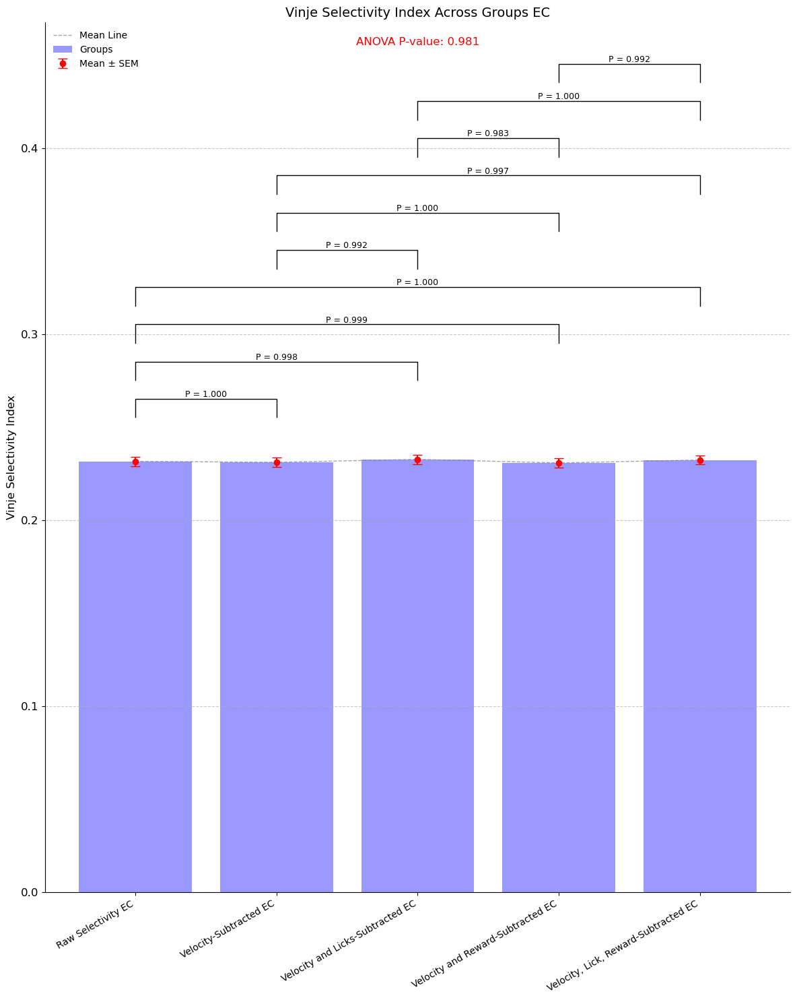

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1  -0.0005 0.9999 -0.0102 0.0092  False
     0      2   0.0011 0.9982 -0.0086 0.0107  False
     0      3  -0.0008 0.9993 -0.0105 0.0088  False
     0      4   0.0008 0.9995 -0.0089 0.0104  False
     1      2   0.0016 0.9923 -0.0081 0.0112  False
     1      3  -0.0004    1.0   -0.01 0.0093  False
     1      4   0.0012 0.9968 -0.0084 0.0109  False
     2      3  -0.0019 0.9833 -0.0116 0.0078  False
     2      4  -0.0003    1.0   -0.01 0.0094  False
     3      4   0.0016 0.9915 -0.0081 0.0113  False
---------------------------------------------------


In [61]:
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import matplotlib.pyplot as plt

# Data groups
groups = [
    EC_raw_selectivity,
    selectivity_EC_velocity,
    selectivity_EC_vl,
    selectivity_EC_vr,
    selectivity_EC_vrl
]

# Labels for the groups
group_labels = [
    "Raw Selectivity EC",
    "Velocity-Subtracted EC",
    "Velocity and Licks-Subtracted EC",
    "Velocity and Reward-Subtracted EC",
    "Velocity, Lick, Reward-Subtracted EC"
]

# Flatten data for Tukey's test
flat_data = np.concatenate(groups)
group_indices = np.concatenate([[i] * len(group) for i, group in enumerate(groups)])

# Perform one-way ANOVA
f_stat, p_value_anova = f_oneway(*groups)

# Perform Tukey's HSD test
tukey = pairwise_tukeyhsd(flat_data, group_indices)

# Calculate means and SEMs for each group
means = [np.mean(group) for group in groups]
sems = [np.std(group) / np.sqrt(len(group)) for group in groups]

# Plotting
plt.figure(figsize=(12, 15))  # Reduced height for a more compact figure
x_positions = np.arange(len(groups))

# Plot bars for means
plt.bar(x_positions, means, alpha=0.4, color='blue', label='Groups')
plt.errorbar(x_positions, means, yerr=sems, fmt='o', color='red', capsize=5, label='Mean ± SEM')

# Grey line connecting means
plt.plot(x_positions, means, color='gray', linestyle='--', linewidth=1, alpha=0.7, label='Mean Line')

# Add pairwise comparisons with more condensed bars
y_max = max(means) + max(sems) + 0.02
y_offset = 0.01  # Smaller vertical spacing for condensed bars
bar_height = 0.01  # Reduced bar height

for row in tukey._results_table.data[1:]:  # Skip the header row
    group1, group2, _, p_val, _, _, _ = row  # Unpack relevant data
    x1, x2 = x_positions[int(group1)], x_positions[int(group2)]
    y = y_max  # Start of the comparison bar
    plt.plot([x1, x1, x2, x2], [y, y + bar_height, y + bar_height, y], color='black', linewidth=1)  # Vertical bar
    plt.text((x1 + x2) / 2, y + bar_height+0.001, f"P = {p_val:.3f}", ha='center', fontsize=9)
    y_max += bar_height + 0.01  # Slight stagger for next bar

# Customize plot
plt.xticks(x_positions, group_labels, rotation=30, ha='right', fontsize=10)
plt.ylabel('Vinje Selectivity Index', fontsize=12)
plt.title('Vinje Selectivity Index Across Groups EC', fontsize=14)
plt.text(len(groups) / 2 - 0.5, y_max, f"ANOVA P-value: {p_value_anova:.3f}", ha='center', color='red', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(loc='upper left', fontsize=10)
plt.tight_layout()
plt.show()

# Print Tukey's HSD summary
print(tukey.summary())




In [7]:
bin_size = 180/50
reward_loc = bin_size * 25

argmax_SST_dist_reward_raw = []
for i in Argmax_list_raw_SST:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_SST_dist_reward_raw.append(diff)
    
argmin_SST_dist_reward_raw = []
for i in Argmin_list_raw_SST:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_SST_dist_reward_raw.append(diff)

bin_size = 180/50
reward_loc = bin_size * 25

argmax_SST_dist_reward_velocity = []
for i in argmax_list_SST_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_SST_dist_reward_velocity.append(diff)
    
argmin_SST_dist_reward_velocity = []
for i in argmin_list_SST_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_SST_dist_reward_velocity.append(diff)

bin_size = 180/50
reward_loc = bin_size * 25

argmax_SST_dist_reward_vl = []
for i in argmax_list_SST_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_SST_dist_reward_vl.append(diff)
    
argmin_SST_dist_reward_vl = []
for i in argmin_list_SST_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_SST_dist_reward_vl.append(diff)

bin_size = 180/50
reward_loc = bin_size * 25

argmax_SST_dist_reward_vr = []
for i in argmax_list_SST_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_SST_dist_reward_vr.append(diff)
    
argmin_SST_dist_reward_vr = []
for i in argmin_list_SST_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_SST_dist_reward_vr.append(diff)
    
bin_size = 180/50
reward_loc = bin_size * 25

argmax_SST_dist_reward_vrl = []
for i in argmax_list_SST_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_SST_dist_reward_vrl.append(diff)
    
argmin_SST_dist_reward_vrl = []
for i in argmin_list_SST_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_SST_dist_reward_vrl.append(diff)

In [ ]:


bin_edges = np.arange(0, 51, 5)
bin_centers = bin_edges[:-1] + 2.5
bin_labels = [f"{start}-{start + 4}" for start in bin_edges[:-1]]

raw_hist, _ = np.histogram(Argmax_list_raw_SST, bins=bin_edges)
velocity_hist, _ = np.histogram(trial_argmax_list_SST_last_quintile_velocity, bins=bin_edges)

peak_loc_difference_learning = (velocity_hist - raw_hist)

peak_loc_difference_learning_list_SST_velocity = []

for value in peak_loc_difference_learning:
    value = value / len(trial_argmax_list_SST_first_quintile_velocity)
    peak_loc_difference_learning_list_SST_velocity.append(value)

y_min = np.min(peak_loc_difference_learning_list_SST_velocity)
y_max = np.max(peak_loc_difference_learning_list_SST_velocity)
    
plt.figure()
plt.bar(bin_centers, peak_loc_difference_learning_list_SST_velocity, width=5, align='center', edgecolor='k')
plt.title('Peak Loc Difference SST Velocity Subtracted')
plt.ylabel('Fraction of total cells occupying bin in Q5 - Q1')
plt.xlabel('Position Bin')
plt.ylim(y_min + y_min * 0.15, y_max + y_max * 0.15)
plt.xticks(bin_centers, bin_labels, rotation=45)


plt.show()

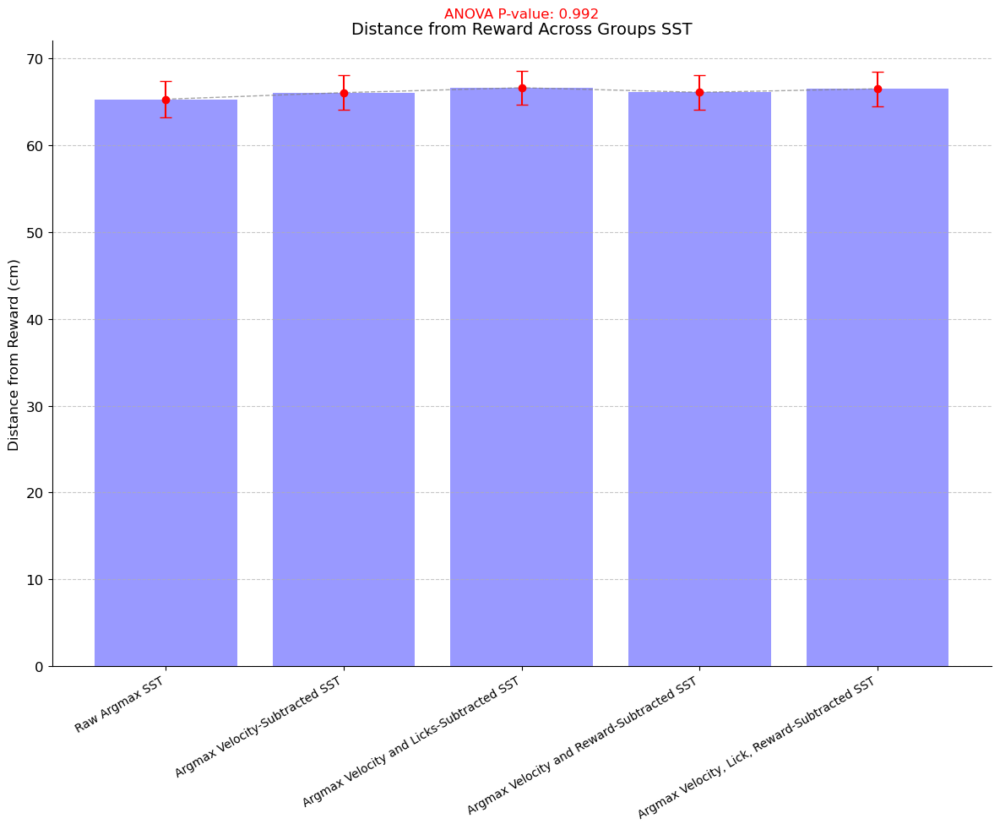

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1     0.76 0.9989 -7.0386 8.5586  False
     0      2     1.32 0.9905 -6.4786 9.1186  False
     0      3      0.8 0.9986 -6.9986 8.5986  False
     0      4      1.2 0.9934 -6.5986 8.9986  False
     1      2     0.56 0.9997 -7.2386 8.3586  False
     1      3     0.04    1.0 -7.7586 7.8386  False
     1      4     0.44 0.9999 -7.3586 8.2386  False
     2      3    -0.52 0.9997 -8.3186 7.2786  False
     2      4    -0.12    1.0 -7.9186 7.6786  False
     3      4      0.4 0.9999 -7.3986 8.1986  False
---------------------------------------------------


In [36]:
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import matplotlib.pyplot as plt

# Data groups
groups = [
    argmax_SST_dist_reward_raw,
    argmax_SST_dist_reward_velocity,
    argmax_SST_dist_reward_vl,
    argmax_SST_dist_reward_vr,
    argmax_SST_dist_reward_vrl
]

# Labels for the groups
group_labels = [
    "Raw Argmax SST",
    "Argmax Velocity-Subtracted SST",
    "Argmax Velocity and Licks-Subtracted SST",
    "Argmax Velocity and Reward-Subtracted SST",
    "Argmax Velocity, Lick, Reward-Subtracted SST"
]

# Flatten data for Tukey's test
flat_data = np.concatenate(groups)
group_indices = np.concatenate([[i] * len(group) for i, group in enumerate(groups)])

# Perform one-way ANOVA
f_stat, p_value_anova = f_oneway(*groups)

# Perform Tukey's HSD test
tukey = pairwise_tukeyhsd(flat_data, group_indices)

# Calculate means and SEMs for each group
means = [np.mean(group) for group in groups]
sems = [np.std(group) / np.sqrt(len(group)) for group in groups]

# Plotting
plt.figure(figsize=(12, 10))
x_positions = np.arange(len(groups))

# Plot bars for means
plt.bar(x_positions, means, alpha=0.4, color='blue', label='Groups')
plt.errorbar(x_positions, means, yerr=sems, fmt='o', color='red', capsize=5, label='Mean ± SEM')

# Grey line connecting means
plt.plot(x_positions, means, color='gray', linestyle='--', linewidth=1, alpha=0.7, label='Mean Line')

# # Add Tukey HSD pairwise comparisons
y_max = max(means) + max(sems) +1 

# bar_spacing = 3  # Space between each bar
# line_height_increment = 10  # Increment for each comparison
current_height = y_max

# for row in tukey._results_table.data[1:]:  # Skip the header row
#     group1, group2, _, p_val, _, _, _ = row
#     x1, x2 = x_positions[int(group1)], x_positions[int(group2)]
    
#     # Plot horizontal Tukey line
#     plt.plot([x1, x1, x2, x2], [current_height, current_height + bar_spacing, current_height + bar_spacing, current_height], color='black', linewidth=1)
    
#     # Add p-value text
#     plt.text((x1 + x2) / 2, current_height + bar_spacing + 0.5, f"P = {p_val:.3f}", ha='center', fontsize=9)
    
#     # Update height for next line
#     current_height += line_height_increment

# Customize plot
plt.xticks(x_positions, group_labels, rotation=30, ha='right', fontsize=10)
plt.ylabel('Distance from Reward (cm)', fontsize=12)
plt.title('Distance from Reward Across Groups SST', fontsize=14)
plt.text(len(groups) / 2 - 0.5, current_height + 5, f"ANOVA P-value: {p_value_anova:.3f}", ha='center', color='red', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print Tukey's HSD summary
print(tukey.summary())


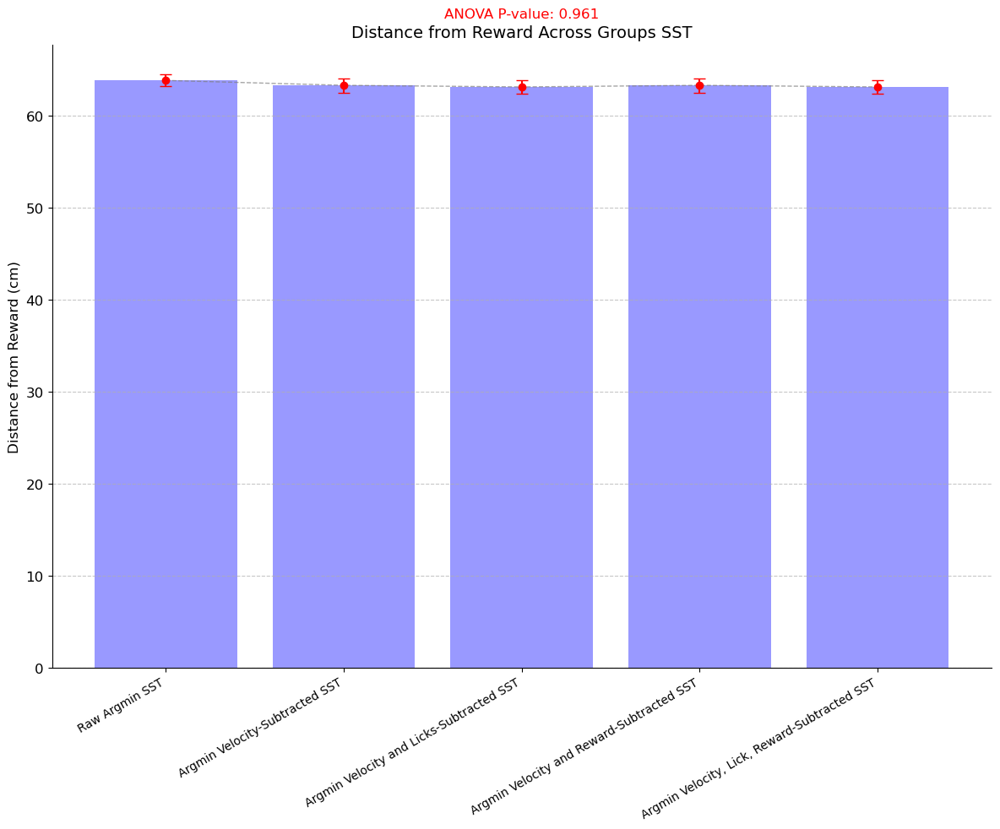

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1  -0.5333 0.9865 -3.4094 2.3428  False
     0      2  -0.7067  0.962 -3.5828 2.1694  False
     0      3  -0.5333 0.9865 -3.4094 2.3428  False
     0      4  -0.7067  0.962 -3.5828 2.1694  False
     1      2  -0.1733 0.9998 -3.0494 2.7028  False
     1      3      0.0    1.0 -2.8761 2.8761  False
     1      4  -0.1733 0.9998 -3.0494 2.7028  False
     2      3   0.1733 0.9998 -2.7028 3.0494  False
     2      4      0.0    1.0 -2.8761 2.8761  False
     3      4  -0.1733 0.9998 -3.0494 2.7028  False
---------------------------------------------------


In [35]:
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import matplotlib.pyplot as plt

# Data groups
groups = [
    argmin_SST_dist_reward_raw,
    argmin_SST_dist_reward_velocity,
    argmin_SST_dist_reward_vl,
    argmin_SST_dist_reward_vr,
    argmin_SST_dist_reward_vrl
]

# Labels for the groups
group_labels = [
    "Raw Argmin SST",
    "Argmin Velocity-Subtracted SST",
    "Argmin Velocity and Licks-Subtracted SST",
    "Argmin Velocity and Reward-Subtracted SST",
    "Argmin Velocity, Lick, Reward-Subtracted SST"
]

# Flatten data for Tukey's test
flat_data = np.concatenate(groups)
group_indices = np.concatenate([[i] * len(group) for i, group in enumerate(groups)])

# Perform one-way ANOVA
f_stat, p_value_anova = f_oneway(*groups)

# Perform Tukey's HSD test
tukey = pairwise_tukeyhsd(flat_data, group_indices)

# Calculate means and SEMs for each group
means = [np.mean(group) for group in groups]
sems = [np.std(group) / np.sqrt(len(group)) for group in groups]

# Plotting
plt.figure(figsize=(12, 10))
x_positions = np.arange(len(groups))

# Plot bars for means
plt.bar(x_positions, means, alpha=0.4, color='blue', label='Groups')
plt.errorbar(x_positions, means, yerr=sems, fmt='o', color='red', capsize=5, label='Mean ± SEM')

# Grey line connecting means
plt.plot(x_positions, means, color='gray', linestyle='--', linewidth=1, alpha=0.7, label='Mean Line')

# # Add Tukey HSD pairwise comparisons
y_max = max(means) + max(sems) +1 

# bar_spacing = 3  # Space between each bar
# line_height_increment = 10  # Increment for each comparison
current_height = y_max

# for row in tukey._results_table.data[1:]:  # Skip the header row
#     group1, group2, _, p_val, _, _, _ = row
#     x1, x2 = x_positions[int(group1)], x_positions[int(group2)]
    
#     # Plot horizontal Tukey line
#     plt.plot([x1, x1, x2, x2], [current_height, current_height + bar_spacing, current_height + bar_spacing, current_height], color='black', linewidth=1)
    
#     # Add p-value text
#     plt.text((x1 + x2) / 2, current_height + bar_spacing + 0.5, f"P = {p_val:.3f}", ha='center', fontsize=9)
    
#     # Update height for next line
#     current_height += line_height_increment

# Customize plot
plt.xticks(x_positions, group_labels, rotation=30, ha='right', fontsize=10)
plt.ylabel('Distance from Reward (cm)', fontsize=12)
plt.title('Distance from Reward Across Groups SST', fontsize=14)
plt.text(len(groups) / 2 - 0.5, current_height + 5, f"ANOVA P-value: {p_value_anova:.3f}", ha='center', color='red', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print Tukey's HSD summary
print(tukey.summary())


In [37]:
bin_size = 180/50
reward_loc = bin_size * 25

argmax_NDNF_dist_reward_raw = []
for i in Argmax_list_raw_NDNF:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_NDNF_dist_reward_raw.append(diff)
    
argmin_NDNF_dist_reward_raw = []
for i in Argmin_list_raw_NDNF:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_NDNF_dist_reward_raw.append(diff)

bin_size = 180/50
reward_loc = bin_size * 25

argmax_NDNF_dist_reward_velocity = []
for i in argmax_list_NDNF_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_NDNF_dist_reward_velocity.append(diff)
    
argmin_NDNF_dist_reward_velocity = []
for i in argmin_list_NDNF_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_NDNF_dist_reward_velocity.append(diff)

bin_size = 180/50
reward_loc = bin_size * 25

argmax_NDNF_dist_reward_vl = []
for i in argmax_list_NDNF_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_NDNF_dist_reward_vl.append(diff)
    
argmin_NDNF_dist_reward_vl = []
for i in argmin_list_NDNF_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_NDNF_dist_reward_vl.append(diff)

bin_size = 180/50
reward_loc = bin_size * 25

argmax_NDNF_dist_reward_vr = []
for i in argmax_list_NDNF_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_NDNF_dist_reward_vr.append(diff)
    
argmin_NDNF_dist_reward_vr = []
for i in argmin_list_NDNF_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_NDNF_dist_reward_vr.append(diff)
    
bin_size = 180/50
reward_loc = bin_size * 25

argmax_NDNF_dist_reward_vrl = []
for i in argmax_list_NDNF_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_NDNF_dist_reward_vrl.append(diff)
    
argmin_NDNF_dist_reward_vrl = []
for i in argmin_list_NDNF_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_NDNF_dist_reward_vrl.append(diff)

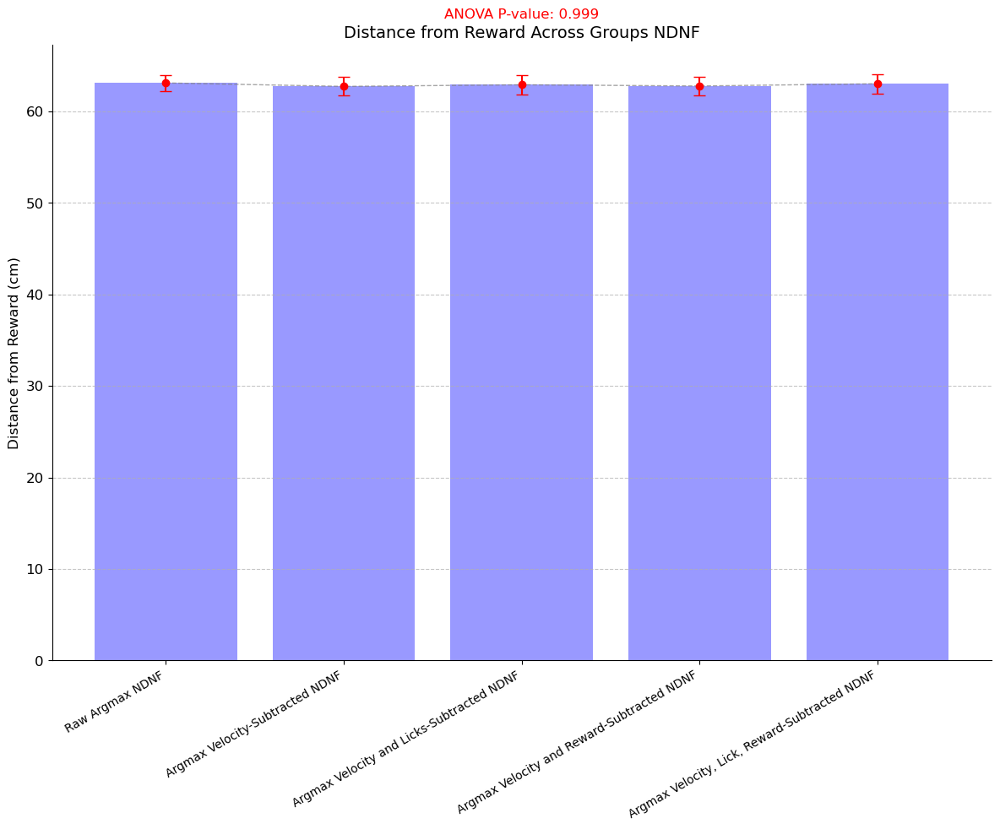

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1  -0.3778  0.999 -4.3523 3.5967  False
     0      2     -0.2 0.9999 -4.1745 3.7745  False
     0      3  -0.3333 0.9994 -4.3078 3.6412  False
     0      4  -0.0889    1.0 -4.0634 3.8856  False
     1      2   0.1778 0.9999 -3.7967 4.1523  False
     1      3   0.0444    1.0 -3.9301  4.019  False
     1      4   0.2889 0.9996 -3.6856 4.2634  False
     2      3  -0.1333    1.0 -4.1078 3.8412  False
     2      4   0.1111    1.0 -3.8634 4.0856  False
     3      4   0.2444 0.9998 -3.7301  4.219  False
---------------------------------------------------


In [38]:
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import matplotlib.pyplot as plt

# Data groups
groups = [
    argmax_NDNF_dist_reward_raw,
    argmax_NDNF_dist_reward_velocity,
    argmax_NDNF_dist_reward_vl,
    argmax_NDNF_dist_reward_vr,
    argmax_NDNF_dist_reward_vrl
]

# Labels for the groups
group_labels = [
    "Raw Argmax NDNF",
    "Argmax Velocity-Subtracted NDNF",
    "Argmax Velocity and Licks-Subtracted NDNF",
    "Argmax Velocity and Reward-Subtracted NDNF",
    "Argmax Velocity, Lick, Reward-Subtracted NDNF"
]

# Flatten data for Tukey's test
flat_data = np.concatenate(groups)
group_indices = np.concatenate([[i] * len(group) for i, group in enumerate(groups)])

# Perform one-way ANOVA
f_stat, p_value_anova = f_oneway(*groups)

# Perform Tukey's HSD test
tukey = pairwise_tukeyhsd(flat_data, group_indices)

# Calculate means and SEMs for each group
means = [np.mean(group) for group in groups]
sems = [np.std(group) / np.sqrt(len(group)) for group in groups]

# Plotting
plt.figure(figsize=(12, 10))
x_positions = np.arange(len(groups))

# Plot bars for means
plt.bar(x_positions, means, alpha=0.4, color='blue', label='Groups')
plt.errorbar(x_positions, means, yerr=sems, fmt='o', color='red', capsize=5, label='Mean ± SEM')

# Grey line connecting means
plt.plot(x_positions, means, color='gray', linestyle='--', linewidth=1, alpha=0.7, label='Mean Line')

# # Add Tukey HSD pairwise comparisons
y_max = max(means) + max(sems) +1 

# bar_spacing = 3  # Space between each bar
# line_height_increment = 10  # Increment for each comparison
current_height = y_max

# for row in tukey._results_table.data[1:]:  # Skip the header row
#     group1, group2, _, p_val, _, _, _ = row
#     x1, x2 = x_positions[int(group1)], x_positions[int(group2)]
    
#     # Plot horizontal Tukey line
#     plt.plot([x1, x1, x2, x2], [current_height, current_height + bar_spacing, current_height + bar_spacing, current_height], color='black', linewidth=1)
    
#     # Add p-value text
#     plt.text((x1 + x2) / 2, current_height + bar_spacing + 0.5, f"P = {p_val:.3f}", ha='center', fontsize=9)
    
#     # Update height for next line
#     current_height += line_height_increment

# Customize plot
plt.xticks(x_positions, group_labels, rotation=30, ha='right', fontsize=10)
plt.ylabel('Distance from Reward (cm)', fontsize=12)
plt.title('Distance from Reward Across Groups NDNF', fontsize=14)
plt.text(len(groups) / 2 - 0.5, current_height + 5, f"ANOVA P-value: {p_value_anova:.3f}", ha='center', color='red', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print Tukey's HSD summary
print(tukey.summary())


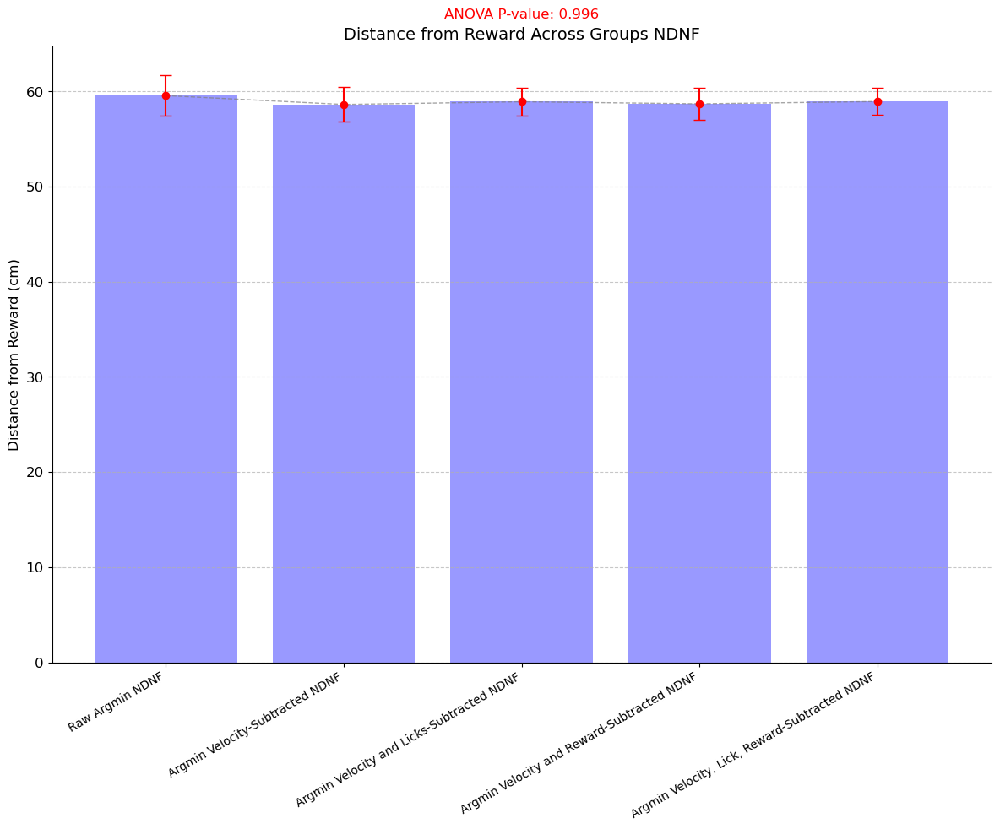

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1  -0.9333 0.9955 -7.6559 5.7892  False
     0      2  -0.6444 0.9989  -7.367 6.0781  False
     0      3  -0.8667 0.9966 -7.5892 5.8559  False
     0      4  -0.6222 0.9991 -7.3448 6.1003  False
     1      2   0.2889    1.0 -6.4337 7.0114  False
     1      3   0.0667    1.0 -6.6559 6.7892  False
     1      4   0.3111 0.9999 -6.4114 7.0337  False
     2      3  -0.2222    1.0 -6.9448 6.5003  False
     2      4   0.0222    1.0 -6.7003 6.7448  False
     3      4   0.2444    1.0 -6.4781  6.967  False
---------------------------------------------------


In [39]:
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import matplotlib.pyplot as plt

# Data groups
groups = [
    argmin_NDNF_dist_reward_raw,
    argmin_NDNF_dist_reward_velocity,
    argmin_NDNF_dist_reward_vl,
    argmin_NDNF_dist_reward_vr,
    argmin_NDNF_dist_reward_vrl
]

# Labels for the groups
group_labels = [
    "Raw Argmin NDNF",
    "Argmin Velocity-Subtracted NDNF",
    "Argmin Velocity and Licks-Subtracted NDNF",
    "Argmin Velocity and Reward-Subtracted NDNF",
    "Argmin Velocity, Lick, Reward-Subtracted NDNF"
]

# Flatten data for Tukey's test
flat_data = np.concatenate(groups)
group_indices = np.concatenate([[i] * len(group) for i, group in enumerate(groups)])

# Perform one-way ANOVA
f_stat, p_value_anova = f_oneway(*groups)

# Perform Tukey's HSD test
tukey = pairwise_tukeyhsd(flat_data, group_indices)

# Calculate means and SEMs for each group
means = [np.mean(group) for group in groups]
sems = [np.std(group) / np.sqrt(len(group)) for group in groups]

# Plotting
plt.figure(figsize=(12, 10))
x_positions = np.arange(len(groups))

# Plot bars for means
plt.bar(x_positions, means, alpha=0.4, color='blue', label='Groups')
plt.errorbar(x_positions, means, yerr=sems, fmt='o', color='red', capsize=5, label='Mean ± SEM')

# Grey line connecting means
plt.plot(x_positions, means, color='gray', linestyle='--', linewidth=1, alpha=0.7, label='Mean Line')

# # Add Tukey HSD pairwise comparisons
y_max = max(means) + max(sems) +1 

# bar_spacing = 3  # Space between each bar
# line_height_increment = 10  # Increment for each comparison
current_height = y_max

# for row in tukey._results_table.data[1:]:  # Skip the header row
#     group1, group2, _, p_val, _, _, _ = row
#     x1, x2 = x_positions[int(group1)], x_positions[int(group2)]
    
#     # Plot horizontal Tukey line
#     plt.plot([x1, x1, x2, x2], [current_height, current_height + bar_spacing, current_height + bar_spacing, current_height], color='black', linewidth=1)
    
#     # Add p-value text
#     plt.text((x1 + x2) / 2, current_height + bar_spacing + 0.5, f"P = {p_val:.3f}", ha='center', fontsize=9)
    
#     # Update height for next line
#     current_height += line_height_increment

# Customize plot
plt.xticks(x_positions, group_labels, rotation=30, ha='right', fontsize=10)
plt.ylabel('Distance from Reward (cm)', fontsize=12)
plt.title('Distance from Reward Across Groups NDNF', fontsize=14)
plt.text(len(groups) / 2 - 0.5, current_height + 5, f"ANOVA P-value: {p_value_anova:.3f}", ha='center', color='red', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print Tukey's HSD summary
print(tukey.summary())


In [15]:
bin_size = 180/50
reward_loc = bin_size * 25

argmax_EC_dist_reward_raw = []
for i in Argmax_list_raw_EC:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_EC_dist_reward_raw.append(diff)
    
argmin_EC_dist_reward_raw = []
for i in Argmin_list_raw_EC:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_EC_dist_reward_raw.append(diff)

bin_size = 180/50
reward_loc = bin_size * 25

argmax_EC_dist_reward_velocity = []
for i in argmax_list_EC_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_EC_dist_reward_velocity.append(diff)
    
argmin_EC_dist_reward_velocity = []
for i in argmin_list_EC_velocity:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_EC_dist_reward_velocity.append(diff)

bin_size = 180/50
reward_loc = bin_size * 25

argmax_EC_dist_reward_vl = []
for i in argmax_list_EC_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_EC_dist_reward_vl.append(diff)
    
argmin_EC_dist_reward_vl = []
for i in argmin_list_EC_vl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_EC_dist_reward_vl.append(diff)

bin_size = 180/50
reward_loc = bin_size * 25

argmax_EC_dist_reward_vr = []
for i in argmax_list_EC_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_EC_dist_reward_vr.append(diff)
    
argmin_EC_dist_reward_vr = []
for i in argmin_list_EC_vr:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_EC_dist_reward_vr.append(diff)
    
bin_size = 180/50
reward_loc = bin_size * 25

argmax_EC_dist_reward_vrl = []
for i in argmax_list_EC_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmax_EC_dist_reward_vrl.append(diff)
    
argmin_EC_dist_reward_vrl = []
for i in argmin_list_EC_vrl:
    i_cm = i*bin_size
    diff = np.absolute(i - reward_loc)
    argmin_EC_dist_reward_vrl.append(diff)

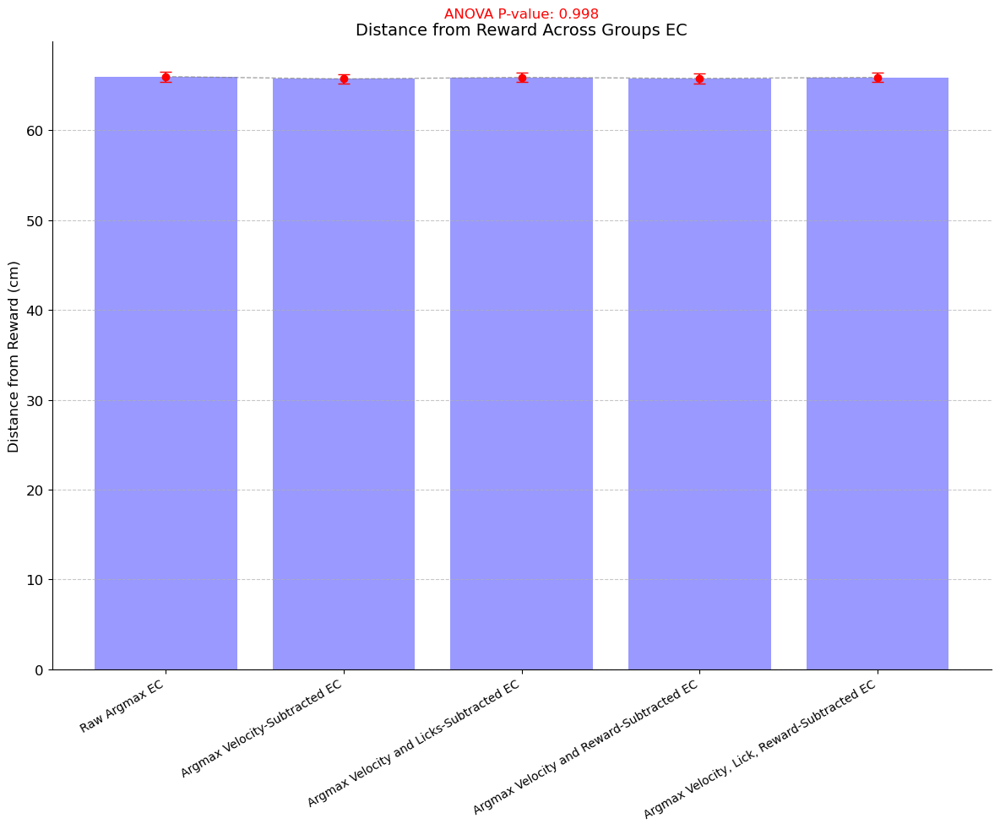

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1  -0.2588 0.9973 -2.3667  1.849  False
     0      2  -0.0859    1.0 -2.1937  2.022  False
     0      3  -0.2033 0.9989 -2.3111 1.9046  False
     0      4  -0.0884    1.0 -2.1962 2.0195  False
     1      2    0.173 0.9994 -1.9349 2.2808  False
     1      3   0.0556    1.0 -2.0523 2.1634  False
     1      4   0.1705 0.9995 -1.9374 2.2783  False
     2      3  -0.1174 0.9999 -2.2253 1.9904  False
     2      4  -0.0025    1.0 -2.1104 2.1053  False
     3      4   0.1149 0.9999  -1.993 2.2227  False
---------------------------------------------------


In [40]:
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import matplotlib.pyplot as plt

# Data groups
groups = [
    argmax_EC_dist_reward_raw,
    argmax_EC_dist_reward_velocity,
    argmax_EC_dist_reward_vl,
    argmax_EC_dist_reward_vr,
    argmax_EC_dist_reward_vrl
]

# Labels for the groups
group_labels = [
    "Raw Argmax EC",
    "Argmax Velocity-Subtracted EC",
    "Argmax Velocity and Licks-Subtracted EC",
    "Argmax Velocity and Reward-Subtracted EC",
    "Argmax Velocity, Lick, Reward-Subtracted EC"
]

# Flatten data for Tukey's test
flat_data = np.concatenate(groups)
group_indices = np.concatenate([[i] * len(group) for i, group in enumerate(groups)])

# Perform one-way ANOVA
f_stat, p_value_anova = f_oneway(*groups)

# Perform Tukey's HSD test
tukey = pairwise_tukeyhsd(flat_data, group_indices)

# Calculate means and SEMs for each group
means = [np.mean(group) for group in groups]
sems = [np.std(group) / np.sqrt(len(group)) for group in groups]

# Plotting
plt.figure(figsize=(12, 10))
x_positions = np.arange(len(groups))

# Plot bars for means
plt.bar(x_positions, means, alpha=0.4, color='blue', label='Groups')
plt.errorbar(x_positions, means, yerr=sems, fmt='o', color='red', capsize=5, label='Mean ± SEM')

# Grey line connecting means
plt.plot(x_positions, means, color='gray', linestyle='--', linewidth=1, alpha=0.7, label='Mean Line')

# # Add Tukey HSD pairwise comparisons
y_max = max(means) + max(sems) +1 

# bar_spacing = 3  # Space between each bar
# line_height_increment = 10  # Increment for each comparison
current_height = y_max

# for row in tukey._results_table.data[1:]:  # Skip the header row
#     group1, group2, _, p_val, _, _, _ = row
#     x1, x2 = x_positions[int(group1)], x_positions[int(group2)]
    
#     # Plot horizontal Tukey line
#     plt.plot([x1, x1, x2, x2], [current_height, current_height + bar_spacing, current_height + bar_spacing, current_height], color='black', linewidth=1)
    
#     # Add p-value text
#     plt.text((x1 + x2) / 2, current_height + bar_spacing + 0.5, f"P = {p_val:.3f}", ha='center', fontsize=9)
    
#     # Update height for next line
#     current_height += line_height_increment

# Customize plot
plt.xticks(x_positions, group_labels, rotation=30, ha='right', fontsize=10)
plt.ylabel('Distance from Reward (cm)', fontsize=12)
plt.title('Distance from Reward Across Groups EC', fontsize=14)
plt.text(len(groups) / 2 - 0.5, current_height + 5, f"ANOVA P-value: {p_value_anova:.3f}", ha='center', color='red', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print Tukey's HSD summary
print(tukey.summary())


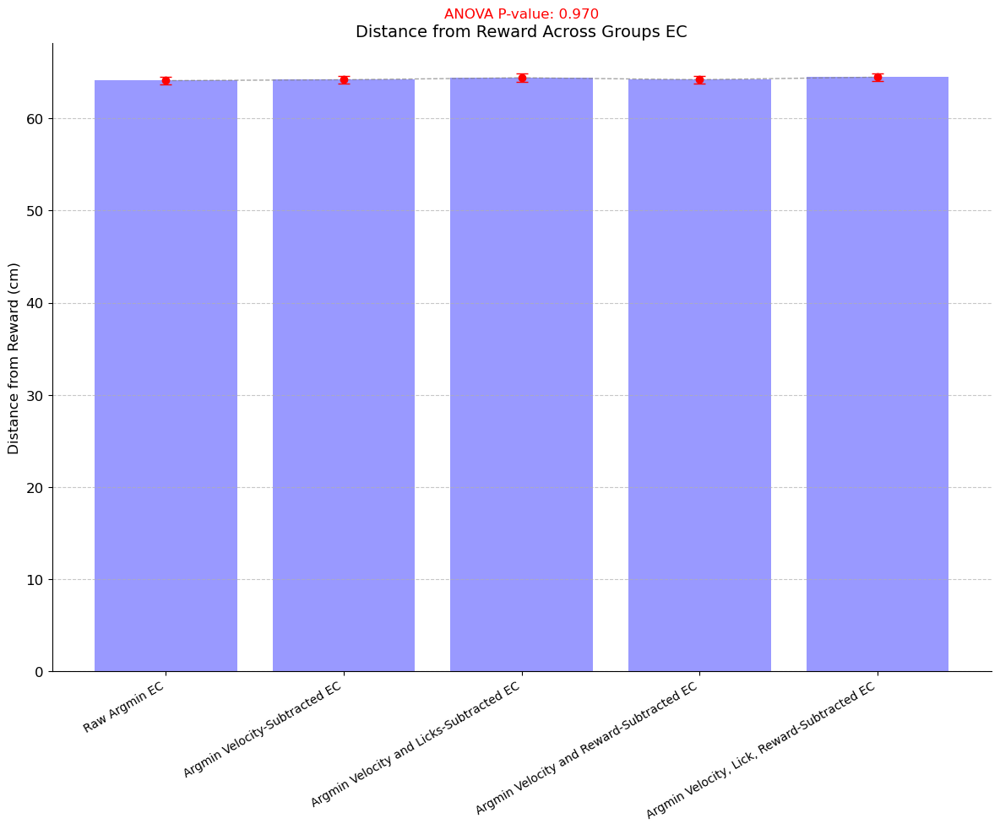

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     0      1    0.096 0.9999 -1.5808 1.7727  False
     0      2   0.3093  0.987 -1.3674 1.9861  False
     0      3   0.1048 0.9998  -1.572 1.7816  False
     0      4   0.3775 0.9728 -1.2993 2.0543  False
     1      2   0.2134 0.9969 -1.4634 1.8902  False
     1      3   0.0088    1.0 -1.6679 1.6856  False
     1      4   0.2816 0.9909 -1.3952 1.9583  False
     2      3  -0.2045 0.9974 -1.8813 1.4722  False
     2      4   0.0682    1.0 -1.6086  1.745  False
     3      4   0.2727  0.992 -1.4041 1.9495  False
---------------------------------------------------


In [41]:
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import matplotlib.pyplot as plt

# Data groups
groups = [
    argmin_EC_dist_reward_raw,
    argmin_EC_dist_reward_velocity,
    argmin_EC_dist_reward_vl,
    argmin_EC_dist_reward_vr,
    argmin_EC_dist_reward_vrl
]

# Labels for the groups
group_labels = [
    "Raw Argmin EC",
    "Argmin Velocity-Subtracted EC",
    "Argmin Velocity and Licks-Subtracted EC",
    "Argmin Velocity and Reward-Subtracted EC",
    "Argmin Velocity, Lick, Reward-Subtracted EC"
]

# Flatten data for Tukey's test
flat_data = np.concatenate(groups)
group_indices = np.concatenate([[i] * len(group) for i, group in enumerate(groups)])

# Perform one-way ANOVA
f_stat, p_value_anova = f_oneway(*groups)

# Perform Tukey's HSD test
tukey = pairwise_tukeyhsd(flat_data, group_indices)

# Calculate means and SEMs for each group
means = [np.mean(group) for group in groups]
sems = [np.std(group) / np.sqrt(len(group)) for group in groups]

# Plotting
plt.figure(figsize=(12, 10))
x_positions = np.arange(len(groups))

# Plot bars for means
plt.bar(x_positions, means, alpha=0.4, color='blue', label='Groups')
plt.errorbar(x_positions, means, yerr=sems, fmt='o', color='red', capsize=5, label='Mean ± SEM')

# Grey line connecting means
plt.plot(x_positions, means, color='gray', linestyle='--', linewidth=1, alpha=0.7, label='Mean Line')

# # Add Tukey HSD pairwise comparisons
y_max = max(means) + max(sems) +1 

# bar_spacing = 3  # Space between each bar
# line_height_increment = 10  # Increment for each comparison
current_height = y_max

# for row in tukey._results_table.data[1:]:  # Skip the header row
#     group1, group2, _, p_val, _, _, _ = row
#     x1, x2 = x_positions[int(group1)], x_positions[int(group2)]
    
#     # Plot horizontal Tukey line
#     plt.plot([x1, x1, x2, x2], [current_height, current_height + bar_spacing, current_height + bar_spacing, current_height], color='black', linewidth=1)
    
#     # Add p-value text
#     plt.text((x1 + x2) / 2, current_height + bar_spacing + 0.5, f"P = {p_val:.3f}", ha='center', fontsize=9)
    
#     # Update height for next line
#     current_height += line_height_increment

# Customize plot
plt.xticks(x_positions, group_labels, rotation=30, ha='right', fontsize=10)
plt.ylabel('Distance from Reward (cm)', fontsize=12)
plt.title('Distance from Reward Across Groups EC', fontsize=14)
plt.text(len(groups) / 2 - 0.5, current_height + 5, f"ANOVA P-value: {p_value_anova:.3f}", ha='center', color='red', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Print Tukey's HSD summary
print(tukey.summary())
